In [628]:
#Импортирование необходимых библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error as MSE
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from random import sample
from numpy.random import uniform
from math import isnan
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN

In [147]:
df = pd.read_csv("CC GENERAL.csv")
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [148]:
#Посмотрим основную информацию о данных
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [149]:
#Посмотри типы данных в колонках
df.dtypes
#Видно, что все типы имеют численный тип данных, кроме индекса, который стоит удалить

CUST_ID                              object
BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [150]:
df.drop("CUST_ID", axis=1, inplace=True)
print("Данная колонка успешно была удалена!")

Данная колонка успешно была удалена!


In [151]:
#Посмотрим на количество дубликатов 
print(f"Количество дубликатов: {df.duplicated().sum()}")

Количество дубликатов: 0


In [152]:
#Посмотрим на пропуски
pd.DataFrame({"Количество пропусков": df.isna().sum(), "Количество пропусков в %": np.round(df.isna().sum() / len(df) * 100, 3),
             "Количество уникальных значений": df.nunique()})

,Количество пропусков,Количество пропусков в %,Количество уникальных значений
BALANCE,0,0.000,8871
BALANCE_FREQUENCY,0,0.000,43
PURCHASES,0,0.000,6203
ONEOFF_PURCHASES,0,0.000,4014
INSTALLMENTS_PURCHASES,0,0.000,4452
CASH_ADVANCE,0,0.000,4323
PURCHASES_FREQUENCY,0,0.000,47
ONEOFF_PURCHASES_FREQUENCY,0,0.000,47
PURCHASES_INSTALLMENTS_FREQUENCY,0,0.000,47
CASH_ADVANCE_FREQUENCY,0,0.000,54


In [153]:
#Вспомогательный словарик для перевод фичей
feature_translation_dict = {
    'BALANCE': 'Баланс на счете',
    'BALANCE_FREQUENCY': 'Частота обновления баланса',
    'PURCHASES': 'Сумма покупок',
    'ONEOFF_PURCHASES': 'Сумма разовых покупок',
    'INSTALLMENTS_PURCHASES': 'Сумма покупок в рассрочку',
    'CASH_ADVANCE': 'Сумма аванса наличными',
    'PURCHASES_FREQUENCY': 'Частота покупок',
    'ONEOFF_PURCHASES_FREQUENCY': 'Частота разовых покупок',
    'PURCHASES_INSTALLMENTS_FREQUENCY': 'Частота покупок в рассрочку',
    'CASH_ADVANCE_FREQUENCY': 'Частота получения аванса',
    'CASH_ADVANCE_TRX': 'Кол-во транзакций аванса',
    'PURCHASES_TRX': 'Кол-во транзакций покупок',
    'CREDIT_LIMIT': 'Кредитный лимит',
    'PAYMENTS': 'Сумма платежей',
    'MINIMUM_PAYMENTS': 'Сумма минимальных платежей',
    'PRC_FULL_PAYMENT': '% полной оплаты долга',
    'TENURE': 'Срок обслуживания карты (мес.)'
}

In [154]:
#Функция, которая отрисовывает boxplot
def boxplot_drow(df, col, feature_dict):
    fig = plt.figure(figsize=(4, 3.75), dpi=250)
    plt.title(feature_dict[col])
    plt.ylabel(col)
    print("-------------------------------------------")
    print(f"Основные статистики: {df[col].describe()}")
    print("-------------------------------------------")
    sns.boxplot(data=df, y=col, color="pink")
    plt.show()

-------------------------------------------
Основные статистики: count     8950.000000
mean      1564.474828
std       2081.531879
min          0.000000
25%        128.281915
50%        873.385231
75%       2054.140036
max      19043.138560
Name: BALANCE, dtype: float64
-------------------------------------------


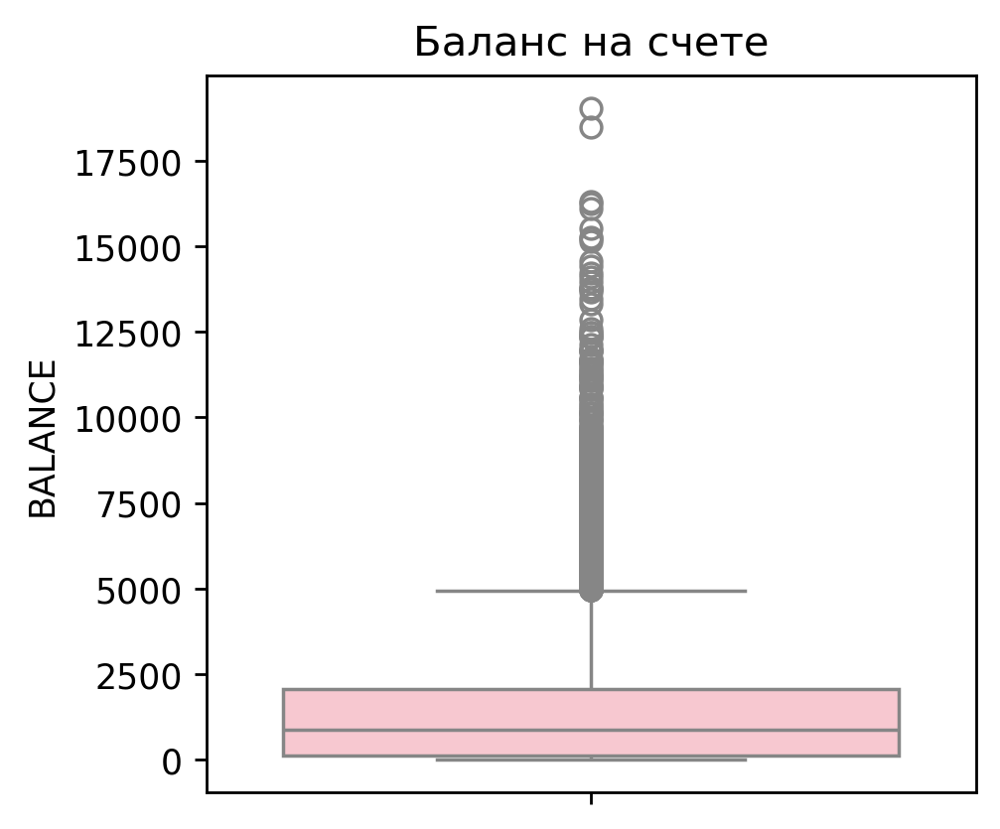

-------------------------------------------
Основные статистики: count    8950.000000
mean        0.877271
std         0.236904
min         0.000000
25%         0.888889
50%         1.000000
75%         1.000000
max         1.000000
Name: BALANCE_FREQUENCY, dtype: float64
-------------------------------------------


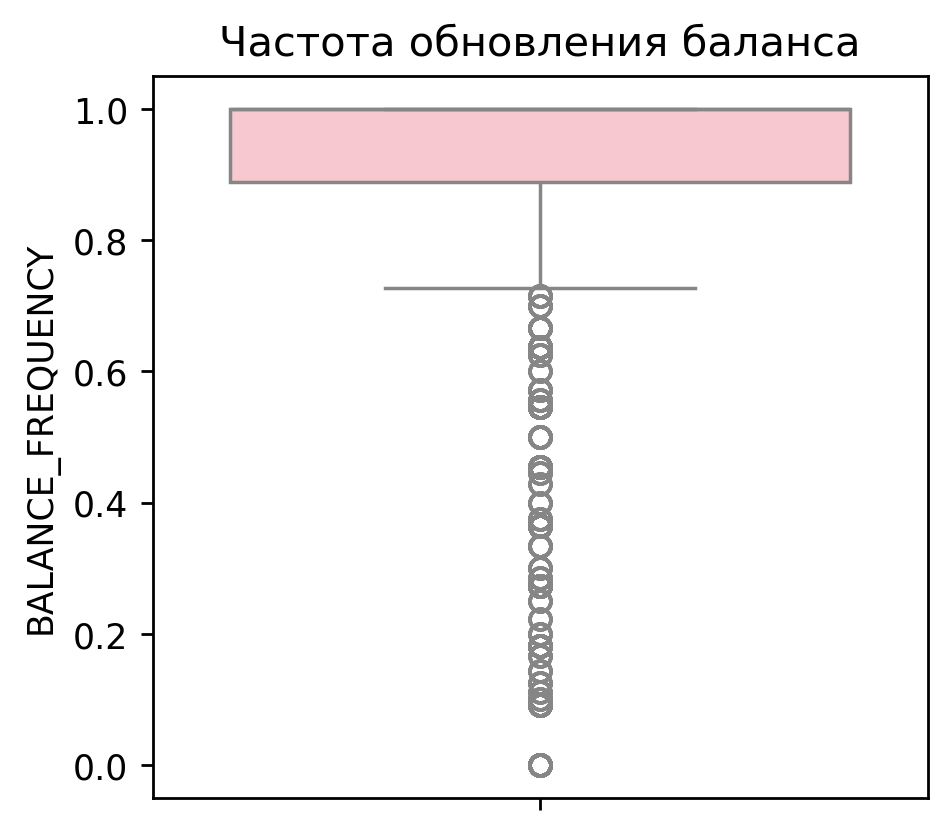

-------------------------------------------
Основные статистики: count     8950.000000
mean      1003.204834
std       2136.634782
min          0.000000
25%         39.635000
50%        361.280000
75%       1110.130000
max      49039.570000
Name: PURCHASES, dtype: float64
-------------------------------------------


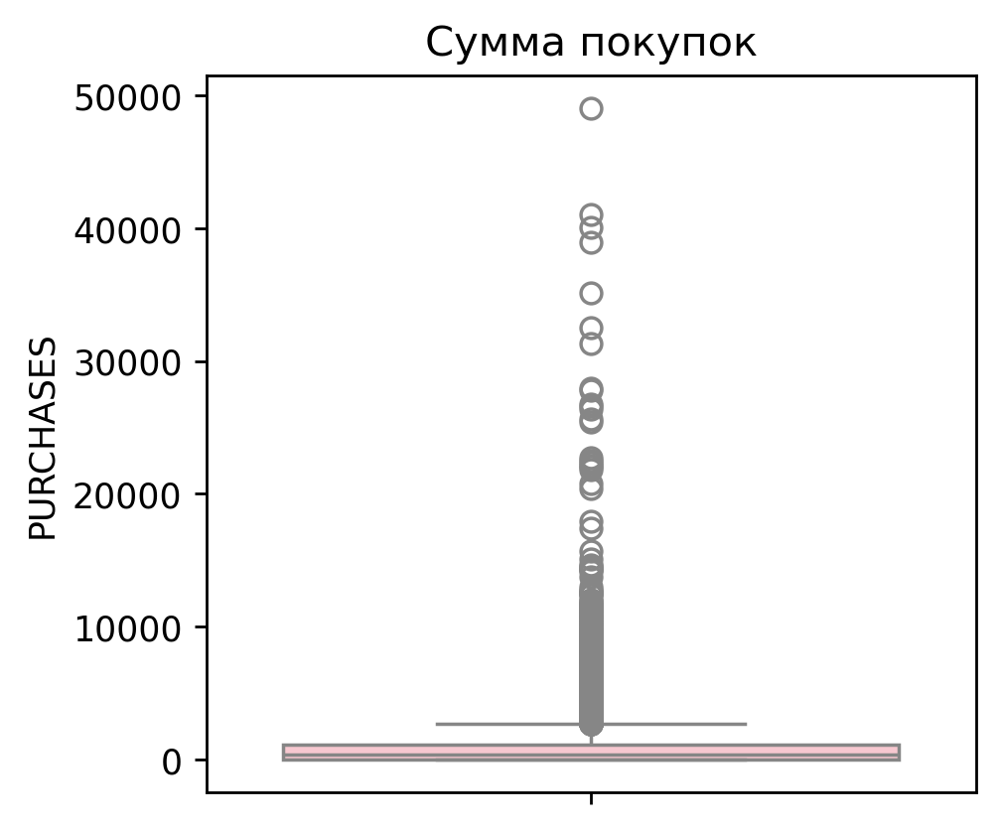

-------------------------------------------
Основные статистики: count     8950.000000
mean       592.437371
std       1659.887917
min          0.000000
25%          0.000000
50%         38.000000
75%        577.405000
max      40761.250000
Name: ONEOFF_PURCHASES, dtype: float64
-------------------------------------------


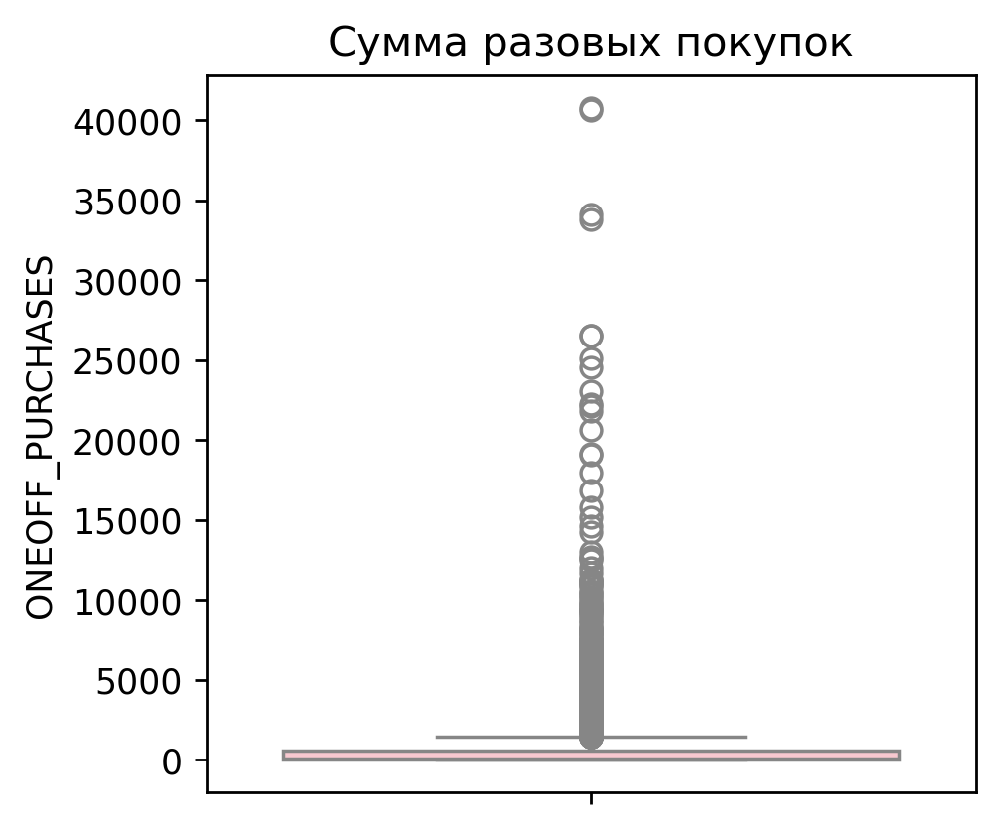

-------------------------------------------
Основные статистики: count     8950.000000
mean       411.067645
std        904.338115
min          0.000000
25%          0.000000
50%         89.000000
75%        468.637500
max      22500.000000
Name: INSTALLMENTS_PURCHASES, dtype: float64
-------------------------------------------


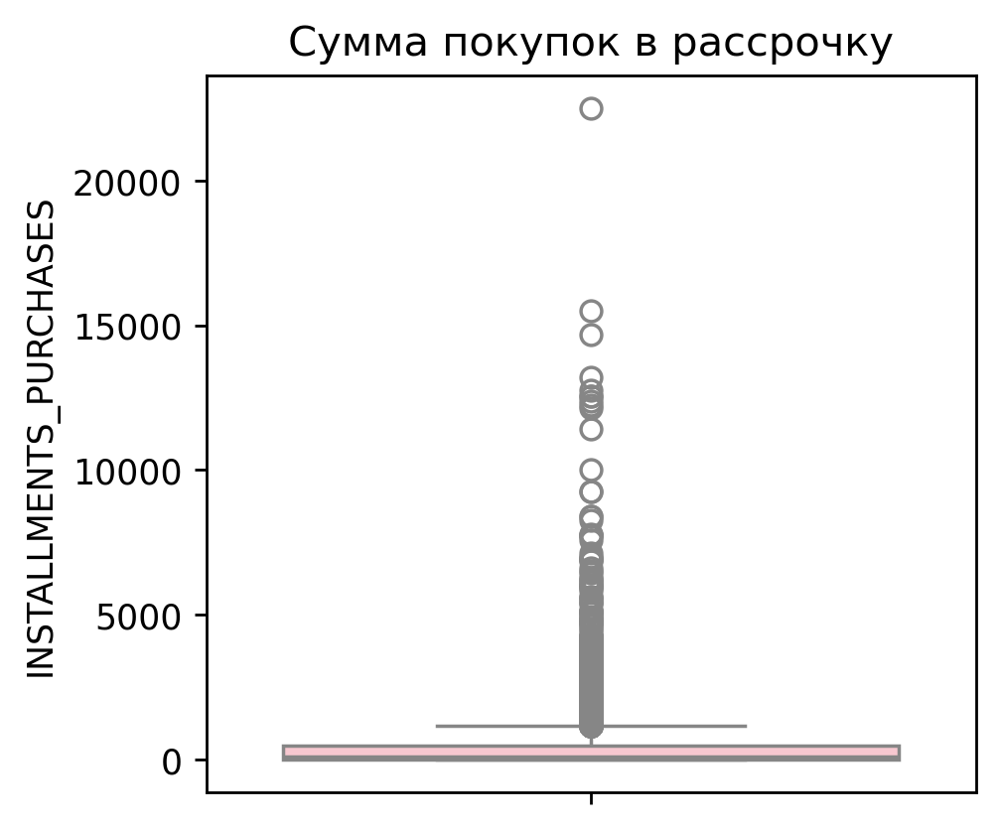

-------------------------------------------
Основные статистики: count     8950.000000
mean       978.871112
std       2097.163877
min          0.000000
25%          0.000000
50%          0.000000
75%       1113.821139
max      47137.211760
Name: CASH_ADVANCE, dtype: float64
-------------------------------------------


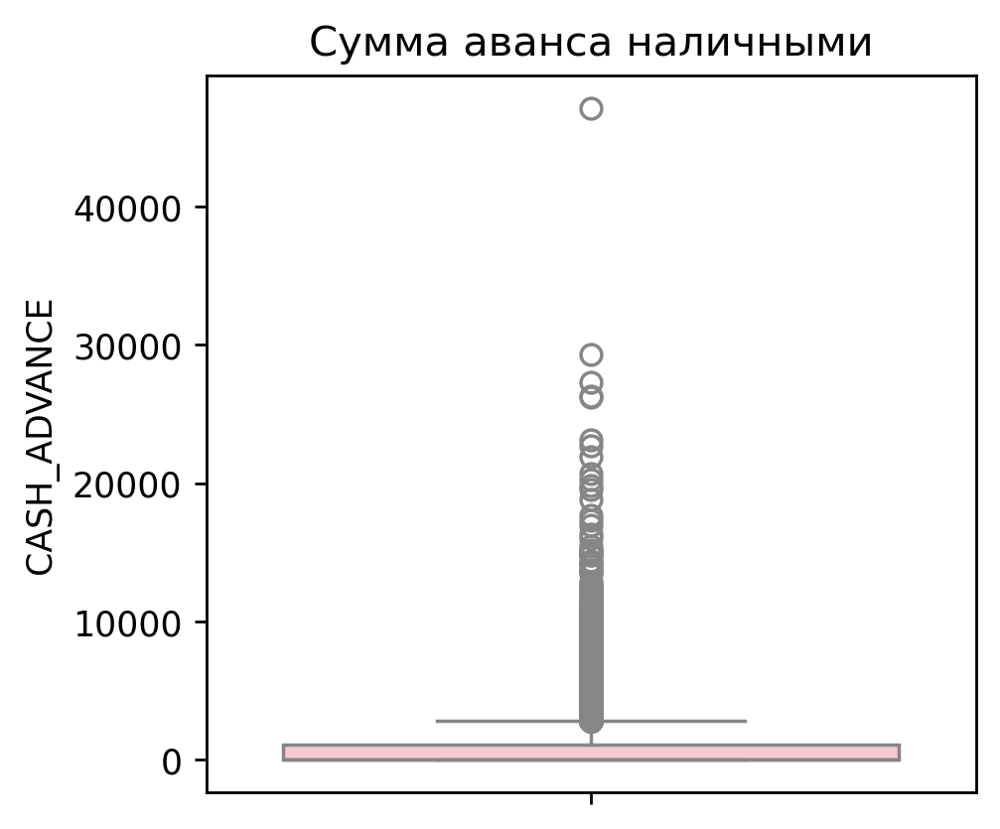

-------------------------------------------
Основные статистики: count    8950.000000
mean        0.490351
std         0.401371
min         0.000000
25%         0.083333
50%         0.500000
75%         0.916667
max         1.000000
Name: PURCHASES_FREQUENCY, dtype: float64
-------------------------------------------


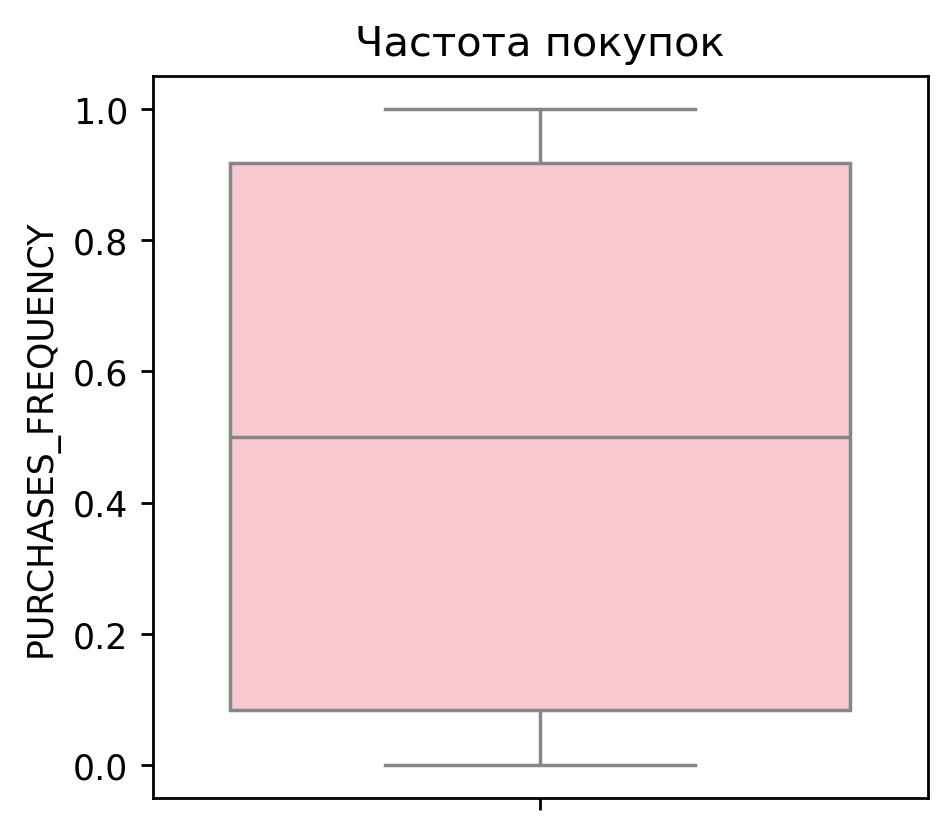

-------------------------------------------
Основные статистики: count    8950.000000
mean        0.202458
std         0.298336
min         0.000000
25%         0.000000
50%         0.083333
75%         0.300000
max         1.000000
Name: ONEOFF_PURCHASES_FREQUENCY, dtype: float64
-------------------------------------------


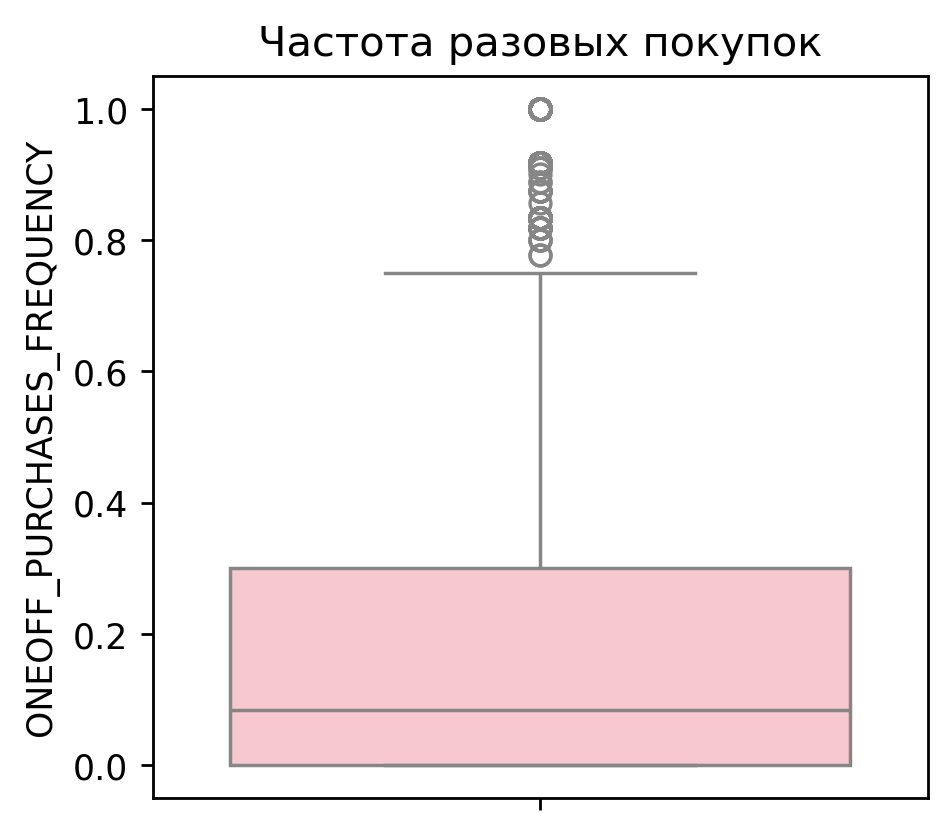

-------------------------------------------
Основные статистики: count    8950.000000
mean        0.364437
std         0.397448
min         0.000000
25%         0.000000
50%         0.166667
75%         0.750000
max         1.000000
Name: PURCHASES_INSTALLMENTS_FREQUENCY, dtype: float64
-------------------------------------------


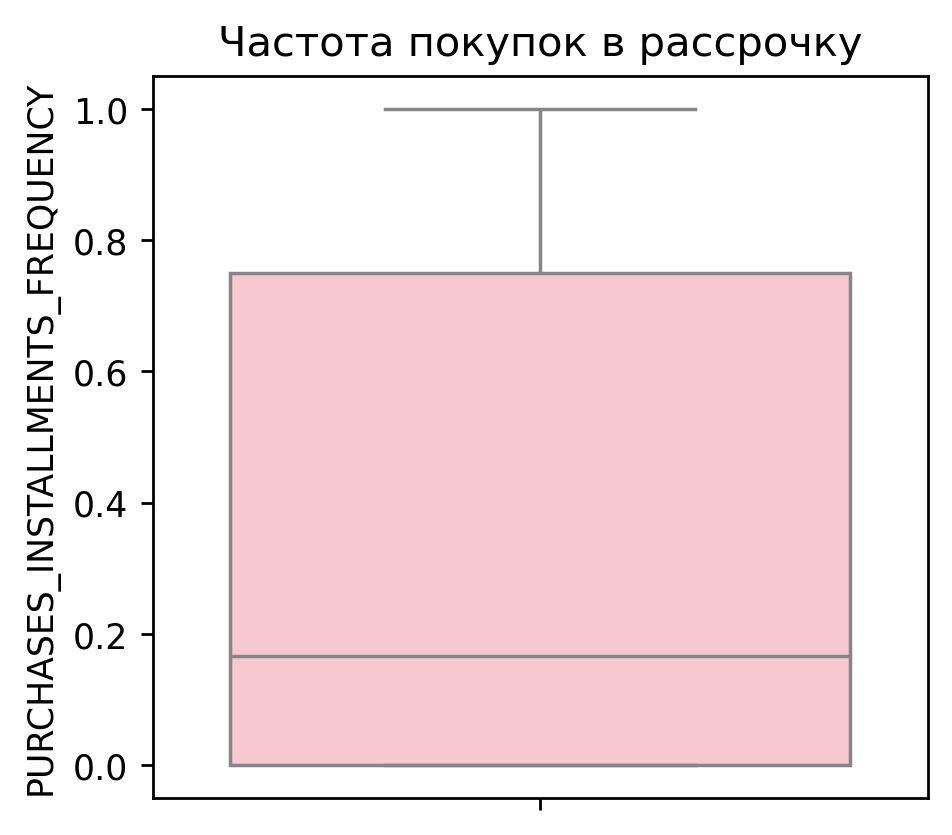

-------------------------------------------
Основные статистики: count    8950.000000
mean        0.135144
std         0.200121
min         0.000000
25%         0.000000
50%         0.000000
75%         0.222222
max         1.500000
Name: CASH_ADVANCE_FREQUENCY, dtype: float64
-------------------------------------------


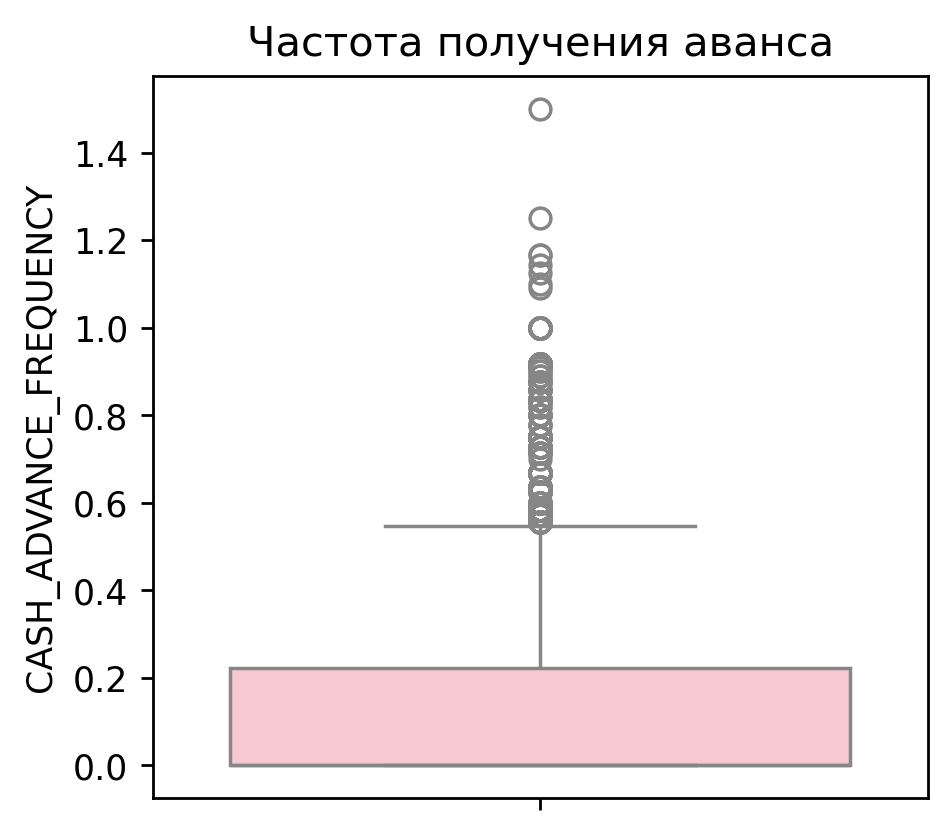

-------------------------------------------
Основные статистики: count    8950.000000
mean        3.248827
std         6.824647
min         0.000000
25%         0.000000
50%         0.000000
75%         4.000000
max       123.000000
Name: CASH_ADVANCE_TRX, dtype: float64
-------------------------------------------


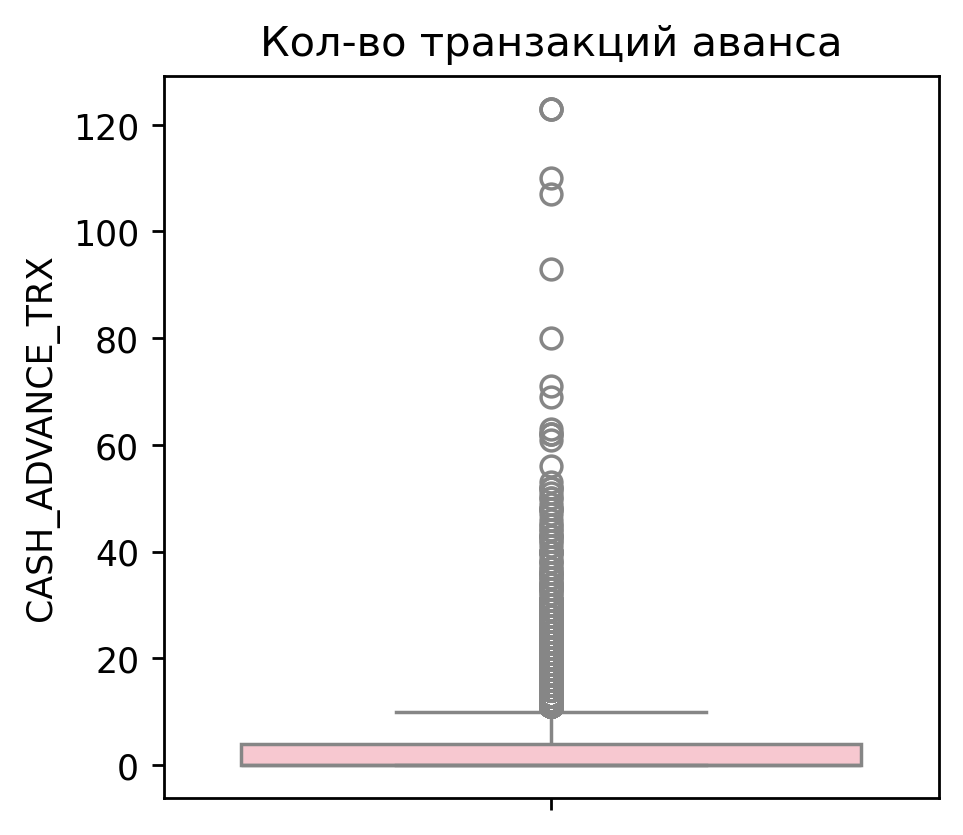

-------------------------------------------
Основные статистики: count    8950.000000
mean       14.709832
std        24.857649
min         0.000000
25%         1.000000
50%         7.000000
75%        17.000000
max       358.000000
Name: PURCHASES_TRX, dtype: float64
-------------------------------------------


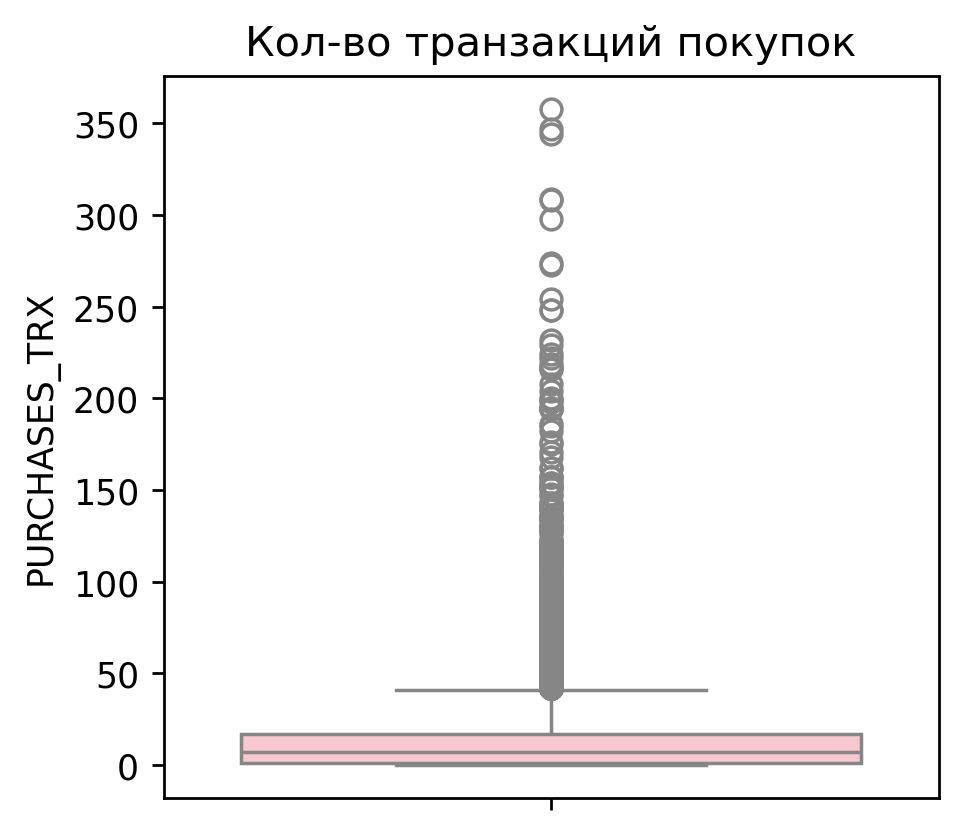

-------------------------------------------
Основные статистики: count     8949.000000
mean      4494.449450
std       3638.815725
min         50.000000
25%       1600.000000
50%       3000.000000
75%       6500.000000
max      30000.000000
Name: CREDIT_LIMIT, dtype: float64
-------------------------------------------


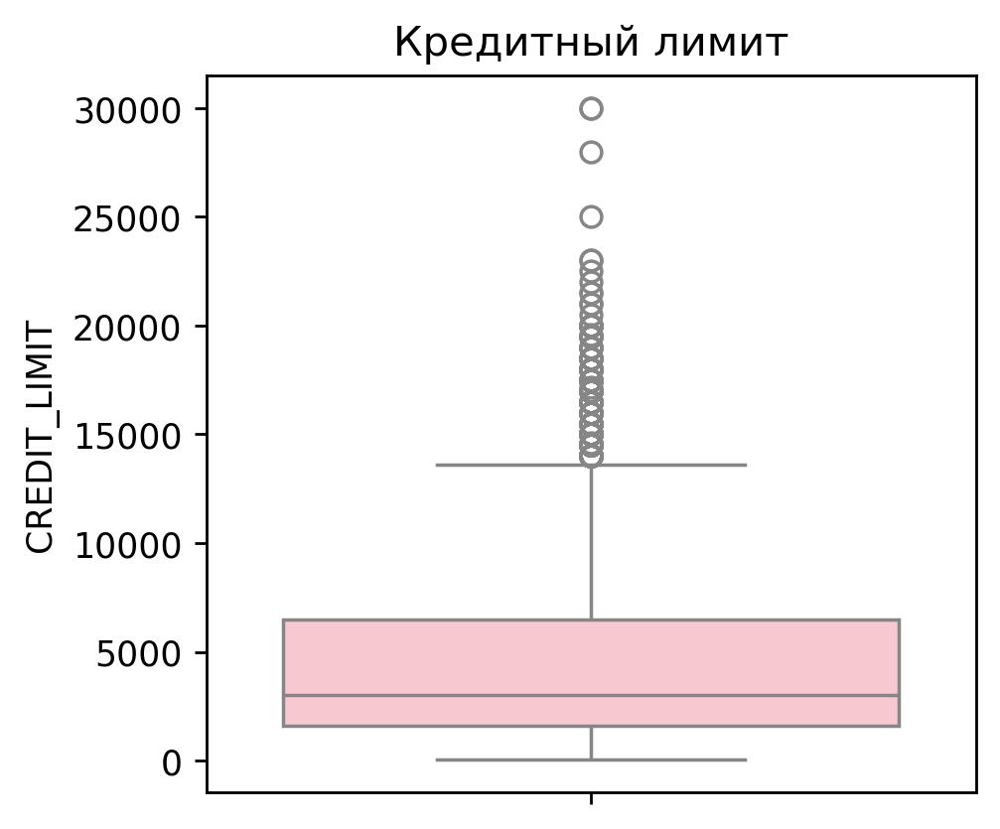

-------------------------------------------
Основные статистики: count     8950.000000
mean      1733.143852
std       2895.063757
min          0.000000
25%        383.276166
50%        856.901546
75%       1901.134317
max      50721.483360
Name: PAYMENTS, dtype: float64
-------------------------------------------


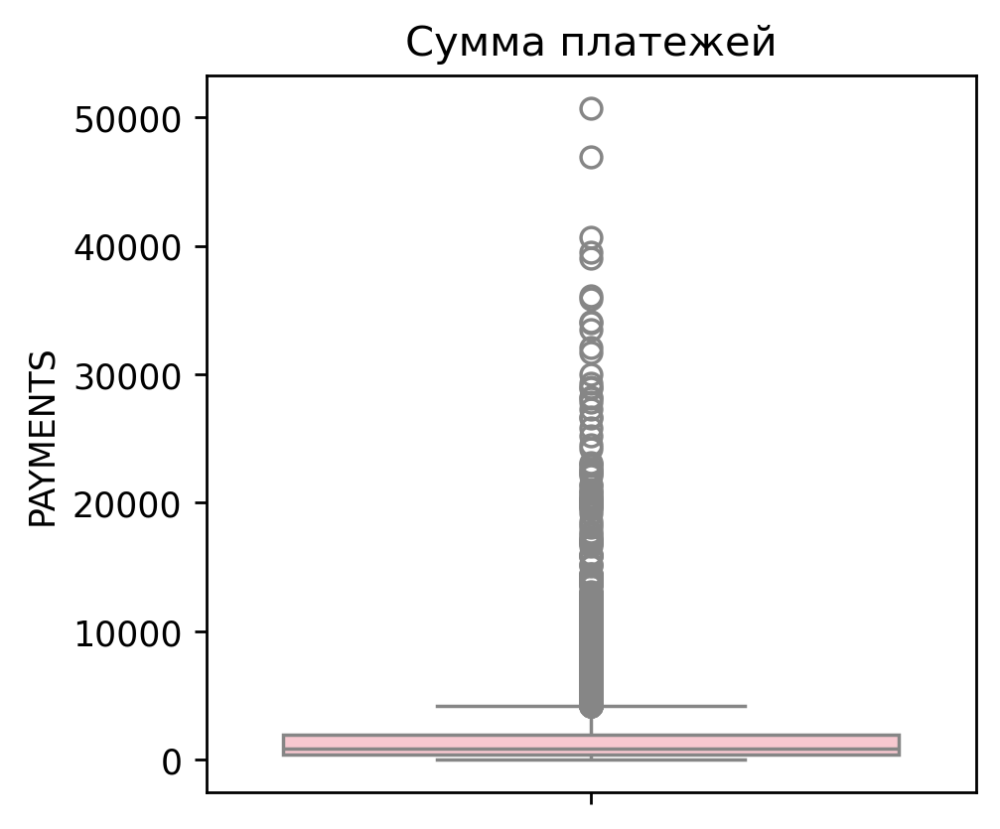

-------------------------------------------
Основные статистики: count     8637.000000
mean       864.206542
std       2372.446607
min          0.019163
25%        169.123707
50%        312.343947
75%        825.485459
max      76406.207520
Name: MINIMUM_PAYMENTS, dtype: float64
-------------------------------------------


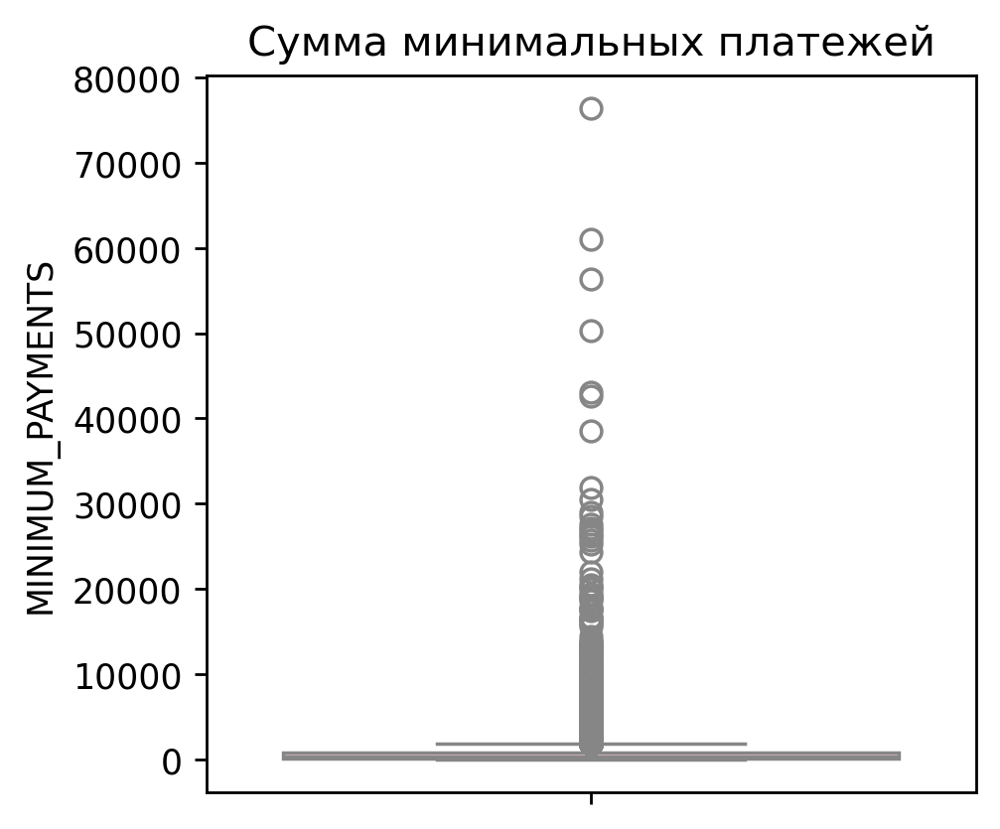

-------------------------------------------
Основные статистики: count    8950.000000
mean        0.153715
std         0.292499
min         0.000000
25%         0.000000
50%         0.000000
75%         0.142857
max         1.000000
Name: PRC_FULL_PAYMENT, dtype: float64
-------------------------------------------


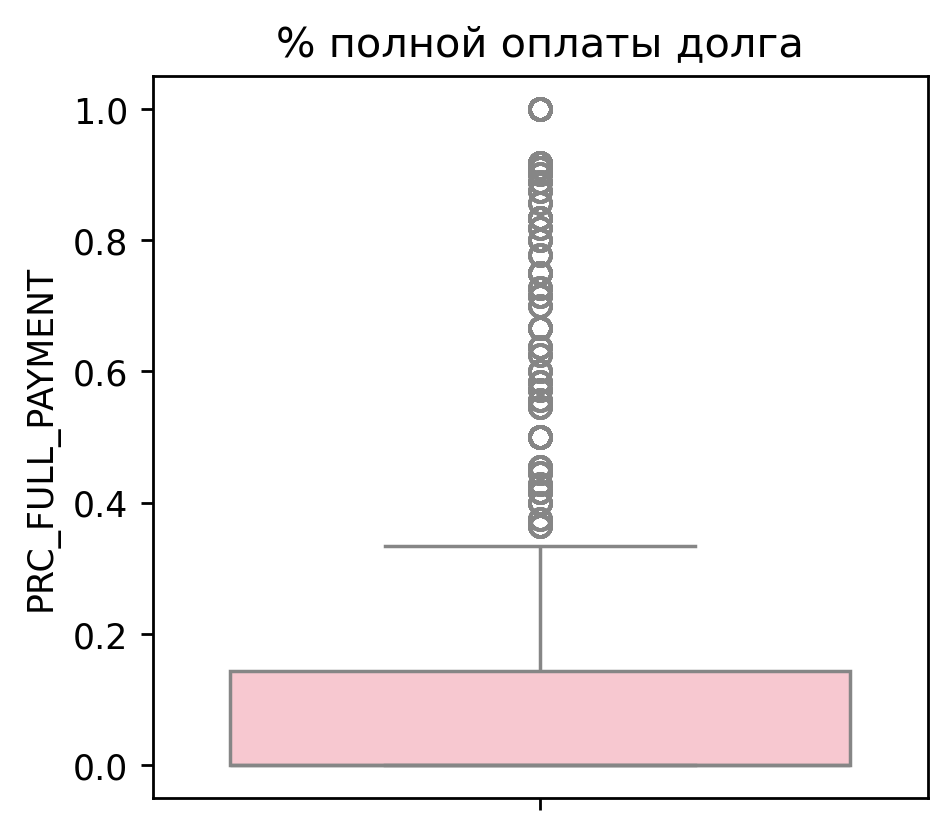

-------------------------------------------
Основные статистики: count    8950.000000
mean       11.517318
std         1.338331
min         6.000000
25%        12.000000
50%        12.000000
75%        12.000000
max        12.000000
Name: TENURE, dtype: float64
-------------------------------------------


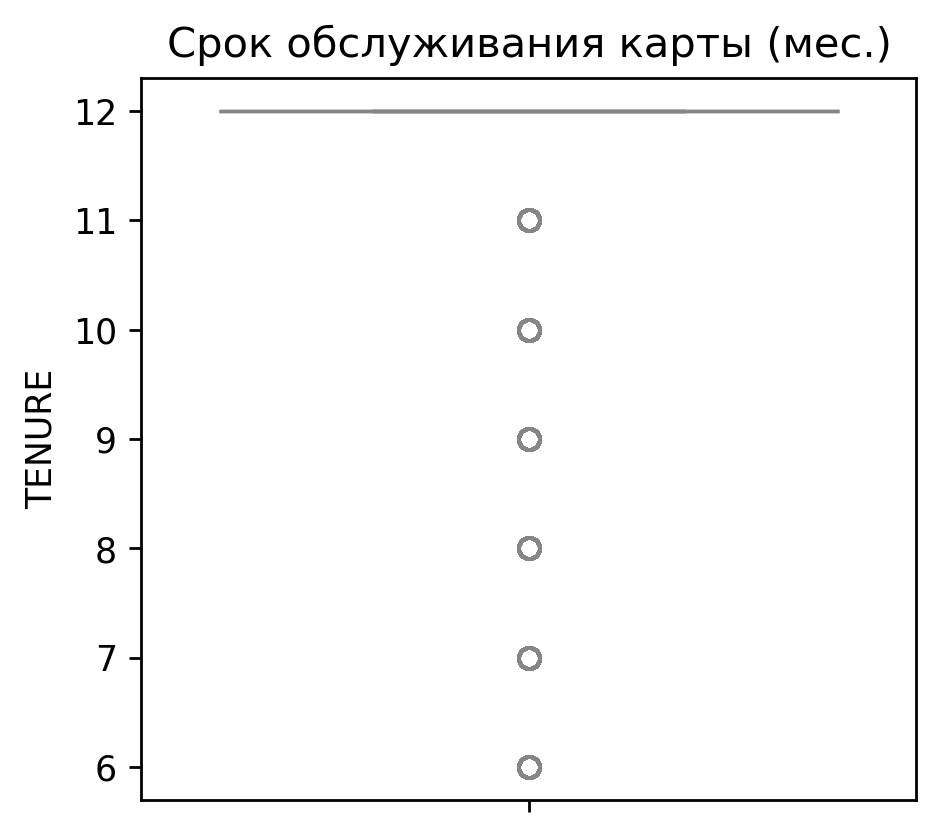

In [155]:
for col in df.columns:
    boxplot_drow(df, col, feature_translation_dict)

In [156]:
#Уберем у колонок выбросы, составим список колонок, где нужно убрать выбросы
#В качестве интервала оставим данные только входящие от 0 до 0.985
emissions_list = ["BALANCE", "PURCHASES", "ONEOFF_PURCHASES", "INSTALLMENTS_PURCHASES", "CASH_ADVANCE", "CASH_ADVANCE_FREQUENCY",
                 "CASH_ADVANCE_TRX", "PURCHASES_TRX", "CREDIT_LIMIT", "PAYMENTS"]
threshhold_dict = {}
for col in emissions_list:
    threshhold_dict[col] = df[col].quantile(0.95)
#Выкинем все данные не вошедшие в граничные значения колонок 
for col in emissions_list:
    df = df[df[col] <= threshhold_dict[col]]
print("Выбросы были успешно удалены!")

Выбросы были успешно удалены!


-------------------------------------------
Основные статистики: count    6906.000000
mean     1022.931410
std      1207.728091
min         0.000000
25%        77.141458
50%       609.991646
75%      1502.499601
max      5901.592192
Name: BALANCE, dtype: float64
-------------------------------------------


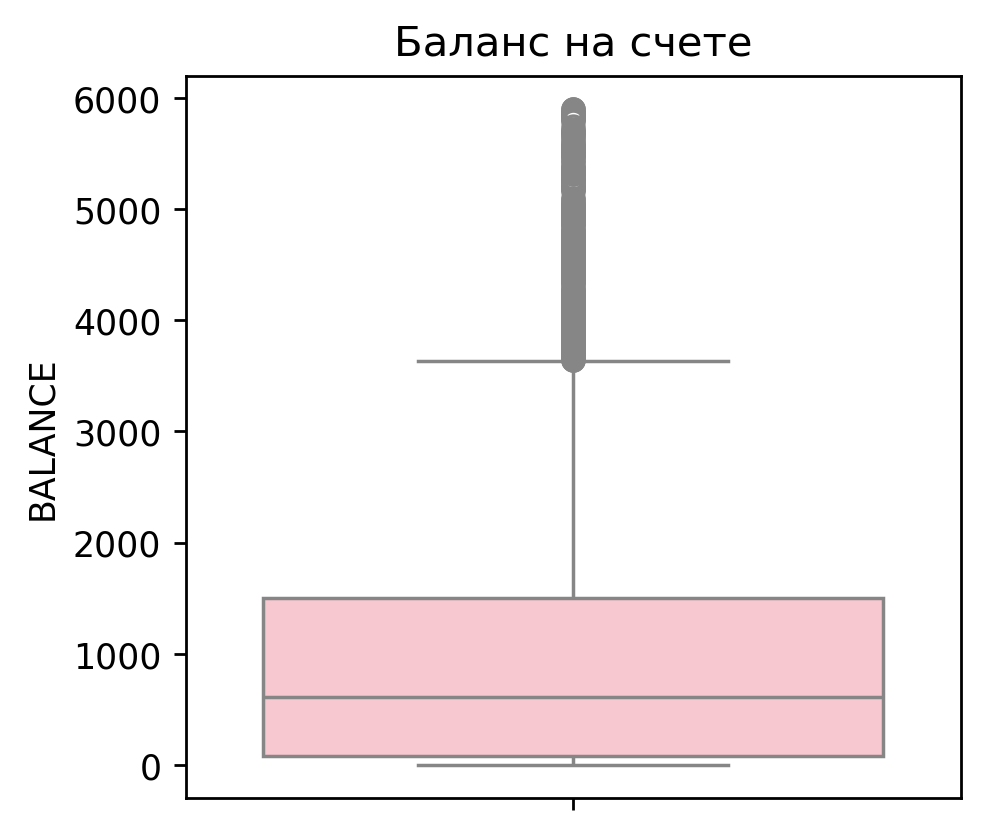

-------------------------------------------
Основные статистики: count    6906.000000
mean        0.858844
std         0.252561
min         0.000000
25%         0.818182
50%         1.000000
75%         1.000000
max         1.000000
Name: BALANCE_FREQUENCY, dtype: float64
-------------------------------------------


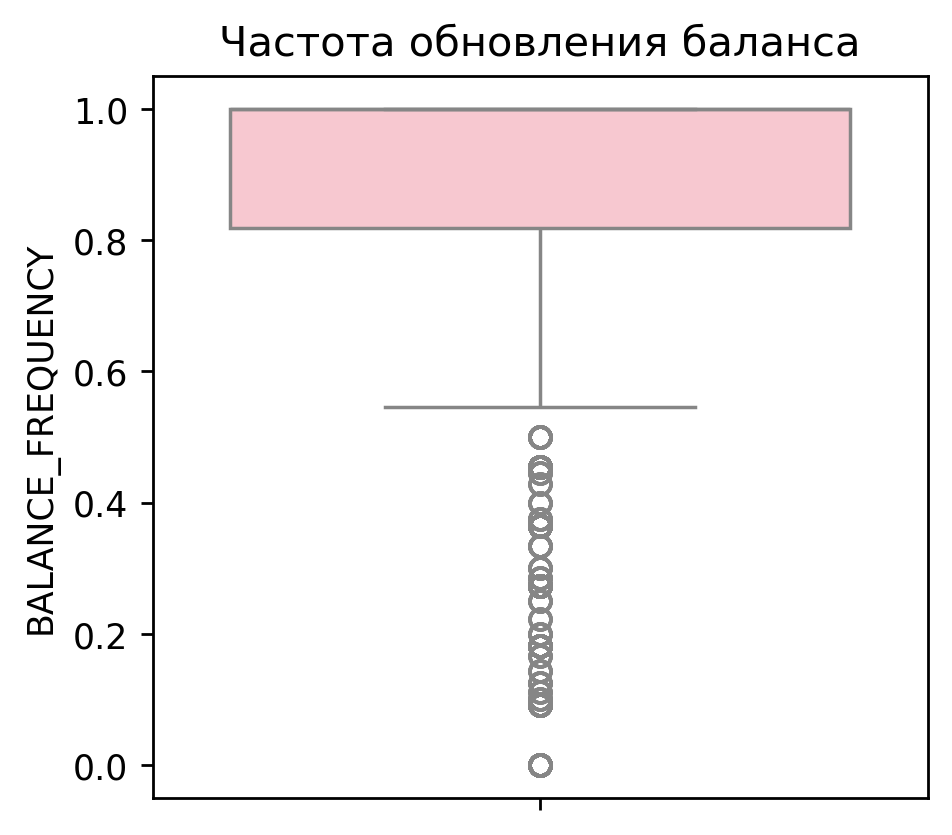

-------------------------------------------
Основные статистики: count    6906.000000
mean      543.773309
std       664.915251
min         0.000000
25%        38.737500
50%       300.000000
75%       795.562500
max      3937.590000
Name: PURCHASES, dtype: float64
-------------------------------------------


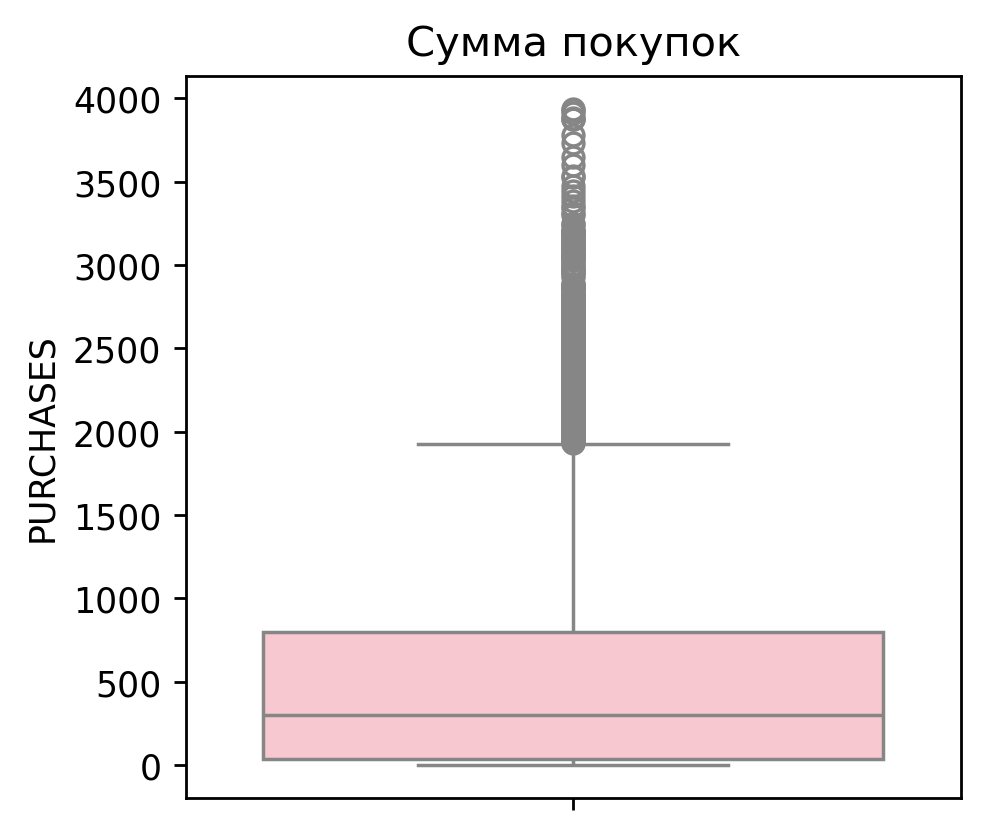

-------------------------------------------
Основные статистики: count    6906.000000
mean      299.432346
std       518.961166
min         0.000000
25%         0.000000
50%         0.000000
75%       391.965000
max      2655.990000
Name: ONEOFF_PURCHASES, dtype: float64
-------------------------------------------


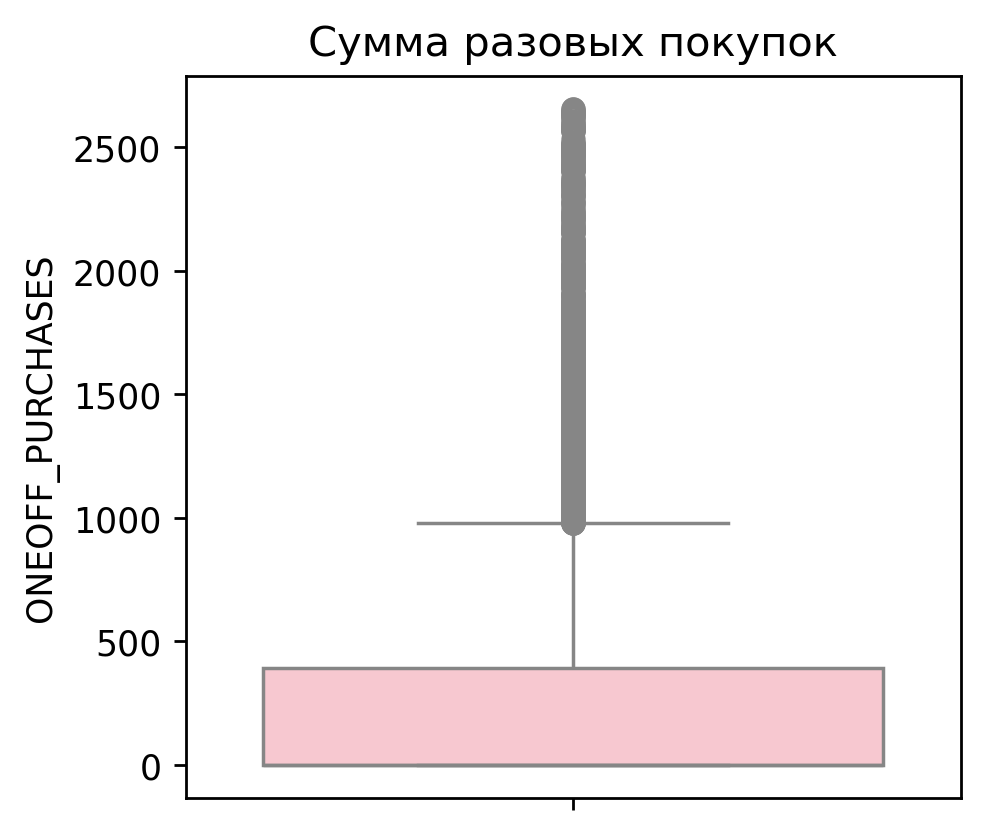

-------------------------------------------
Основные статистики: count    6906.000000
mean      244.623135
std       356.050792
min         0.000000
25%         0.000000
50%        72.000000
75%       371.010000
max      1740.380000
Name: INSTALLMENTS_PURCHASES, dtype: float64
-------------------------------------------


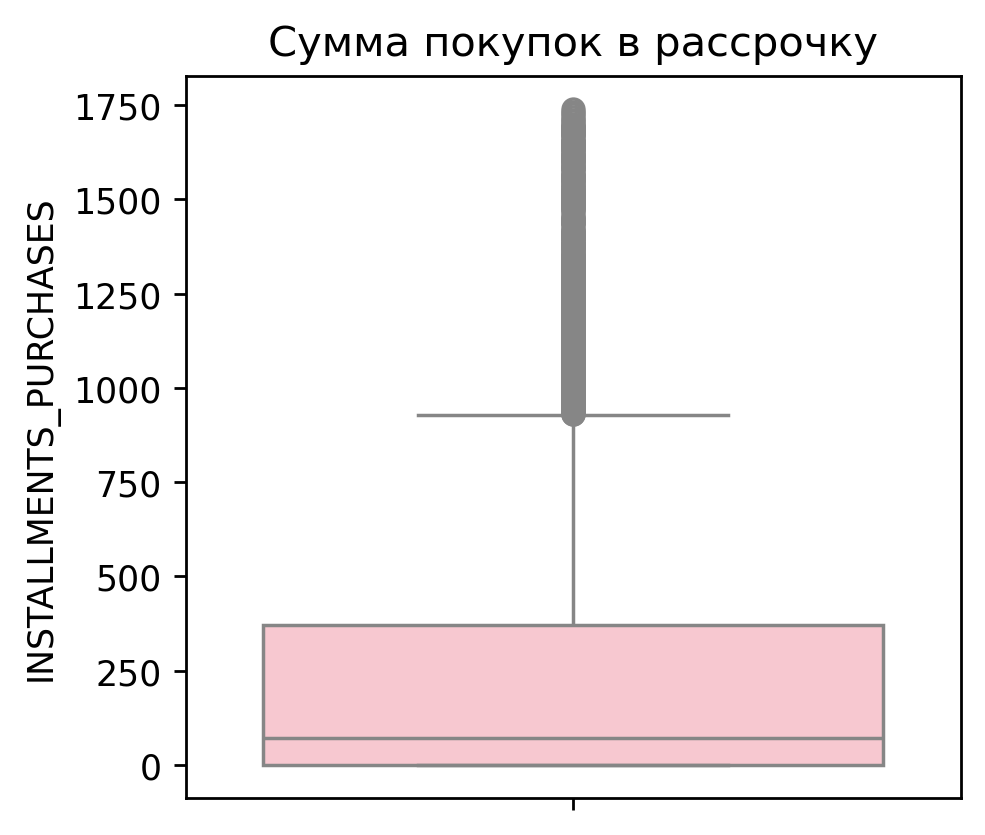

-------------------------------------------
Основные статистики: count    6906.000000
mean      495.786599
std       895.071547
min         0.000000
25%         0.000000
50%         0.000000
75%       647.872252
max      4620.069456
Name: CASH_ADVANCE, dtype: float64
-------------------------------------------


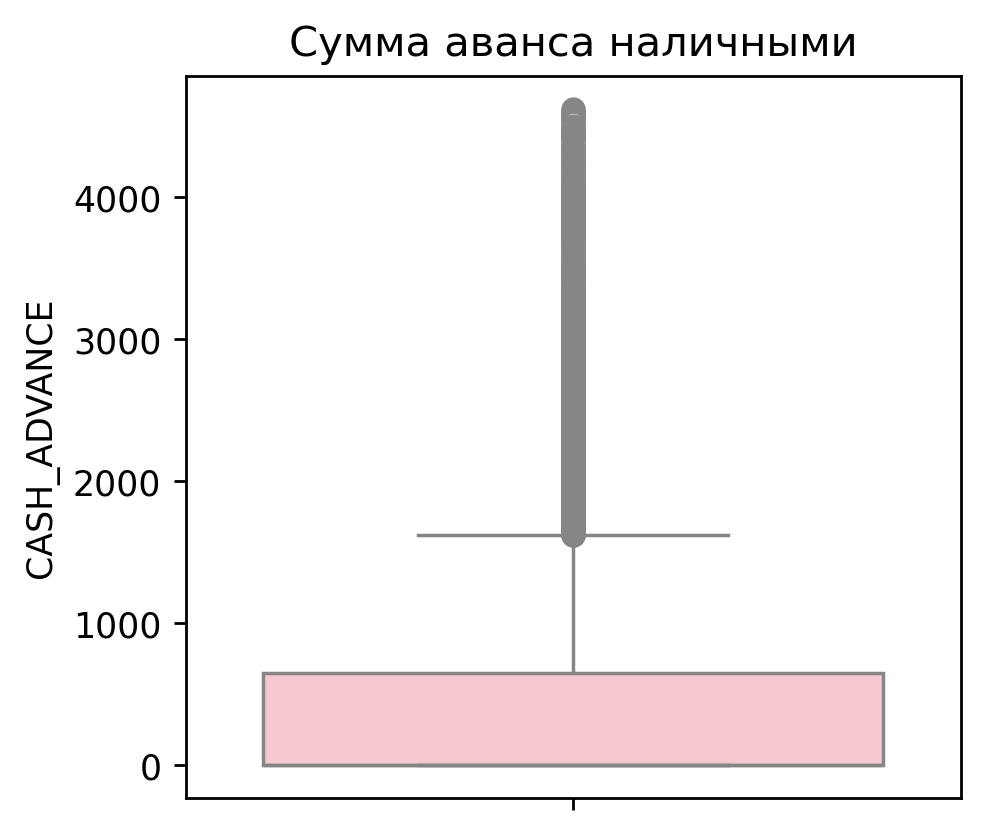

-------------------------------------------
Основные статистики: count    6906.000000
mean        0.464214
std         0.390612
min         0.000000
25%         0.083333
50%         0.416667
75%         0.909091
max         1.000000
Name: PURCHASES_FREQUENCY, dtype: float64
-------------------------------------------


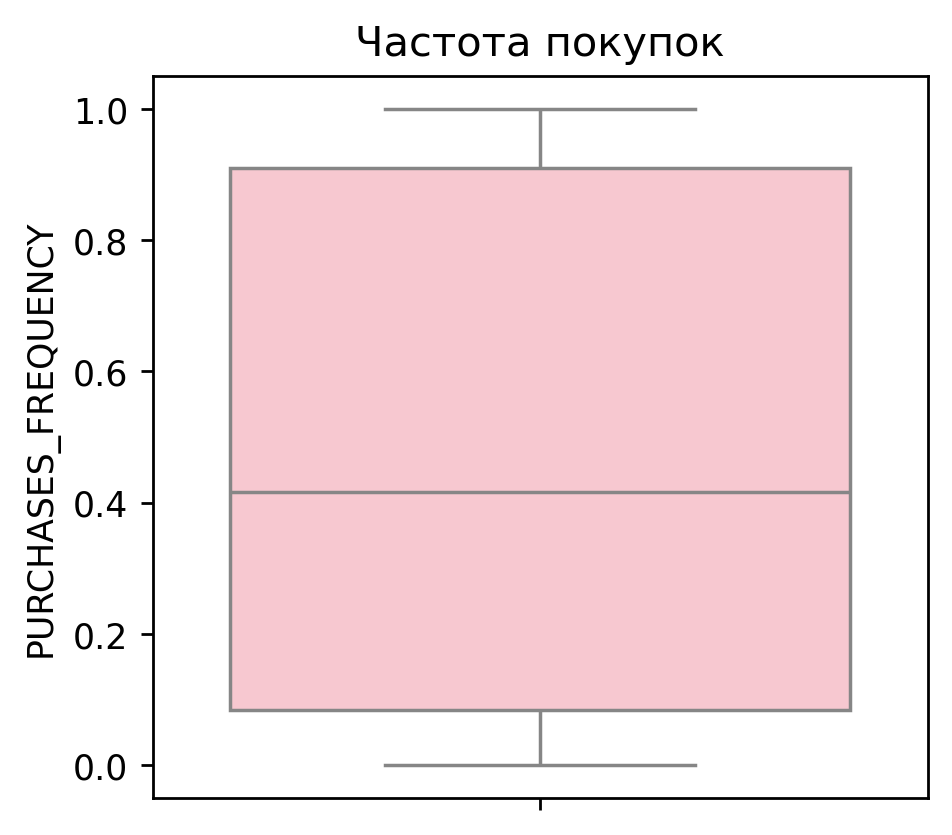

-------------------------------------------
Основные статистики: count    6906.000000
mean        0.162358
std         0.261112
min         0.000000
25%         0.000000
50%         0.000000
75%         0.200000
max         1.000000
Name: ONEOFF_PURCHASES_FREQUENCY, dtype: float64
-------------------------------------------


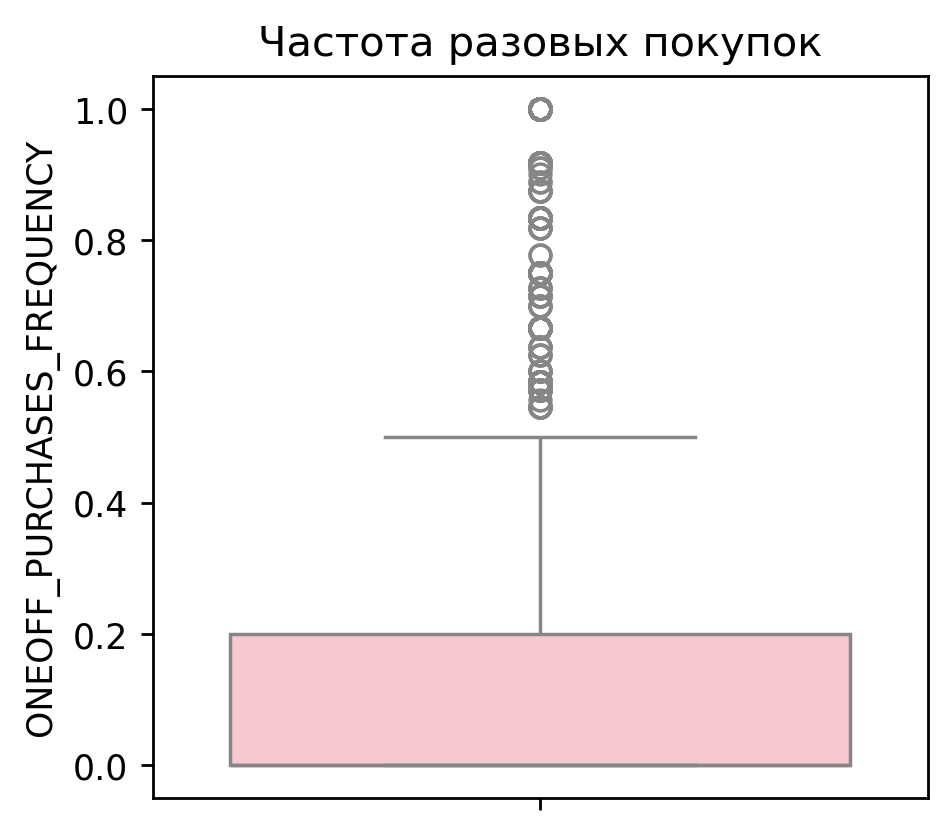

-------------------------------------------
Основные статистики: count    6906.000000
mean        0.340948
std         0.384002
min         0.000000
25%         0.000000
50%         0.166667
75%         0.666667
max         1.000000
Name: PURCHASES_INSTALLMENTS_FREQUENCY, dtype: float64
-------------------------------------------


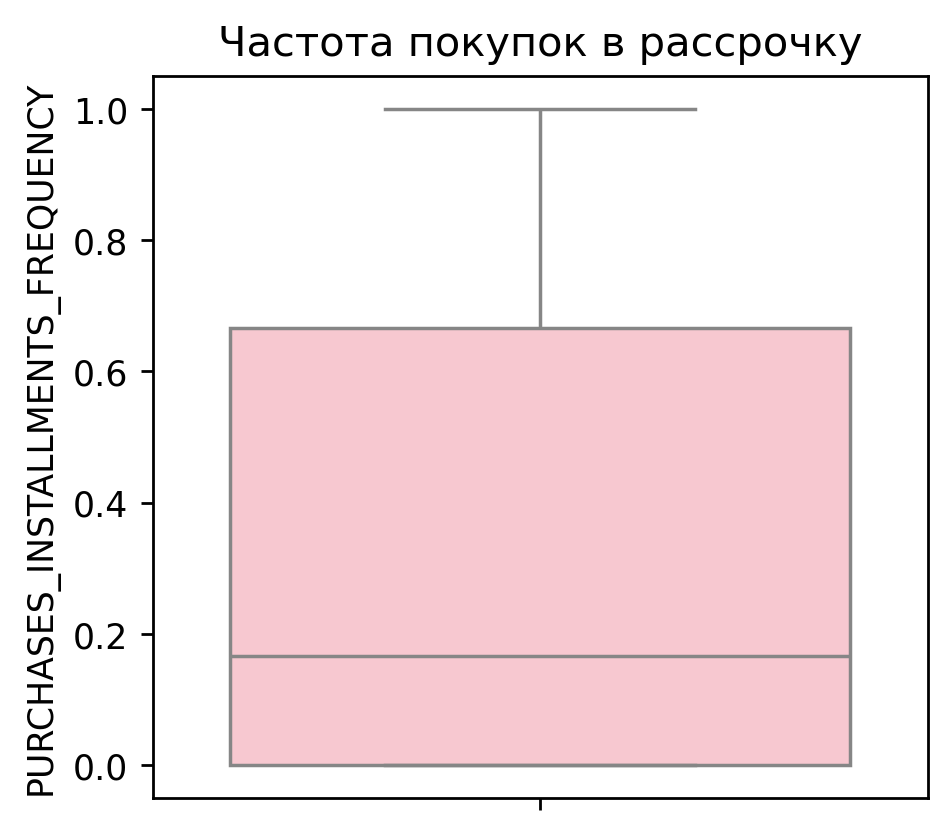

-------------------------------------------
Основные статистики: count    6906.000000
mean        0.094975
std         0.138036
min         0.000000
25%         0.000000
50%         0.000000
75%         0.166667
max         0.583333
Name: CASH_ADVANCE_FREQUENCY, dtype: float64
-------------------------------------------


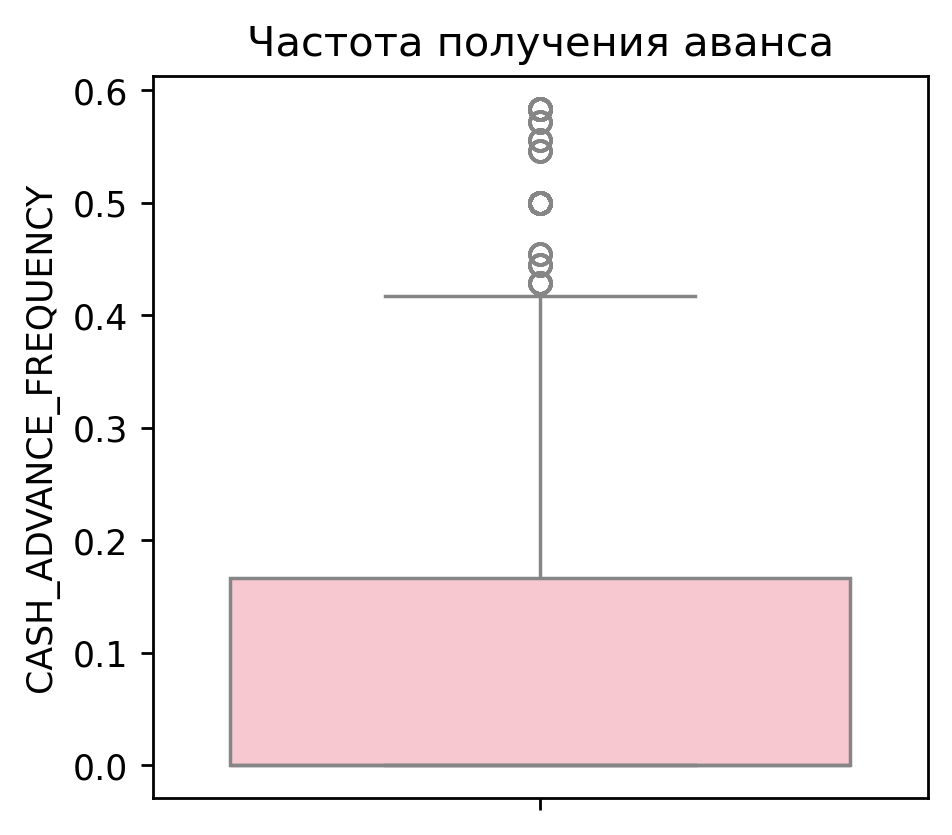

-------------------------------------------
Основные статистики: count    6906.000000
mean        1.795251
std         2.940897
min         0.000000
25%         0.000000
50%         0.000000
75%         3.000000
max        15.000000
Name: CASH_ADVANCE_TRX, dtype: float64
-------------------------------------------


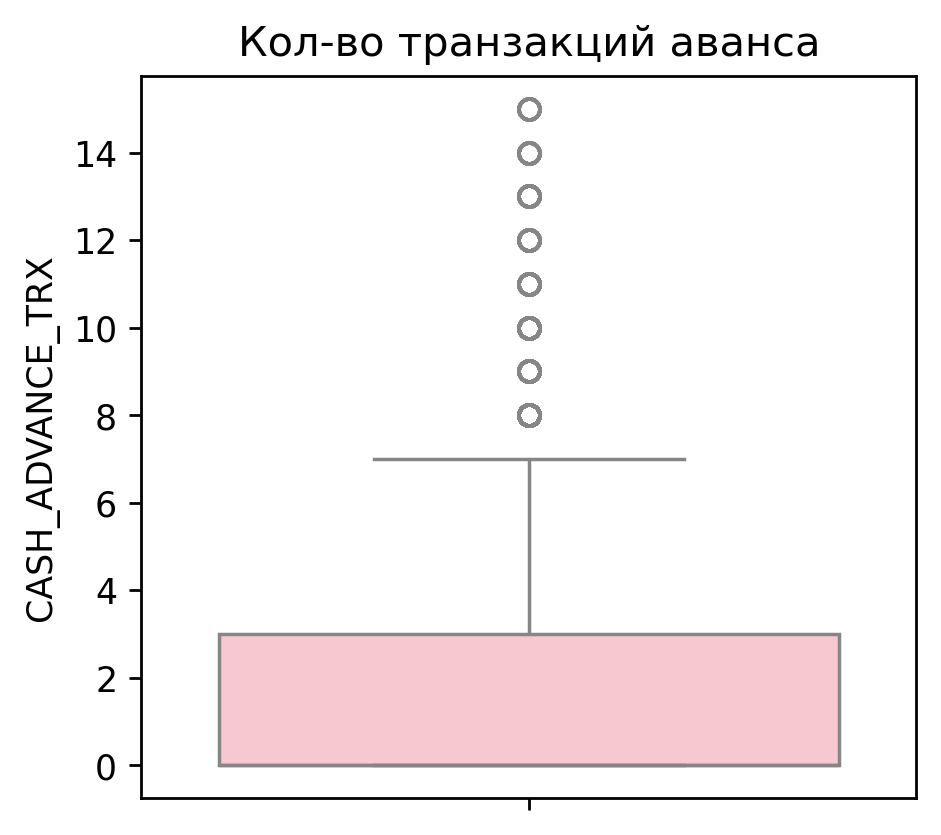

-------------------------------------------
Основные статистики: count    6906.000000
mean        9.587605
std        11.170015
min         0.000000
25%         1.000000
50%         6.000000
75%        13.000000
max        57.000000
Name: PURCHASES_TRX, dtype: float64
-------------------------------------------


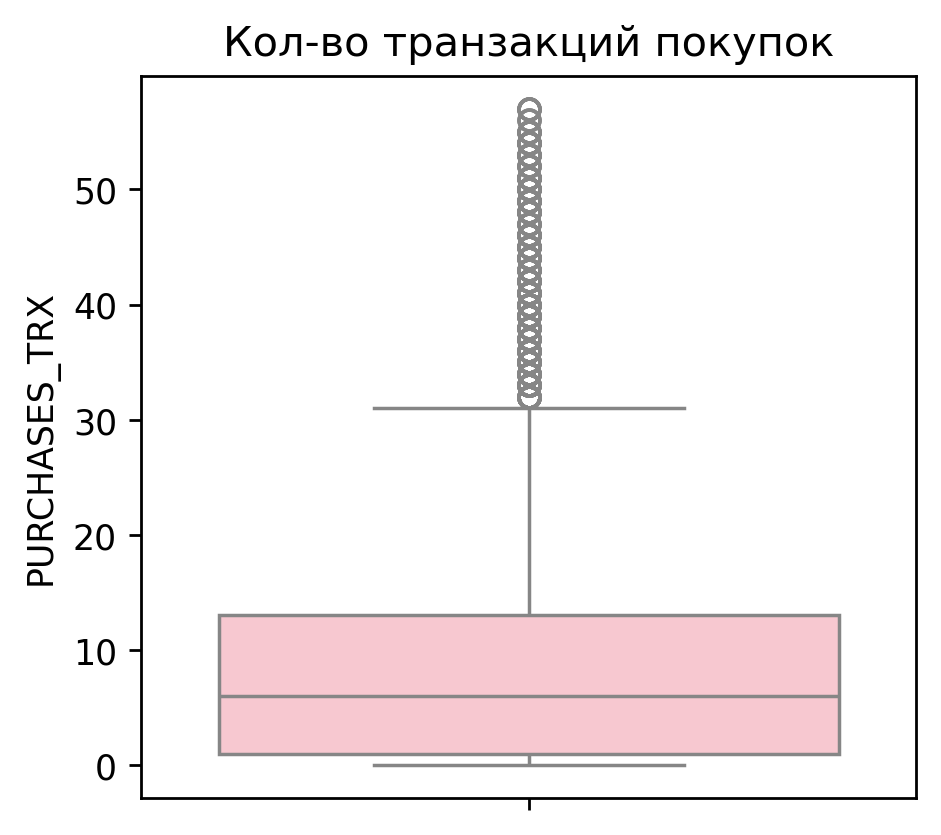

-------------------------------------------
Основные статистики: count     6906.000000
mean      3446.057571
std       2507.533845
min        150.000000
25%       1500.000000
50%       2500.000000
75%       5000.000000
max      12000.000000
Name: CREDIT_LIMIT, dtype: float64
-------------------------------------------


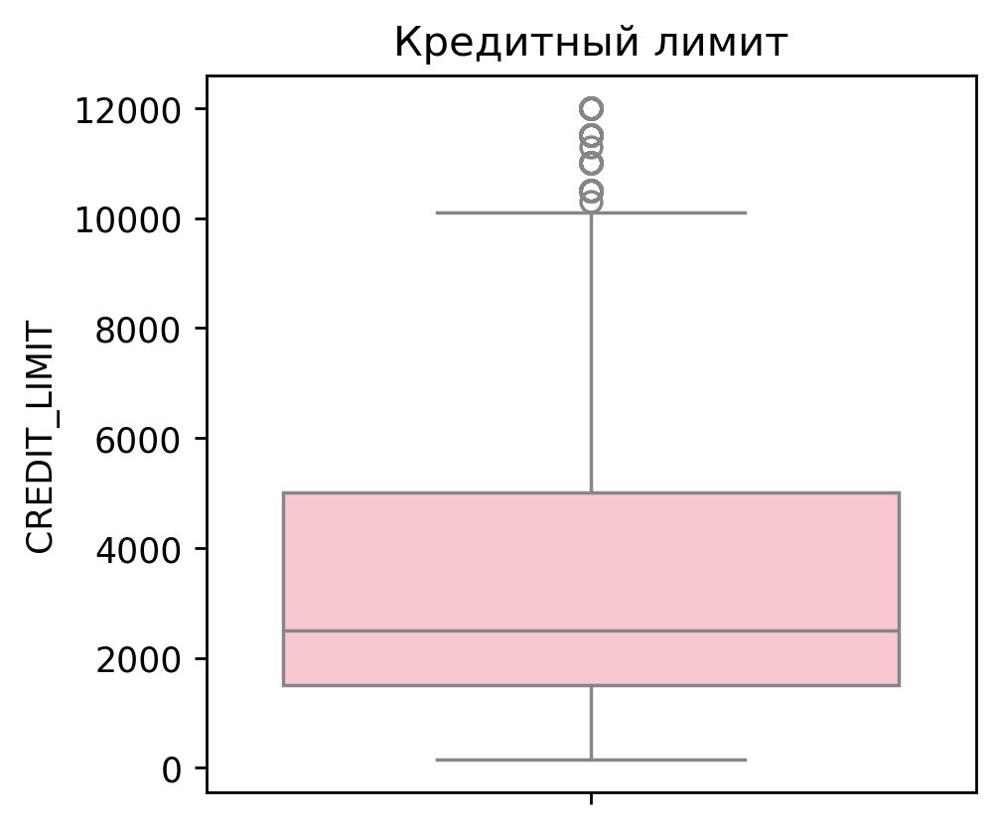

-------------------------------------------
Основные статистики: count    6906.000000
mean      957.924928
std       969.245053
min         0.000000
25%       314.658679
50%       635.194019
75%      1270.070742
max      6043.227704
Name: PAYMENTS, dtype: float64
-------------------------------------------


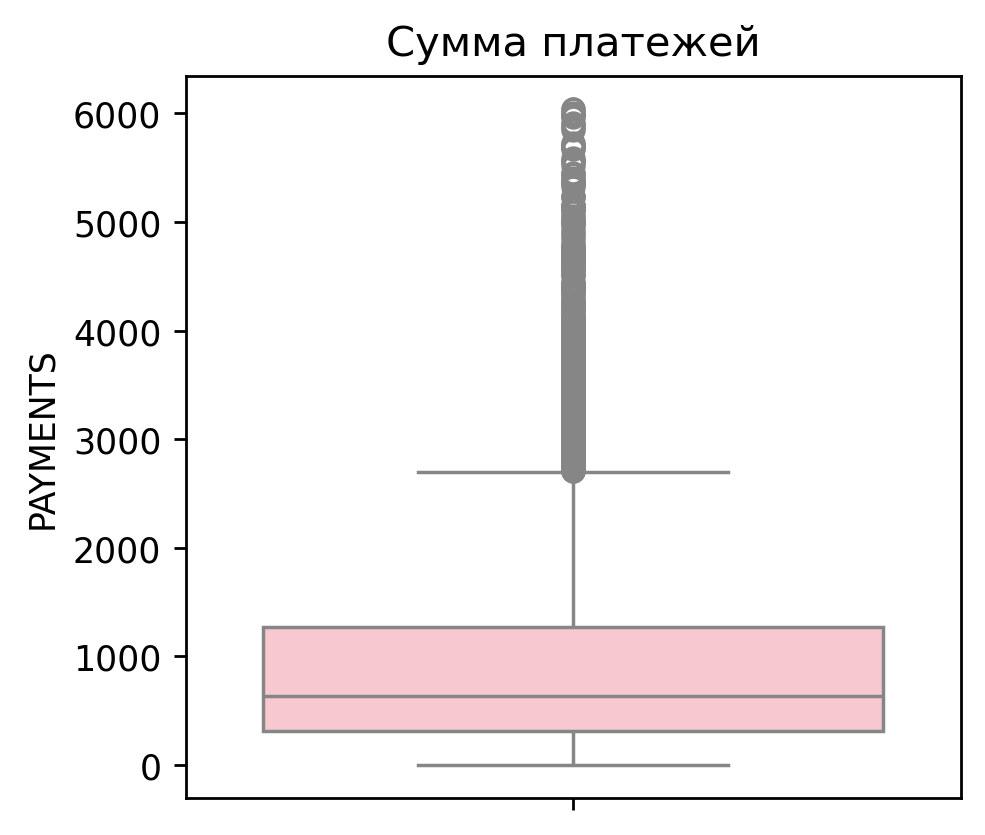

-------------------------------------------
Основные статистики: count     6622.000000
mean       630.762802
std       1699.378954
min          0.019163
25%        157.281413
50%        249.504424
75%        601.066531
max      56370.041170
Name: MINIMUM_PAYMENTS, dtype: float64
-------------------------------------------


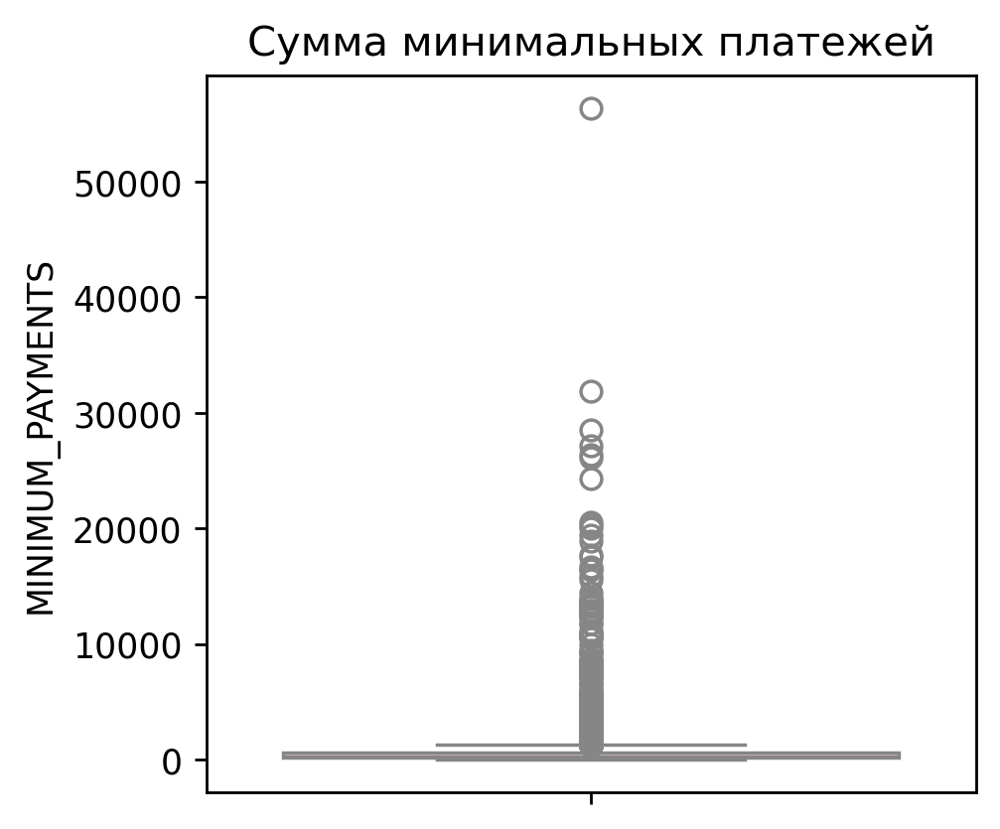

-------------------------------------------
Основные статистики: count    6906.000000
mean        0.147150
std         0.285654
min         0.000000
25%         0.000000
50%         0.000000
75%         0.125000
max         1.000000
Name: PRC_FULL_PAYMENT, dtype: float64
-------------------------------------------


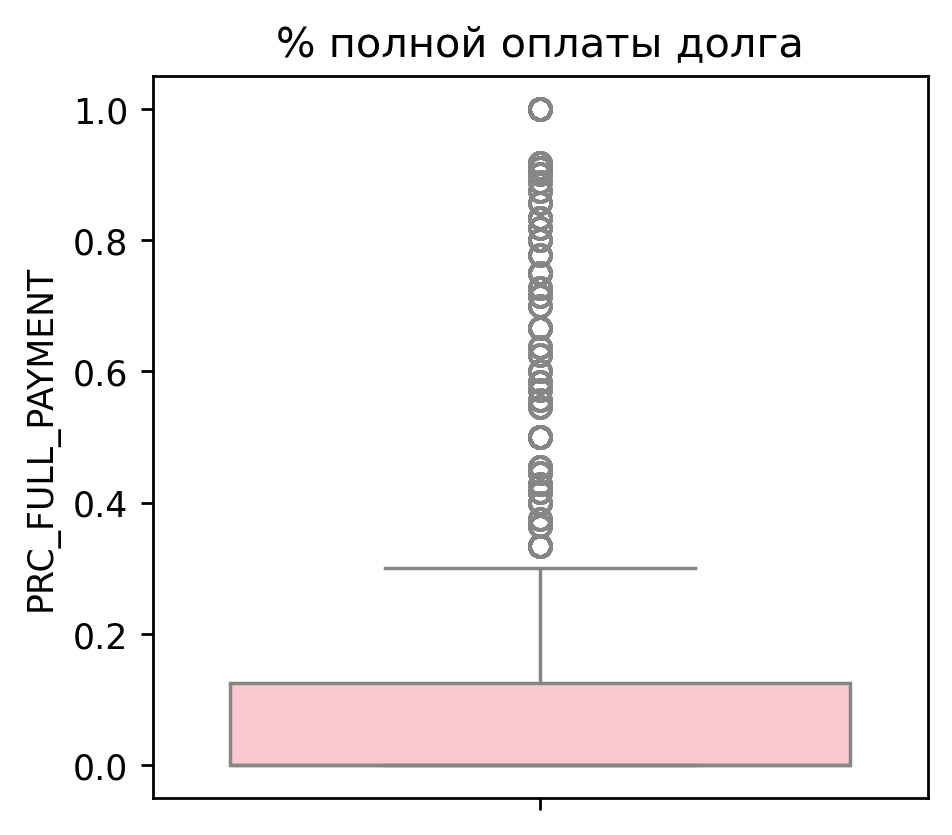

-------------------------------------------
Основные статистики: count    6906.000000
mean       11.493050
std         1.368952
min         6.000000
25%        12.000000
50%        12.000000
75%        12.000000
max        12.000000
Name: TENURE, dtype: float64
-------------------------------------------


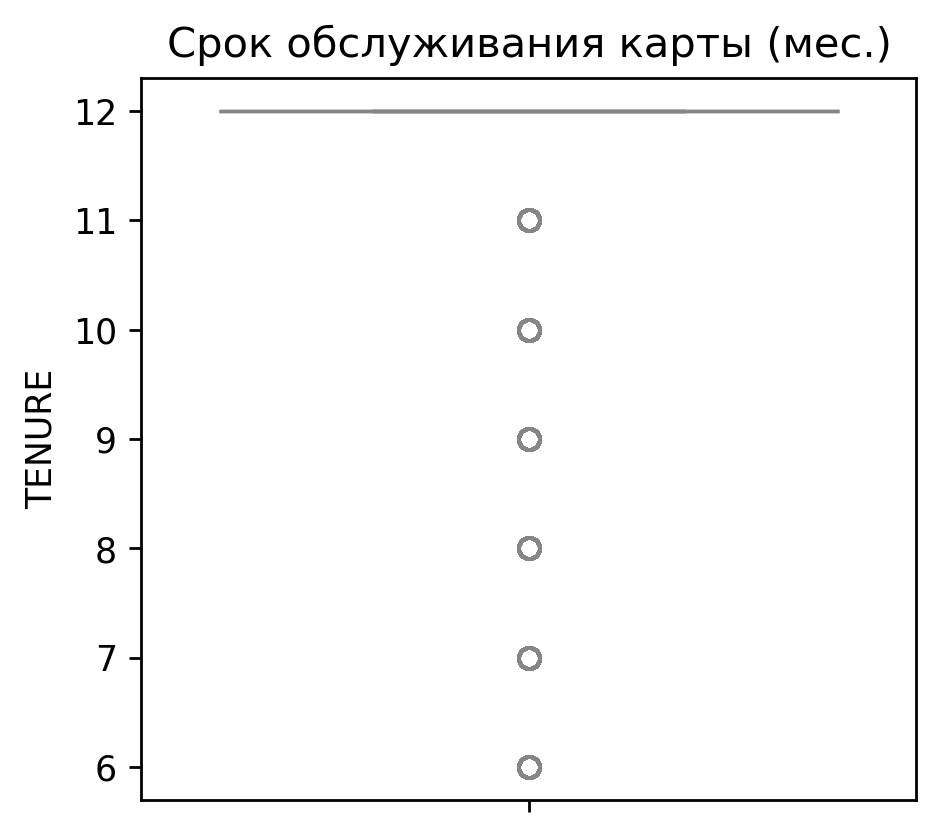

In [157]:
#Снова посмотрим распределение 
for col in df.columns:
    boxplot_drow(df, col, feature_translation_dict)

In [158]:
print(f"Всего пропусков: {df.isna().sum().sum()}")

Всего пропусков: 284


In [159]:
df.reset_index(drop=True, inplace=True)

In [160]:
from sklearn.neighbors import KNeighborsRegressor
df["CREDIT_LIMIT"].fillna(df["CREDIT_LIMIT"].median(), inplace=True)
#Заполним пропуски с помощью knn
not_null_index, null_index = df[df["MINIMUM_PAYMENTS"].notna()].index, df[df["MINIMUM_PAYMENTS"].isnull()].index
fillna_model = KNeighborsRegressor(n_neighbors=8, n_jobs=-1)
X_train, y_train = df.loc[not_null_index].drop("MINIMUM_PAYMENTS", axis=1), df.loc[not_null_index]["MINIMUM_PAYMENTS"]
X_missing = df.loc[null_index].drop("MINIMUM_PAYMENTS", axis=1)

fillna_model.fit(X_train, y_train)
df.loc[null_index ,"MINIMUM_PAYMENTS"] = fillna_model.predict(X_missing)

print("Все пропуски были заполнены!")
print(f"Всего пропусков: {df.isna().sum().sum()}")


Все пропуски были заполнены!
Всего пропусков: 0


In [161]:
#Функция, которая показывает распределение вещественнх значений
def countplot_drow(df, col, feature_dict):
    print("---------------------------------------")
    print(f"Ассиметрия равна: {df[col].skew()}")
    print(f"Эксцесс равна: {df[col].kurt()}")
    print("---------------------------------------")
    fig = plt.figure(figsize=(4, 3.75), dpi=250)
    plt.title(feature_dict[col])
    plt.ylabel(col)
    sns.histplot(data=df, x=col)
    plt.show()

---------------------------------------
Ассиметрия равна: 1.6099848704492057
Эксцесс равна: 2.4311807218375185
---------------------------------------


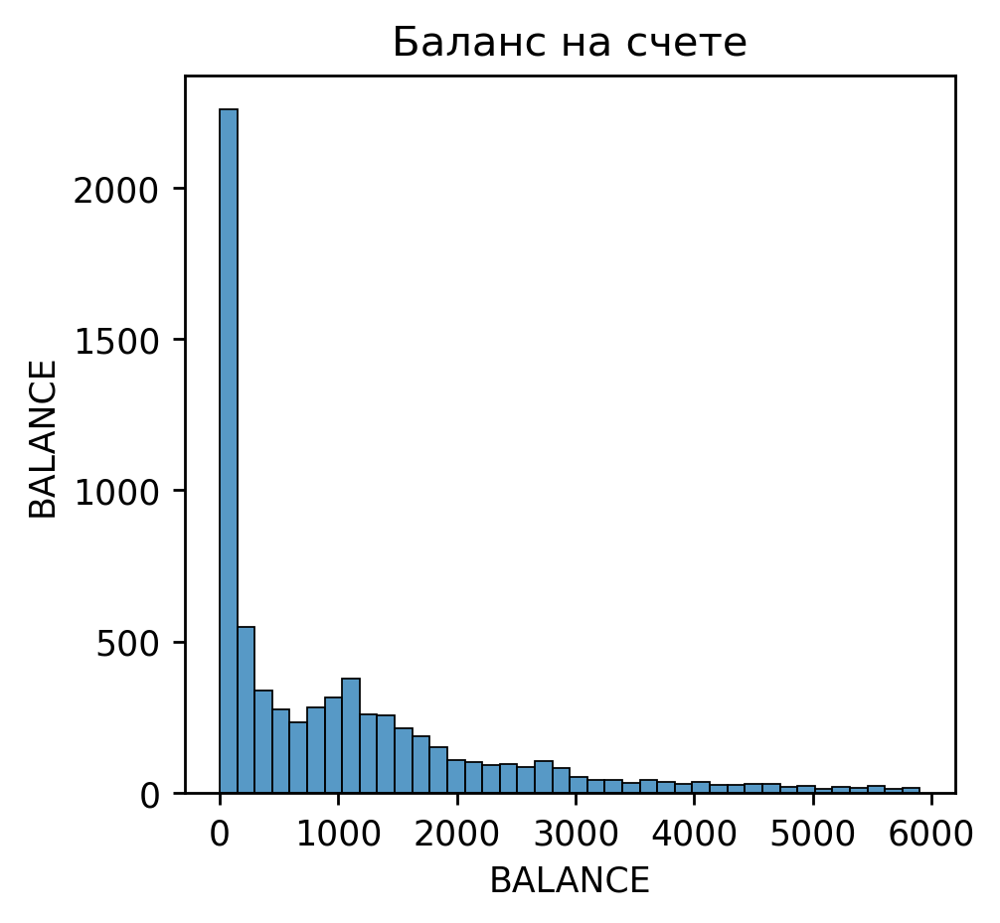

---------------------------------------
Ассиметрия равна: -1.7953507644748892
Эксцесс равна: 2.102366179148086
---------------------------------------


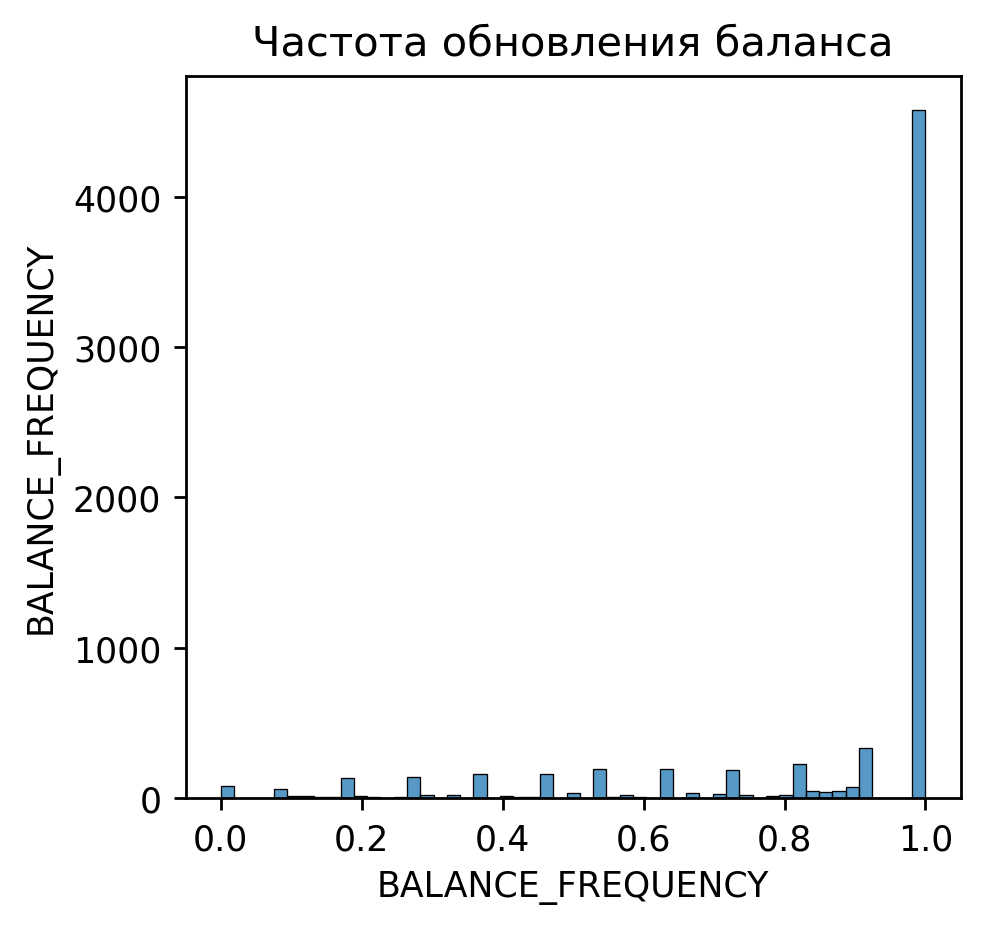

---------------------------------------
Ассиметрия равна: 1.7180556752155942
Эксцесс равна: 2.959323581956213
---------------------------------------


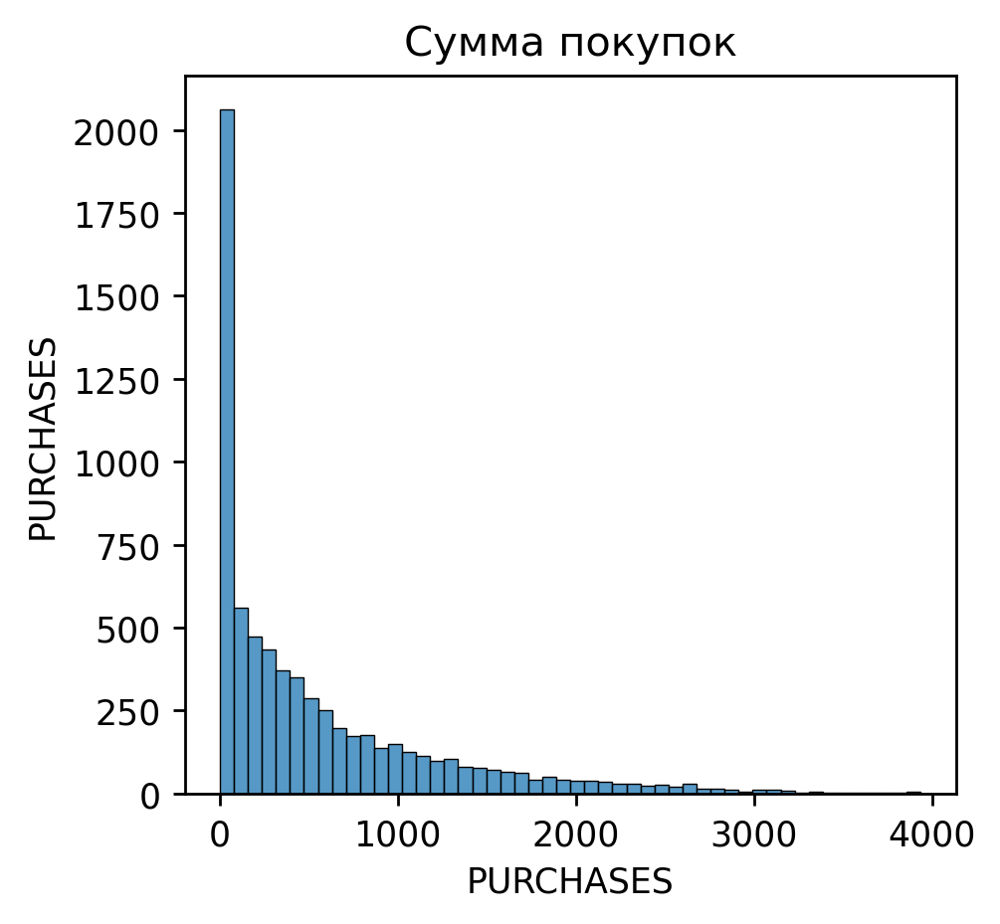

---------------------------------------
Ассиметрия равна: 2.16721824250852
Эксцесс равна: 4.4664290744631145
---------------------------------------


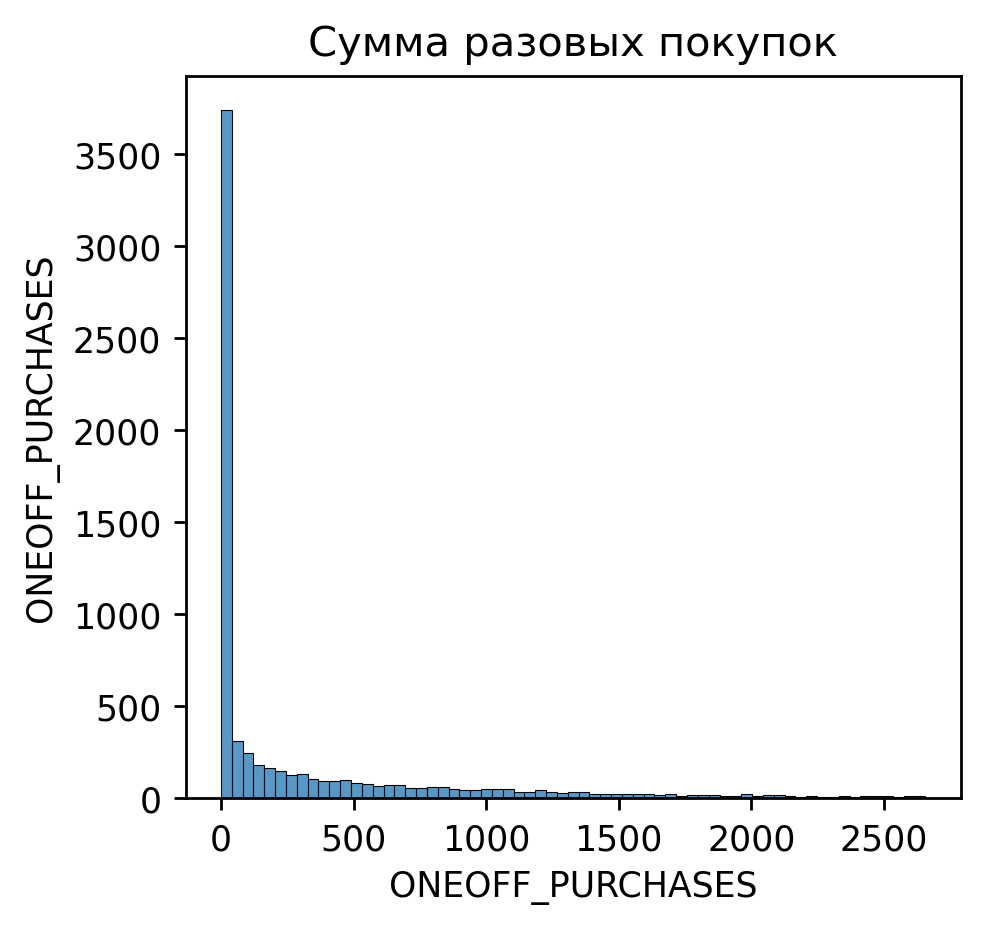

---------------------------------------
Ассиметрия равна: 1.8084181303186302
Эксцесс равна: 2.9450224998304857
---------------------------------------


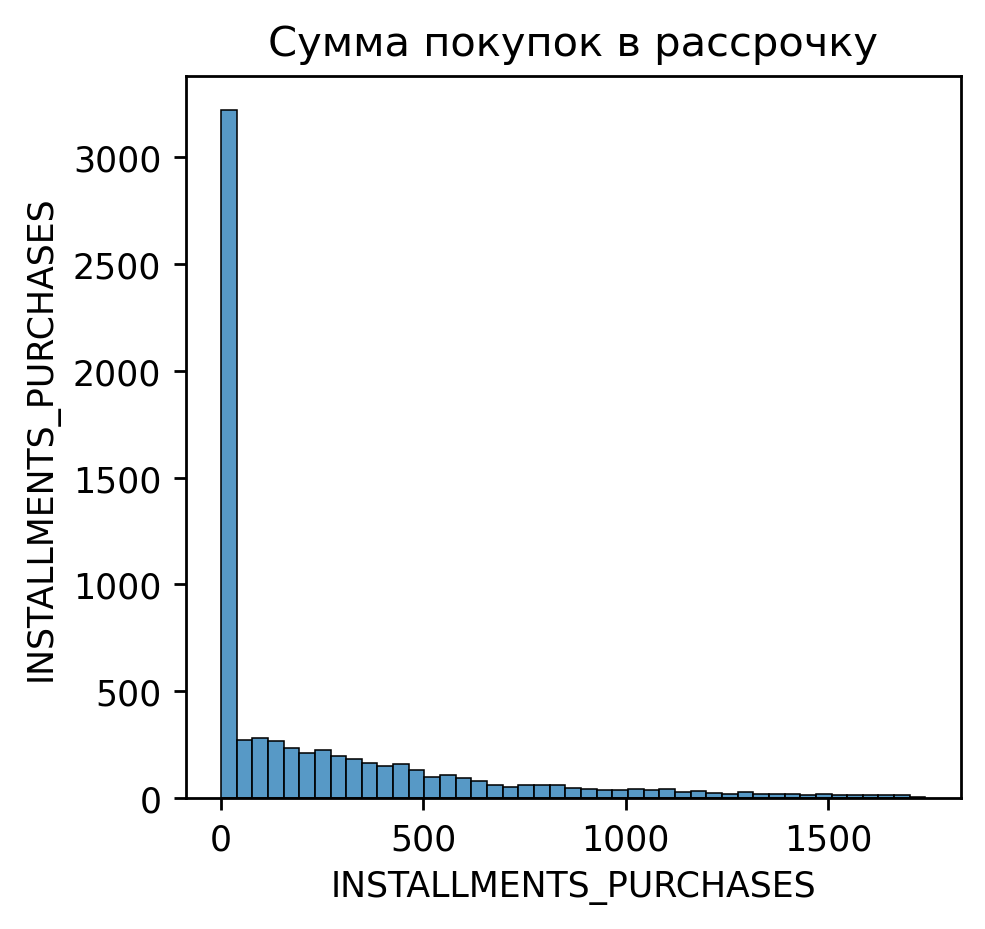

---------------------------------------
Ассиметрия равна: 2.2199173189087973
Эксцесс равна: 4.697789522112576
---------------------------------------


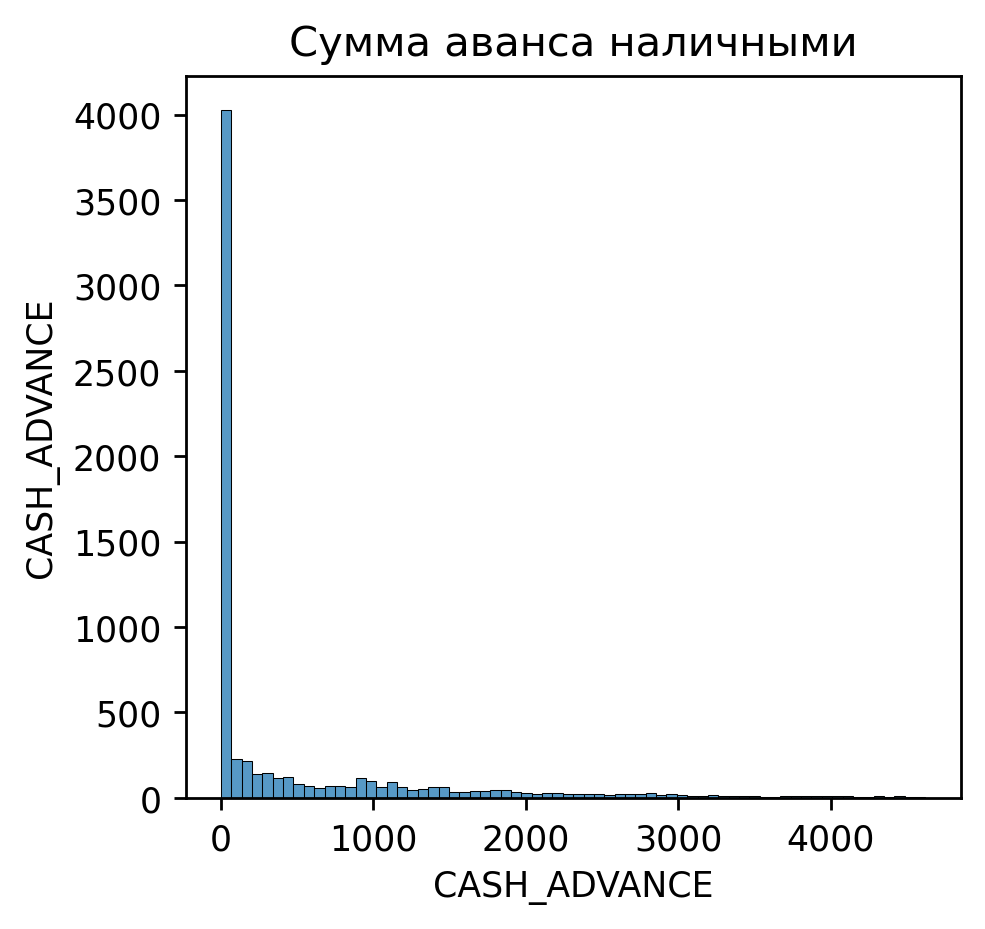

---------------------------------------
Ассиметрия равна: 0.16956945279259059
Эксцесс равна: -1.564633240915395
---------------------------------------


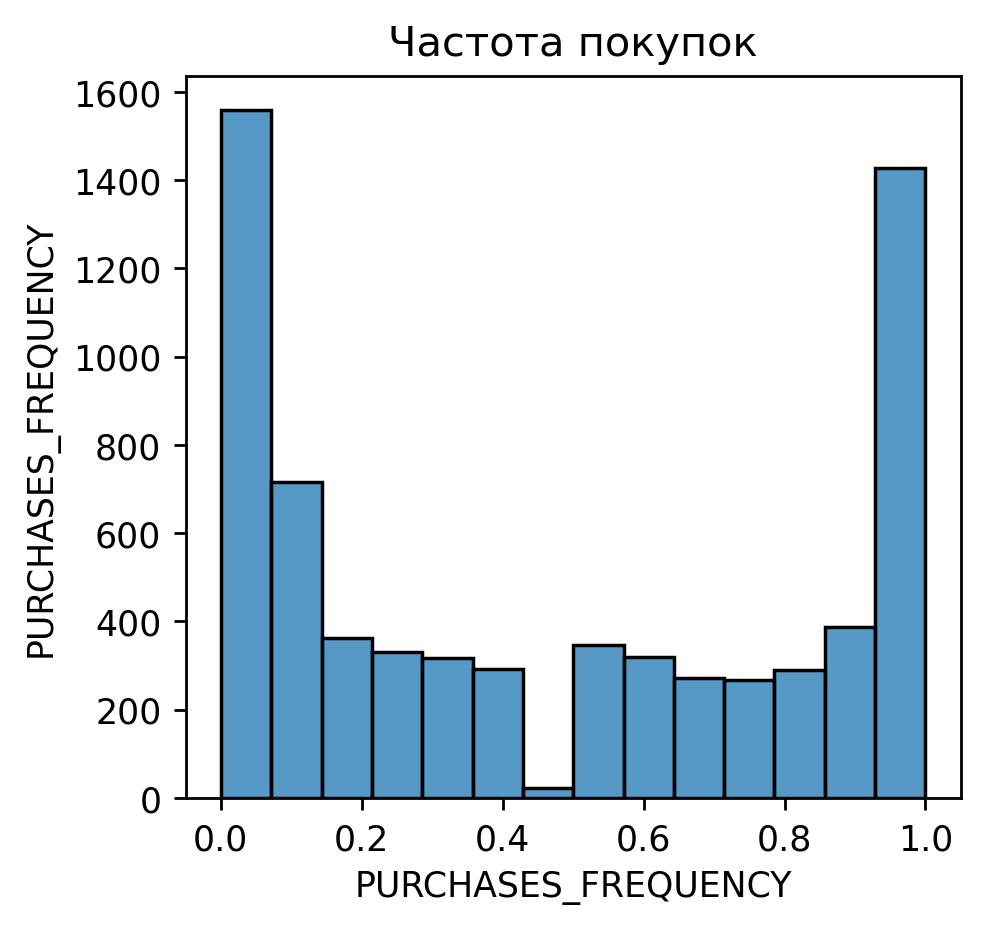

---------------------------------------
Ассиметрия равна: 1.9105230494421304
Эксцесс равна: 2.8337077061793825
---------------------------------------


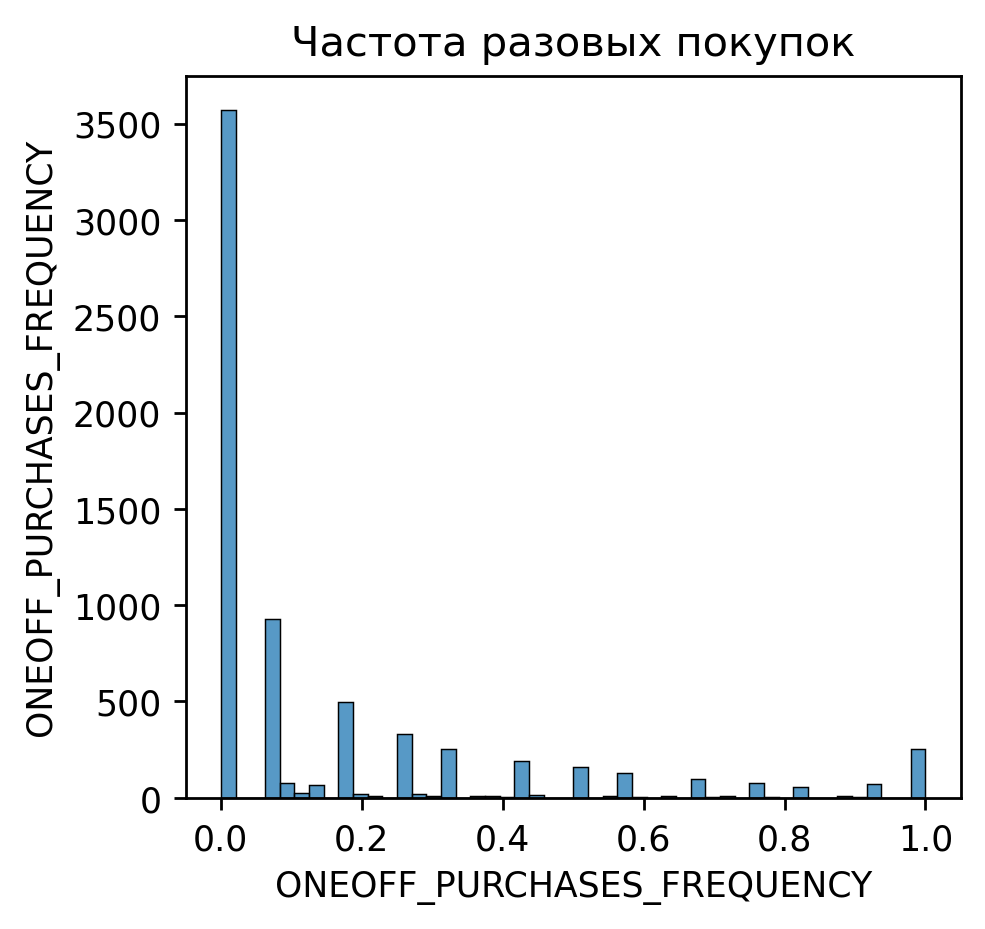

---------------------------------------
Ассиметрия равна: 0.6078306651630238
Эксцесс равна: -1.241939096967132
---------------------------------------


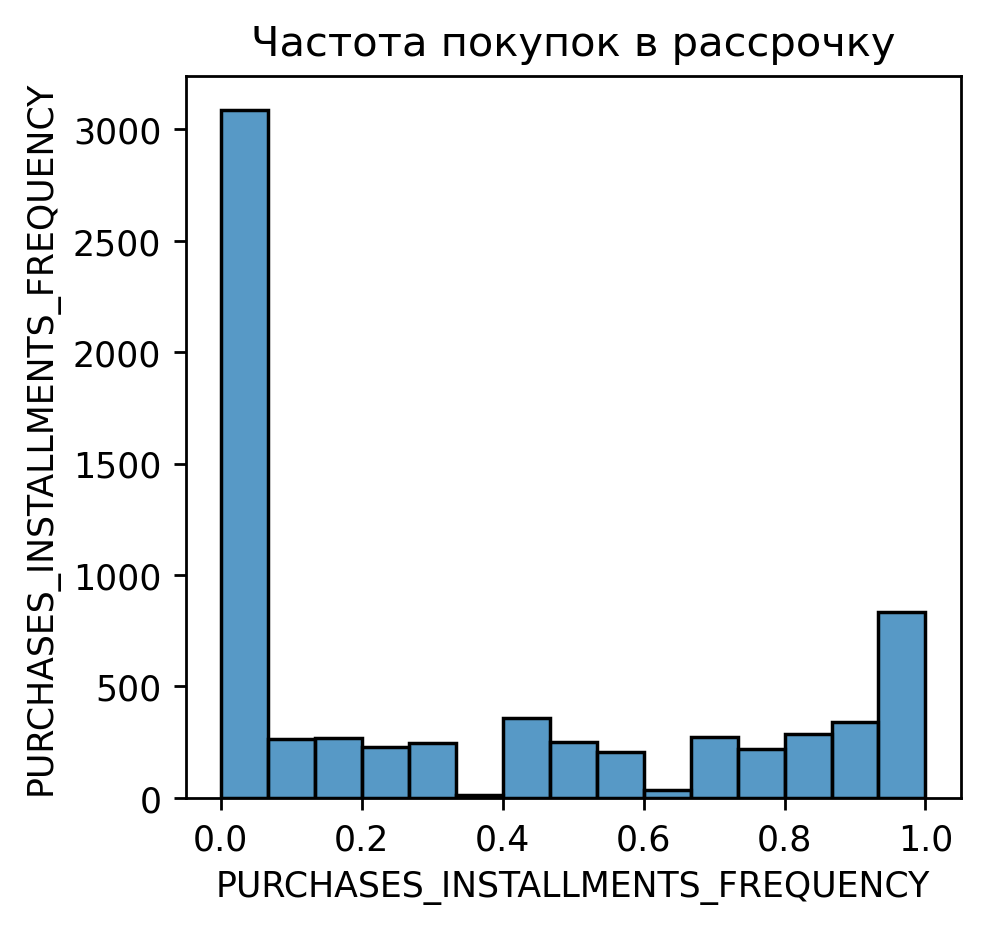

---------------------------------------
Ассиметрия равна: 1.5186118953027234
Эксцесс равна: 1.5900493408481045
---------------------------------------


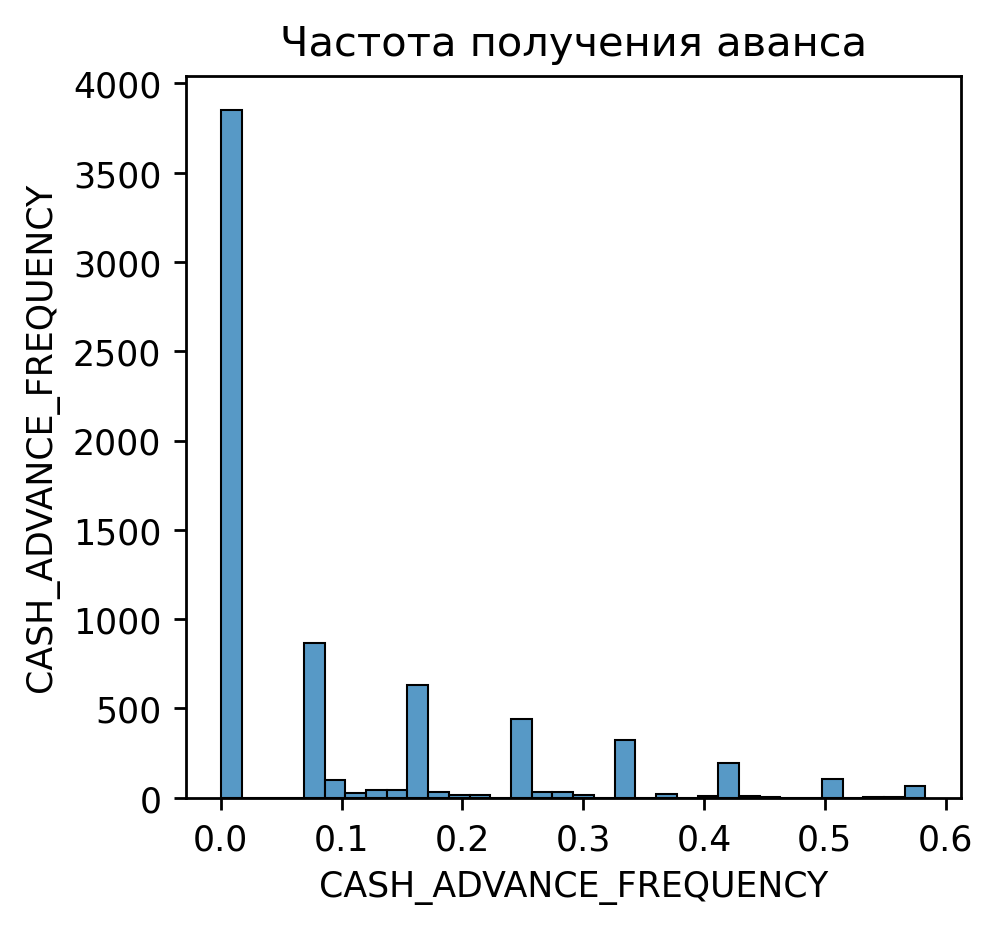

---------------------------------------
Ассиметрия равна: 2.02255730507631
Эксцесс равна: 3.887671542237656
---------------------------------------


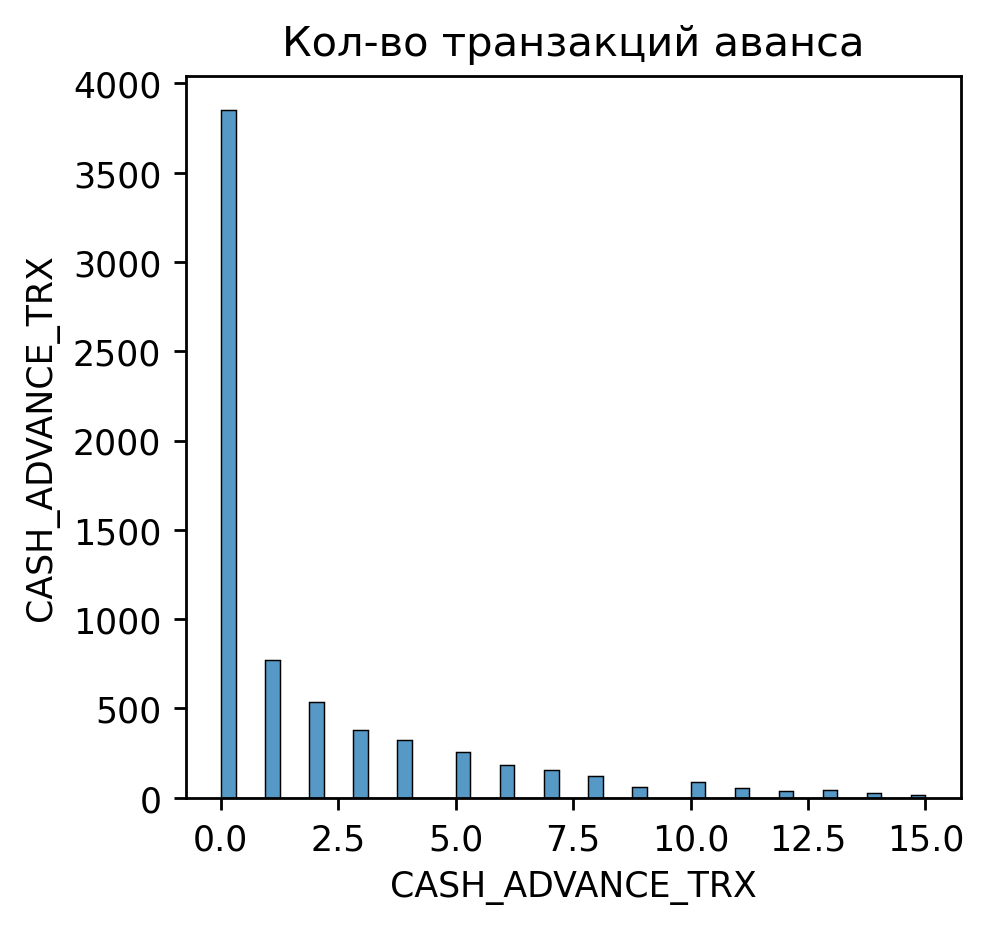

---------------------------------------
Ассиметрия равна: 1.6580654306758722
Эксцесс равна: 2.728879826405666
---------------------------------------


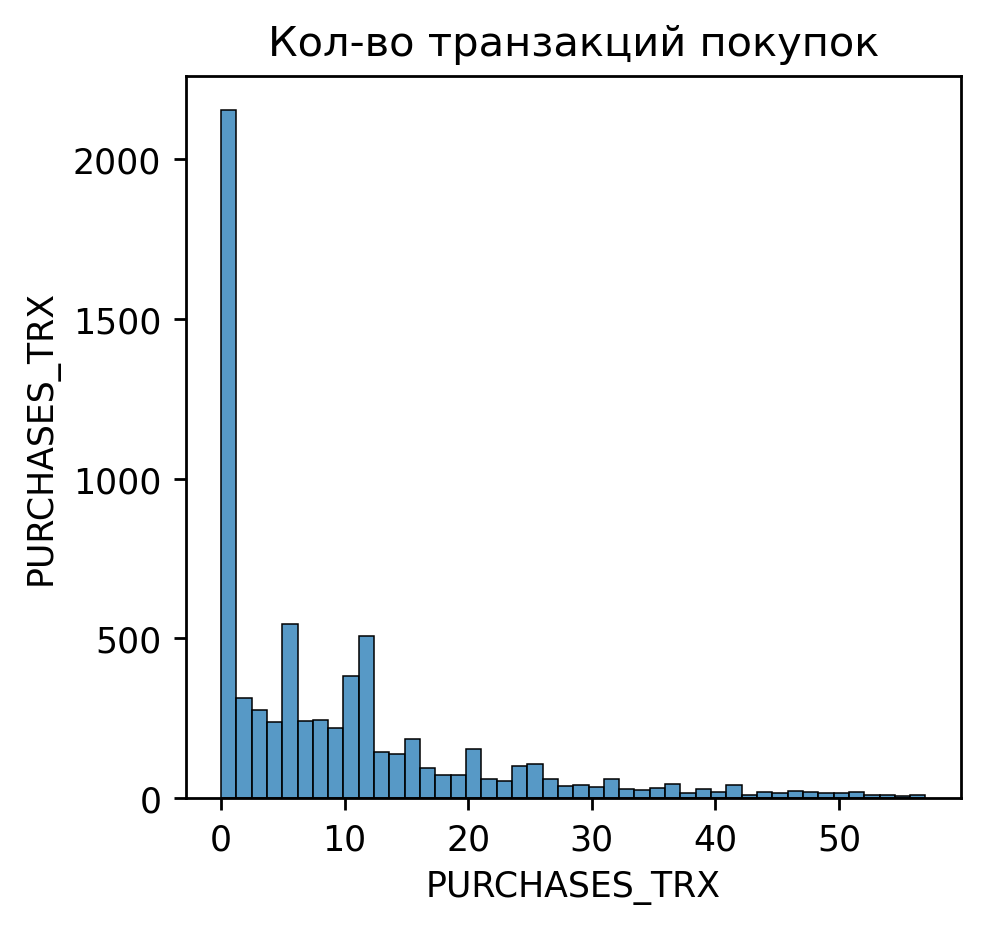

---------------------------------------
Ассиметрия равна: 1.1844388535429273
Эксцесс равна: 0.7852515642436204
---------------------------------------


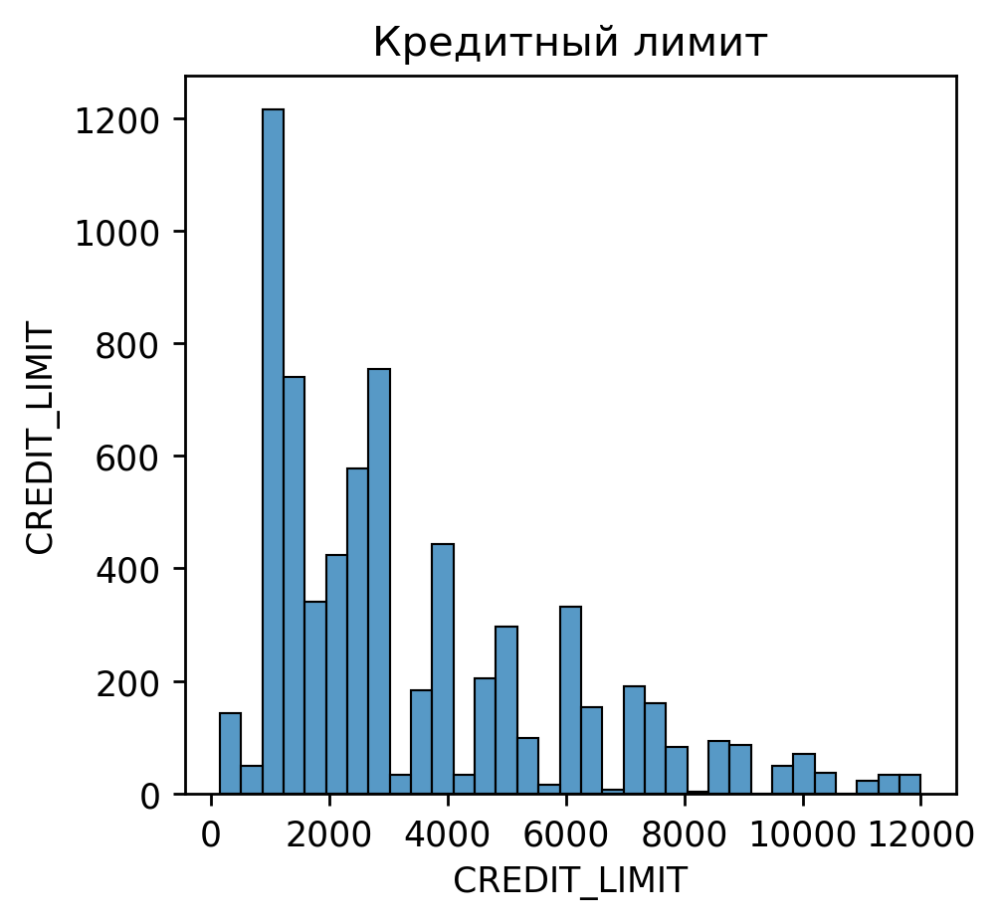

---------------------------------------
Ассиметрия равна: 2.067480915546597
Эксцесс равна: 5.063348160554597
---------------------------------------


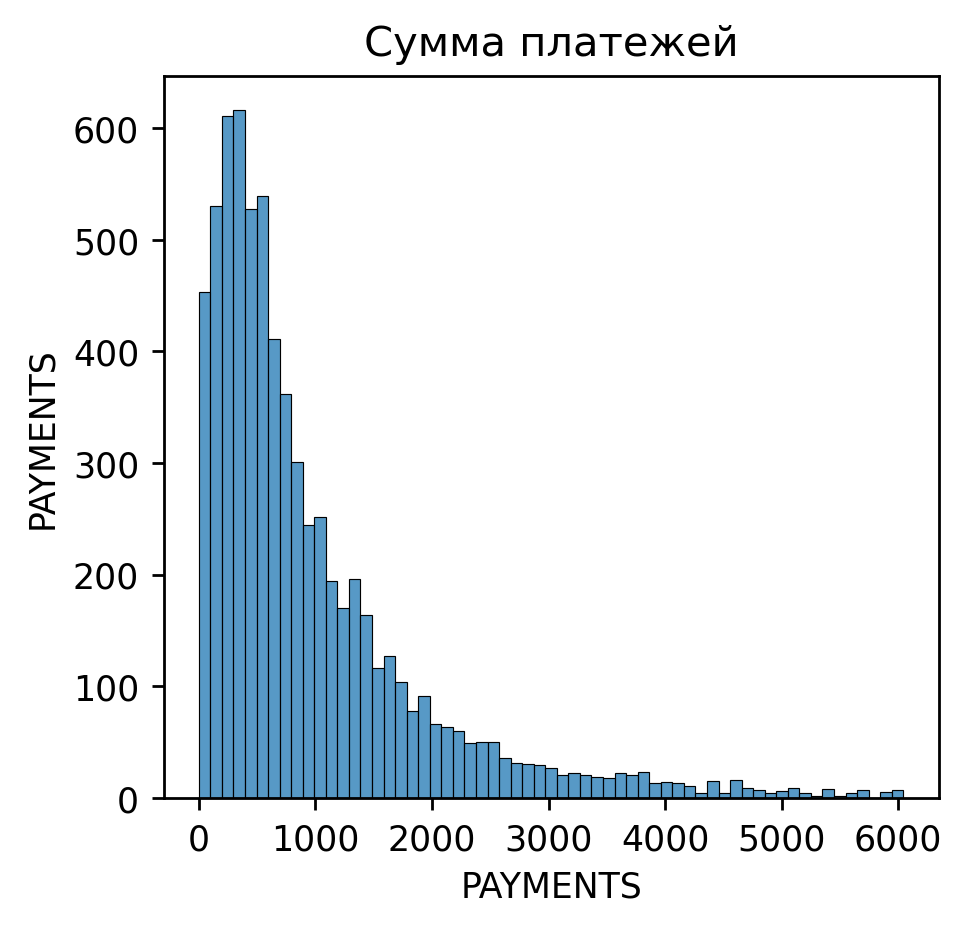

---------------------------------------
Ассиметрия равна: 12.802230973912337
Эксцесс равна: 264.52332182975897
---------------------------------------


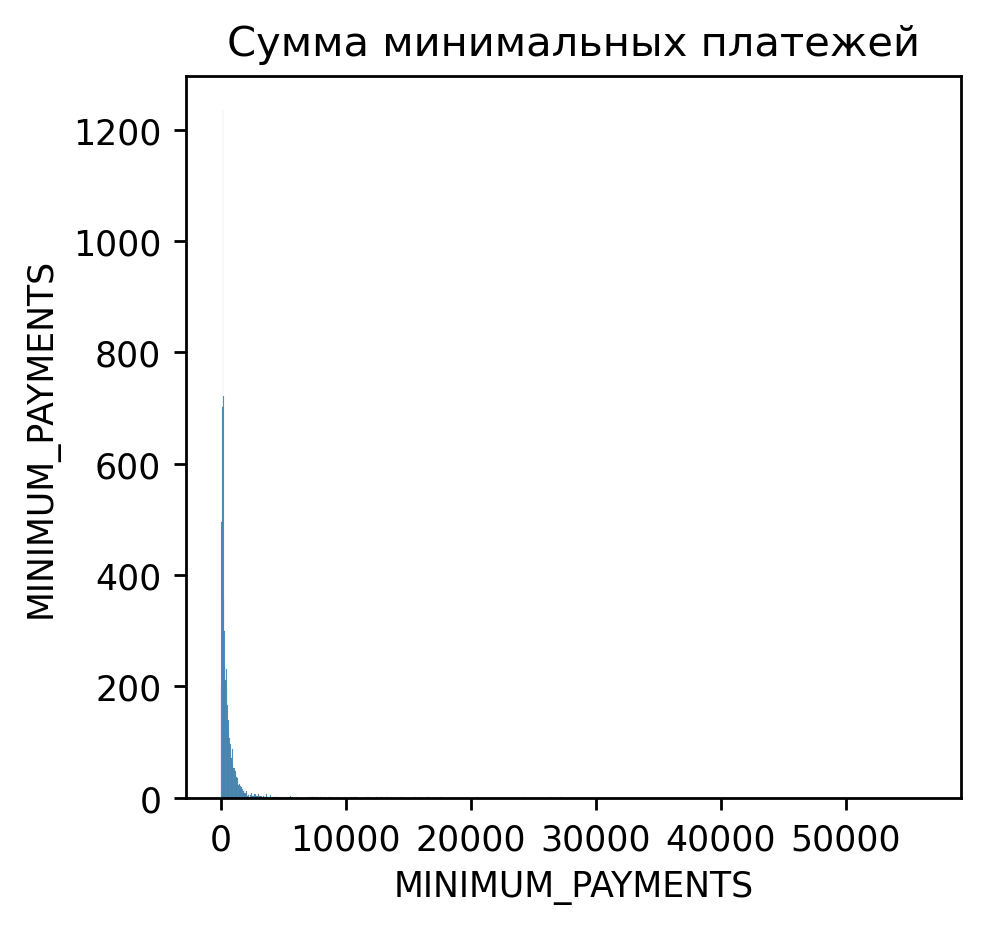

---------------------------------------
Ассиметрия равна: 2.006352480000969
Эксцесс равна: 2.742727317171114
---------------------------------------


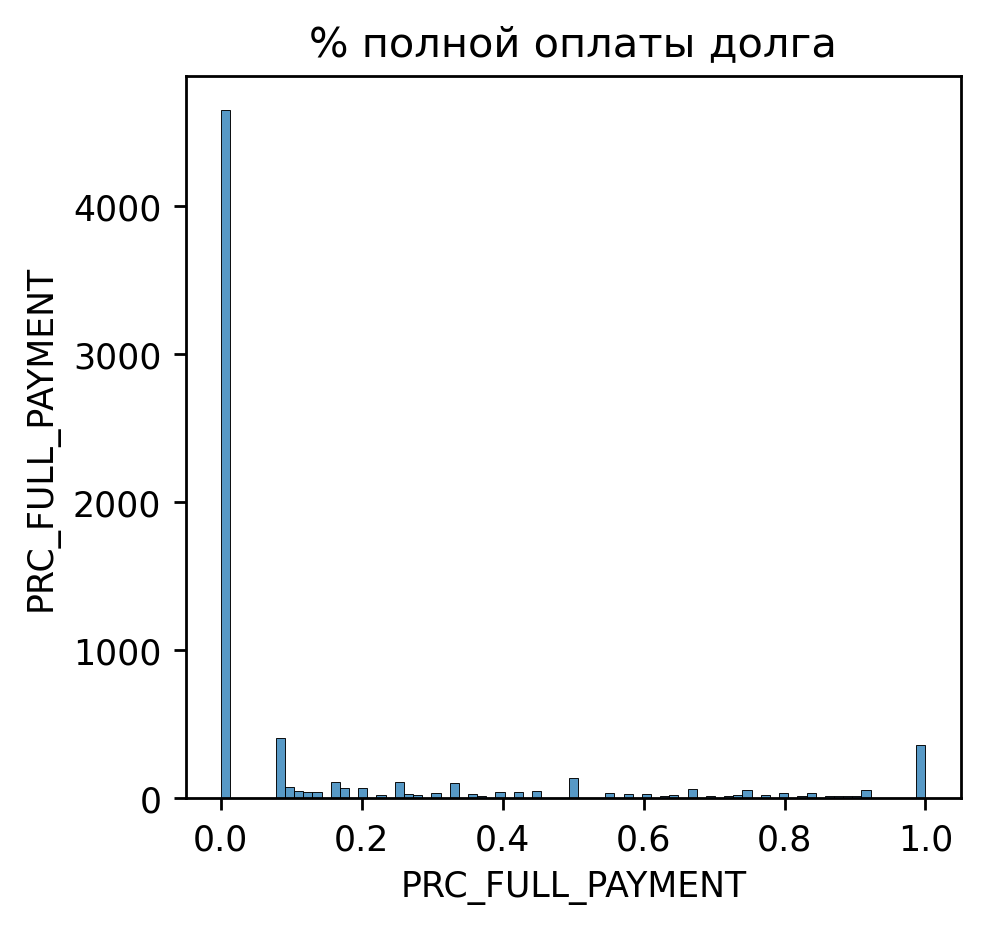

---------------------------------------
Ассиметрия равна: -2.8359725384137713
Эксцесс равна: 7.00392965099342
---------------------------------------


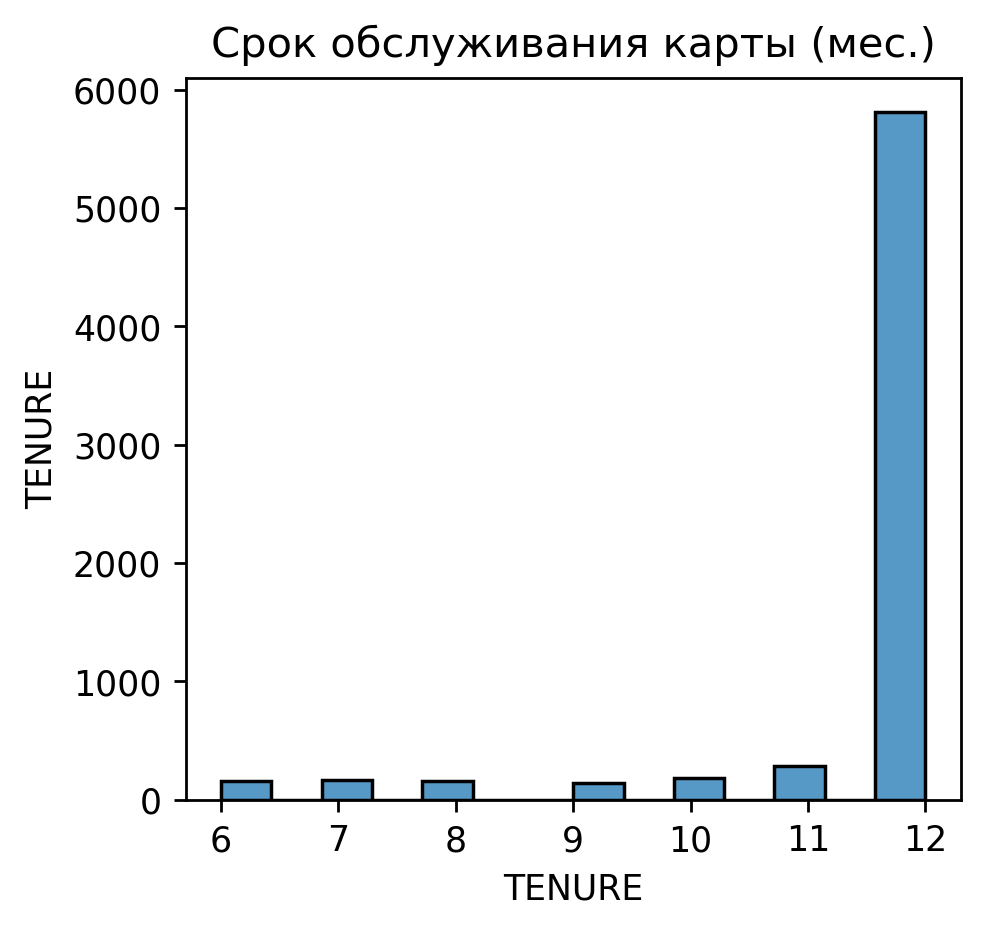

In [162]:
#Посмотрим на распределение признаков
for col in df.columns:
    countplot_drow(df, col, feature_translation_dict)
#Видно, что некоторые колонки имеют ассиметрия, попробуем обучить 2 модели, с логарифмированием некоторых переменных и без логарифмирования

In [181]:
def drow_barplot(df, col, feature_dict):
    data = df.groupby("TENURE")[col].mean()
    fig = plt.figure(figsize=(2.5, 2.3), dpi=250)
    plt.title(feature_dict[col])
    plt.ylabel(col)
    sns.barplot(data=data, palette="hls")
    plt.show()

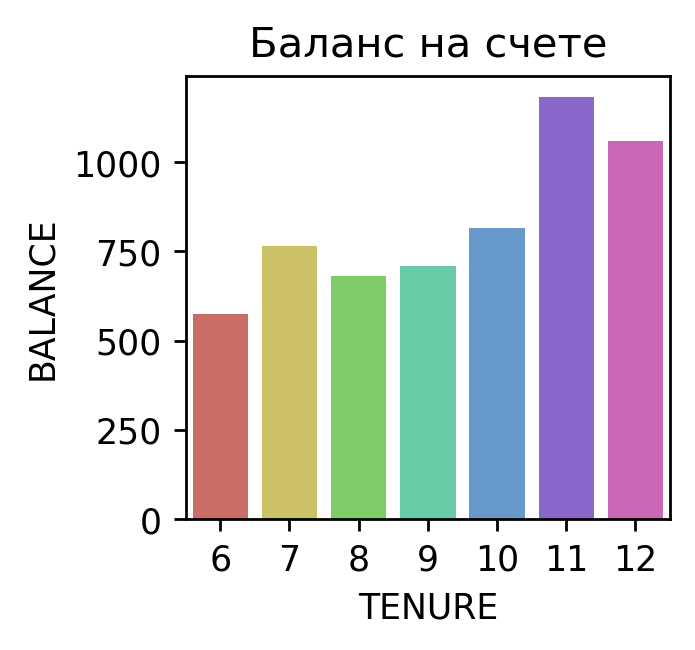

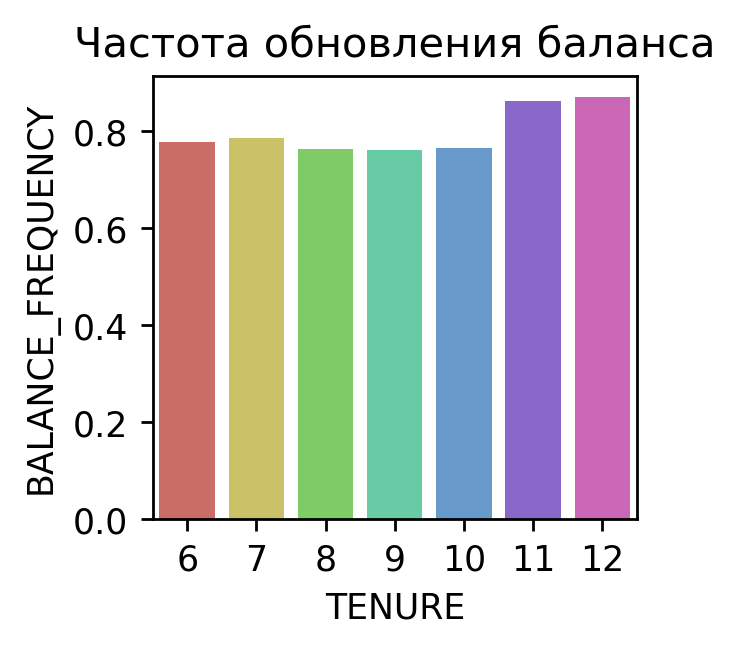

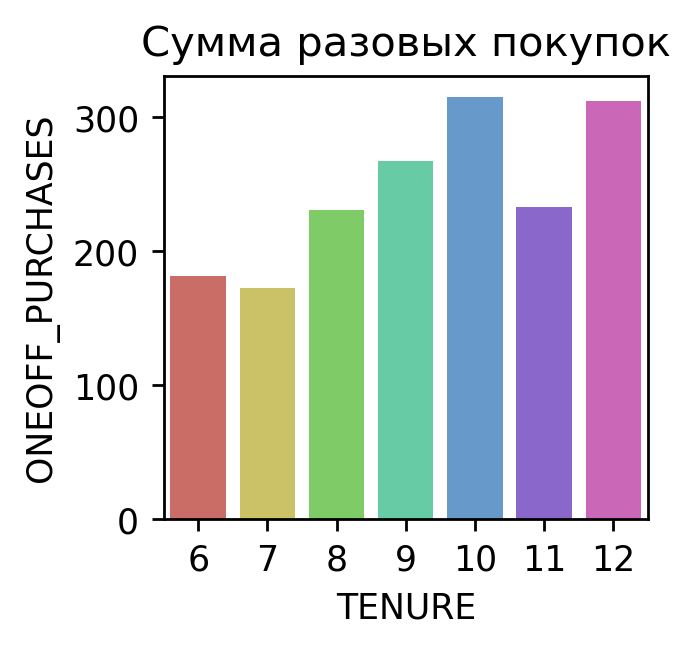

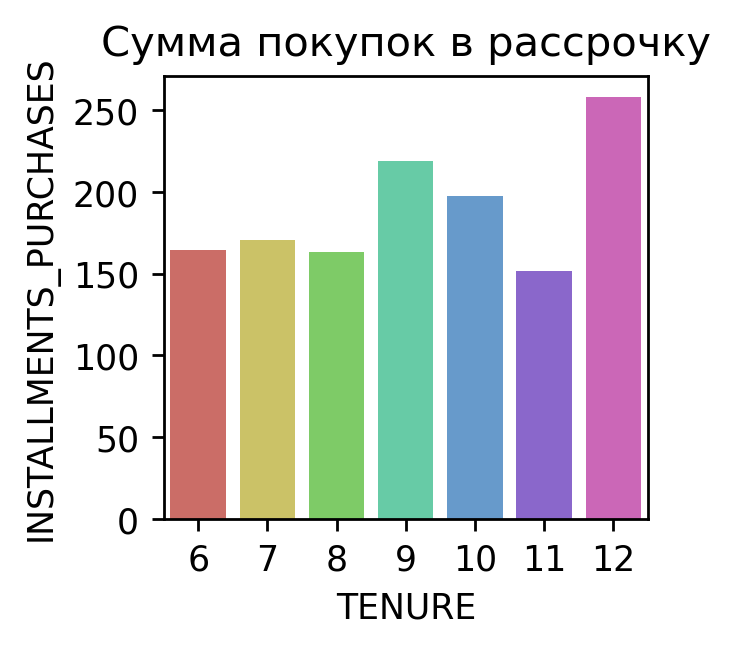

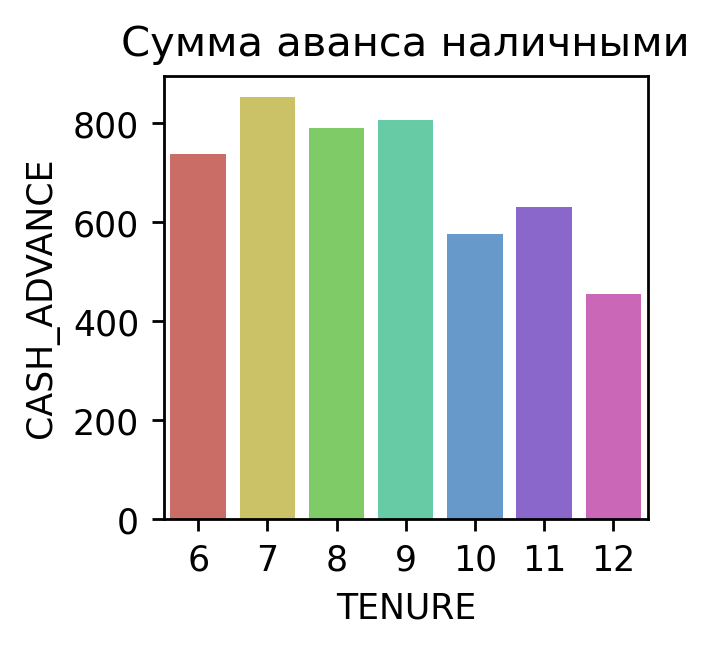

...

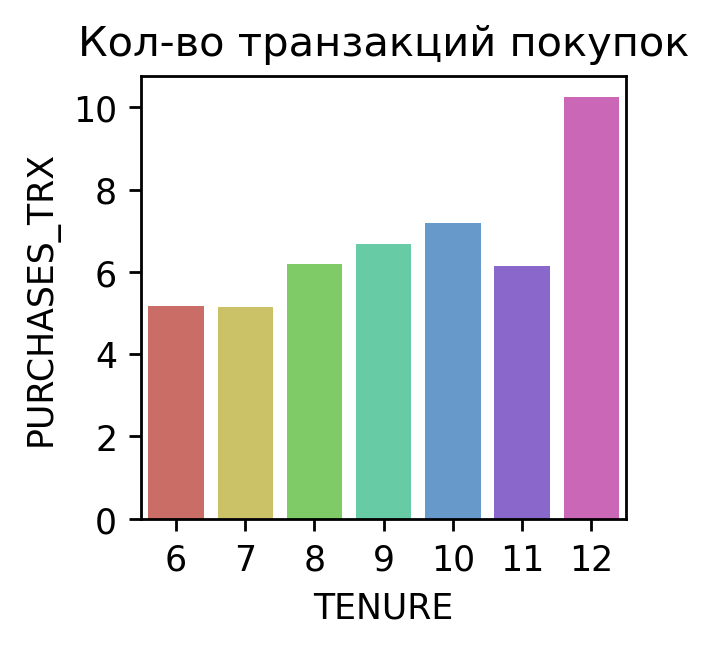

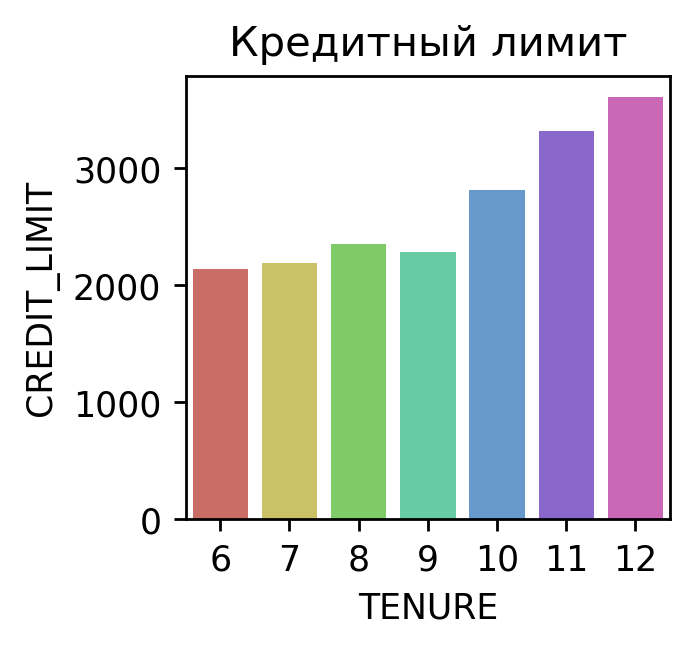

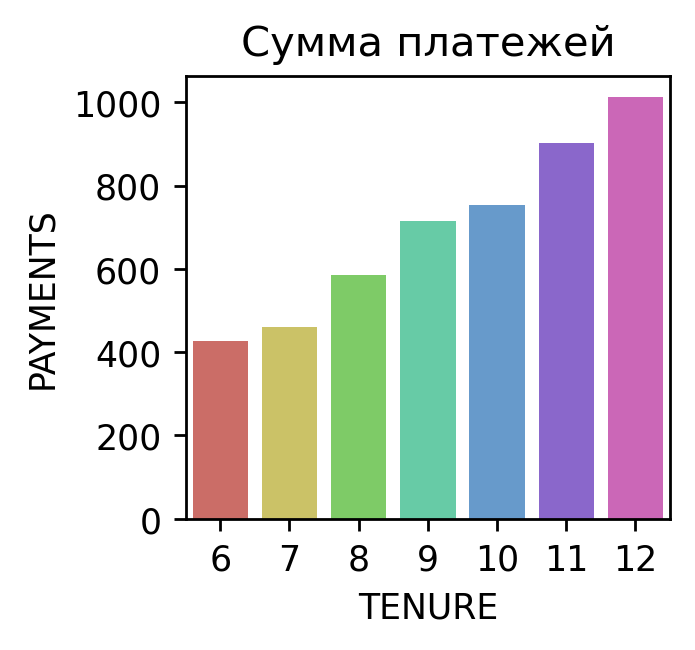

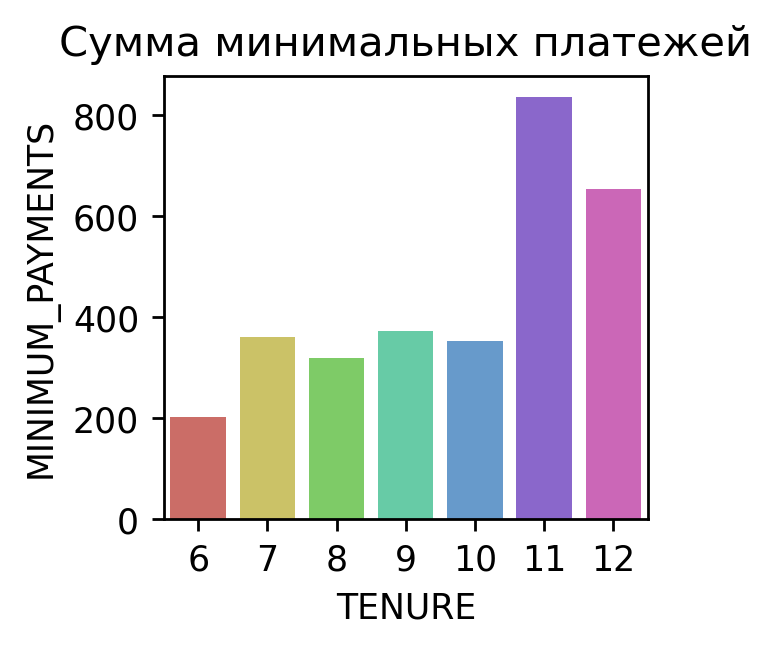

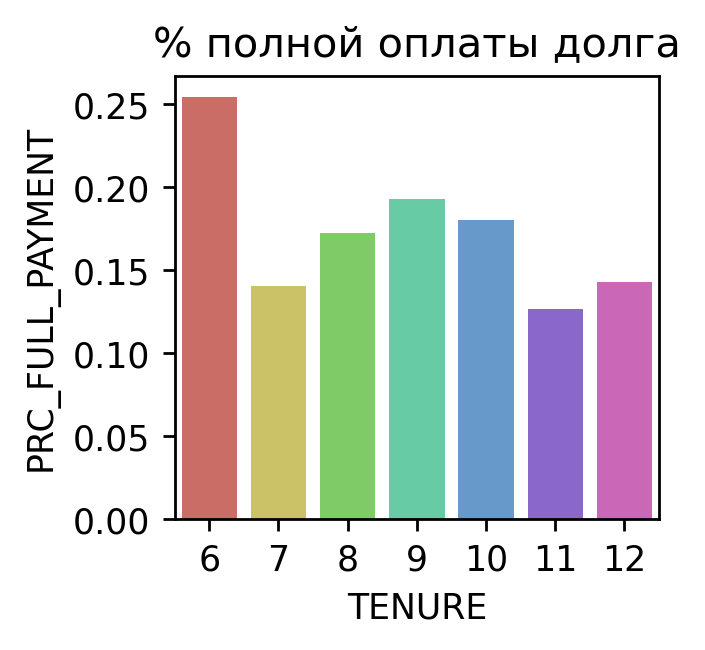

In [215]:
for col in df.drop("TENURE", axis=1).columns:
    drow_barplot(df, col, feature_translation_dict)

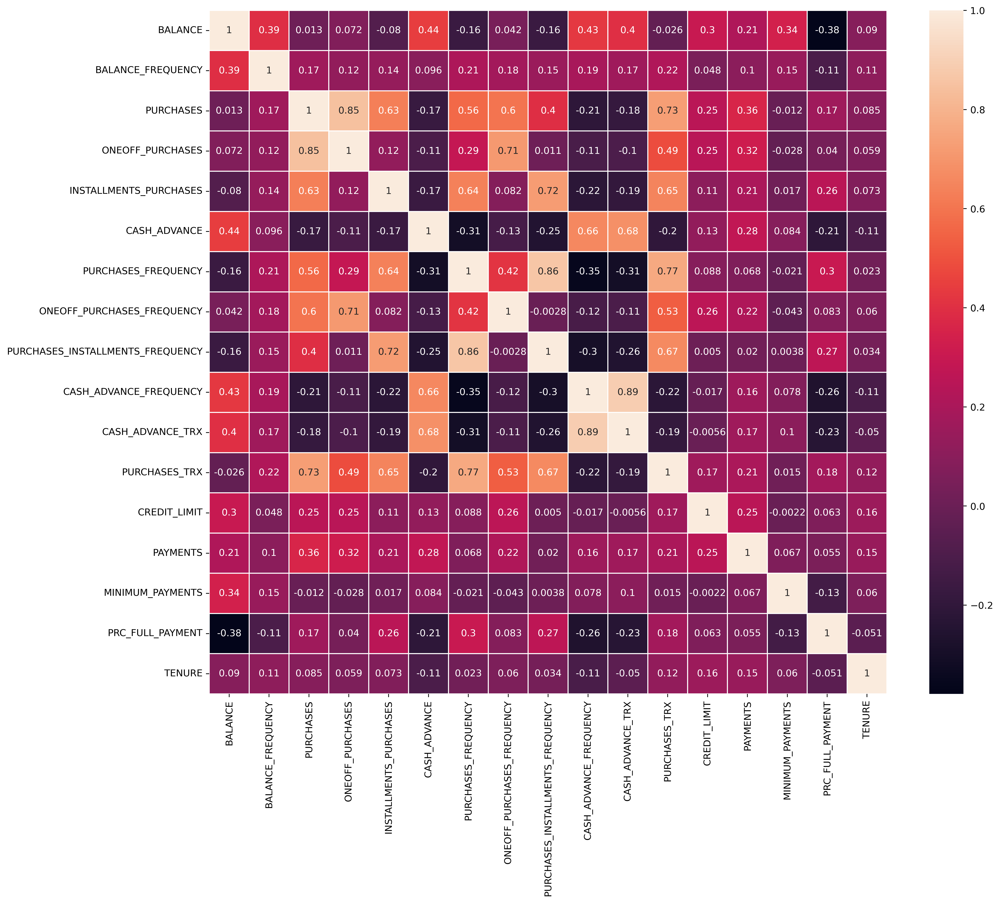

In [163]:
#Посмотрим попарную корреляцию между признаками
fig = plt.figure(figsize=(16, 13), dpi=400)
sns.heatmap(data=df.corr(), annot=True, linewidths=1)
plt.show()
#Видно, что сильных линейных зависимостей нет в данных

In [211]:
def check_VIF(df):
    VIF_dict = {}
    for col in df.columns:
        X, y = df.drop(col, axis=1), df[col]
        model = LinearRegression()
        model.fit(X, y)

        R_2 = 1 - (MSE(model.predict(X), y) / y.var())
        VIF_dict[col] = round(1 / (1 - R_2), 3)
    print(pd.DataFrame({"feature": VIF_dict.keys(), "VIF": VIF_dict.values()}).sort_values(by="VIF", ascending=False))

In [212]:
#Видна очень сильная линейная зависимость, нужно попробовать удалить 1 признак, далее посмотреть на результат
check_VIF(df)

                             feature       VIF
2                          PURCHASES  6321.964
3                   ONEOFF_PURCHASES  3855.804
4             INSTALLMENTS_PURCHASES  1813.784
8   PURCHASES_INSTALLMENTS_FREQUENCY    15.008
6                PURCHASES_FREQUENCY    14.112
7         ONEOFF_PURCHASES_FREQUENCY     6.062
9             CASH_ADVANCE_FREQUENCY     5.387
10                  CASH_ADVANCE_TRX     5.302
11                     PURCHASES_TRX     4.687
5                       CASH_ADVANCE     2.297
0                            BALANCE     2.125
13                          PAYMENTS     1.419
1                  BALANCE_FREQUENCY     1.390
12                      CREDIT_LIMIT     1.347
15                  PRC_FULL_PAYMENT     1.341
14                  MINIMUM_PAYMENTS     1.176
16                            TENURE     1.159


In [214]:
#Удалим признак PURCHASES, чтобы убрать линейную зависимость
df.drop("PURCHASES", axis=1, inplace=True)
check_VIF(df)
#Теперь все замечательно!

                             feature     VIF
7   PURCHASES_INSTALLMENTS_FREQUENCY  15.004
5                PURCHASES_FREQUENCY  14.110
6         ONEOFF_PURCHASES_FREQUENCY   6.060
8             CASH_ADVANCE_FREQUENCY   5.386
9                   CASH_ADVANCE_TRX   5.302
10                     PURCHASES_TRX   4.683
3             INSTALLMENTS_PURCHASES   2.617
2                   ONEOFF_PURCHASES   2.370
4                       CASH_ADVANCE   2.297
0                            BALANCE   2.124
12                          PAYMENTS   1.419
1                  BALANCE_FREQUENCY   1.390
11                      CREDIT_LIMIT   1.347
14                  PRC_FULL_PAYMENT   1.340
13                  MINIMUM_PAYMENTS   1.176
15                            TENURE   1.159


In [217]:
def hopkins(X):
    d = X.shape[1]
    n = len(X)
    m = int(0.1 * n)
    nbrs = NearestNeighbors(n_neighbors=1).fit(X)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    distance = sum(ujd) / (sum(ujd) + sum(wjd))
 
    return distance

print(f"Результат: {round(hopkins(df), 3)}")
#Гипотеза успешнно подтвердилась, что в наших данных, если различные кластеры, а не просто скопление 

Результат: 0.96


In [250]:
#Масштабируем наши данные 

scaler = StandardScaler()
df_scaled = pd.DataFrame(scaler.fit_transform(df))

In [576]:
model = KMeans(n_clusters=4)
model.fit(df_scaled)
predict = pd.Series(model.predict(df_scaled))

In [623]:
#Реализация метрики Silouette Score - Слуэтный коэффициент
#Полностью рабочая, показывает тот же результат, что и версия из sklearn
#a_xi - среднее расстояние от объекта до объектов из того же класса
#b_xi - минимального среднее расстояние от объекта i до объектов других классов
def custom_silouette_score(X, y):
    s_x = []
    for i in range(len(X)):
        obj_x, job_y = X.iloc[i], y.iloc[i]
        X_ci = X.loc[y[y==job_y].index].drop(i, axis=0)
        # len(X_ci), а не len(X_ci) - 1, так как уже данный объект был выкинут из выборки
        a_xi = 1 / ( len(X_ci)) * float((np.sum(((X_ci - obj_x)**2), axis=1)**0.5).sum())
        b_xi_list = []
        for  j in y[y!=job_y].unique():
            X_cj = X.loc[y[y==j].index]
            b_xi = 1 / ( len(X_cj)) * float((np.sum(((X_cj - obj_x)**2), axis=1)**0.5).sum())
            b_xi_list.append(b_xi)
        b_xi = min(b_xi_list)
        s_xi = (b_xi - a_xi) / max(a_xi, b_xi)
        s_x.append(s_xi)
    return s_x

In [627]:
print(f"Результат метрики Силуэтного коэффициента из sklearn: {round(float(silhouette_score(df_scaled, predict)), 5)}")
print(f"Результат метрики Силуэтного коэффициента из custom: {round(float(np.array(custom_silouette_score(df_scaled, predict)).mean()), 5)}")

Результат метрики Силуэтного коэффициента из sklearn: 0.14968
Результат метрики Силуэтного коэффициента из custom: 0.14968


In [630]:
#Блок кода, который замеряем внутриклассовое и межкластерное расстояние
#Построение модели K-means
intraclass_distance_dict = {}
intercluster_distance_dict = {}
silhouette_dict = {}
calinski_harabasz_dict = {}
davies_bouldin_dict = {}
#Глобальный центр для всех объектов 
global_centers = np.mean(df_scaled, axis=0)
for i in range(2, 16):
    #Обучение медели
    model = KMeans(n_clusters=i, max_iter=500)
    model.fit(df_scaled)
    predict = pd.Series(model.predict(df_scaled))
    sum_distance_intraclass, intercluster_distance = 0, 0
    for j in range(model.n_clusters):
        #Считаем внутриклассовое и межкластерое расстояние
        indexes_intraclass = predict[predict==j].index
        df_intraclass_j = df_scaled.loc[indexes_intraclass]
        sum_distance_intraclass += float(np.sum((df_intraclass_j - model.cluster_centers_[j])**2, axis=1).sum())
        
        len_class_j = len(indexes_intraclass)
        center_j = model.cluster_centers_[j]
        intercluster_distance += len_class_j * float(((global_centers - center_j)**2).sum())
    #Добавляем в словарики
    intraclass_distance_dict[i] = sum_distance_intraclass
    intercluster_distance_dict[i] = intercluster_distance
    silhouette_dict[i] = silhouette_score(df_scaled, predict)
    calinski_harabasz_dict[i] = calinski_harabasz_score(df_scaled, predict)
    davies_bouldin_dict[i] = davies_bouldin_score(df_scaled, predict)

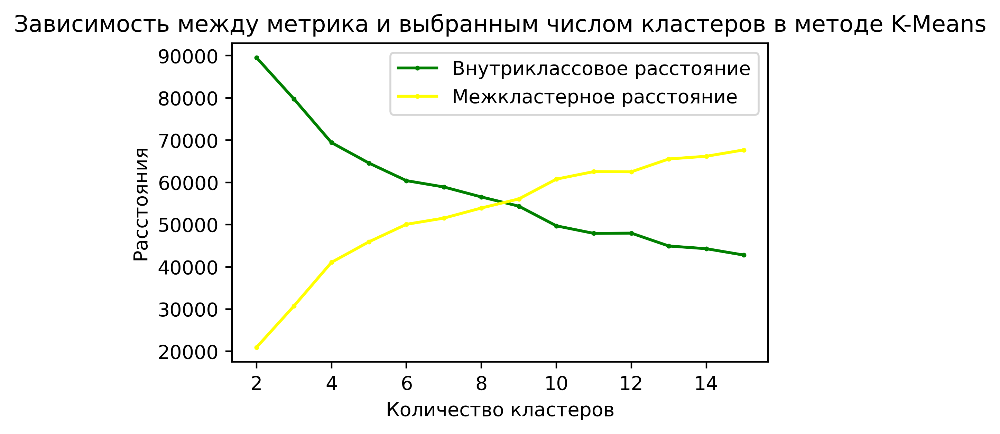

In [565]:
fig = plt.figure(figsize=(5, 3), dpi=400)
plt.title("Зависимость между метрика и выбранным числом кластеров в методе K-Means")
plt.ylabel("Расстояния")
plt.xlabel("Количество кластеров")
plt.plot(intraclass_distance_dict.keys(), intraclass_distance_dict.values(), color="green", marker=".", markersize=3, label="Внутриклассовое расстояние")
plt.plot(intercluster_distance_dict.keys(), intercluster_distance_dict.values(), color="yellow", marker=".", markersize=3, label="Межкластерное расстояние")
plt.legend()
plt.show()

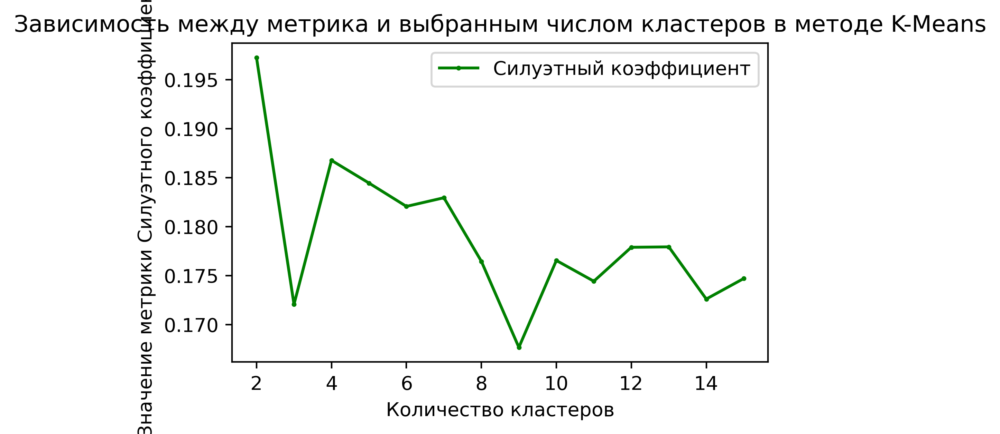

In [633]:
fig = plt.figure(figsize=(5, 3), dpi=400)
plt.title("Зависимость между метрика и выбранным числом кластеров в методе K-Means")
plt.ylabel("Значение метрики Силуэтного коэффициента")
plt.xlabel("Количество кластеров")
plt.plot(silhouette_dict.keys(), silhouette_dict.values(), color="green", marker=".", markersize=3, label="Силуэтный коэффициент")
plt.legend()
plt.show()

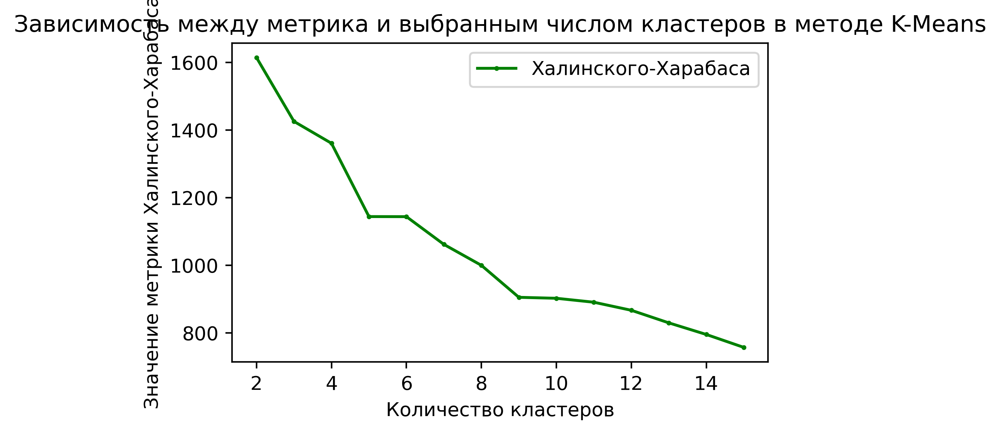

In [634]:
fig = plt.figure(figsize=(5, 3), dpi=400)
plt.title("Зависимость между метрика и выбранным числом кластеров в методе K-Means")
plt.ylabel("Значение метрики Халинского-Харабаса")
plt.xlabel("Количество кластеров")
plt.plot(calinski_harabasz_dict.keys(), calinski_harabasz_dict.values(), color="green", marker=".", markersize=3, label="Халинского-Харабаса")
plt.legend()
plt.show()

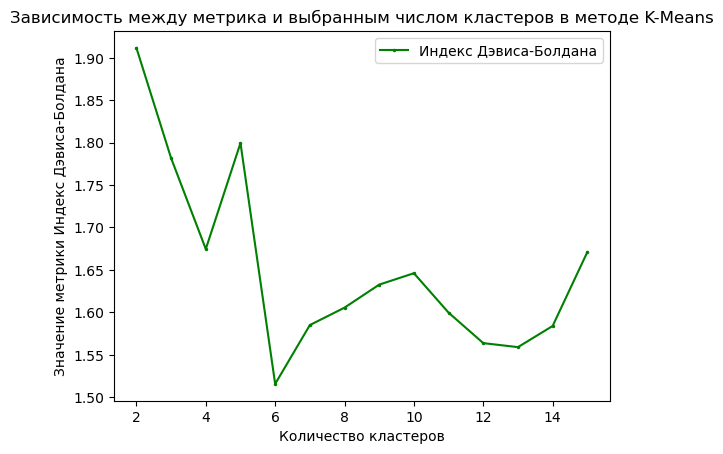

In [635]:
plt.title("Зависимость между метрика и выбранным числом кластеров в методе K-Means")
plt.ylabel("Значение метрики Индекс Дэвиса-Болдана")
plt.xlabel("Количество кластеров")
plt.plot(davies_bouldin_dict.keys(), davies_bouldin_dict.values(), color="green", marker=".", markersize=3, label="Индекс Дэвиса-Болдана")
plt.legend()
plt.show()

### Результат
- На графиках видно, что 3 опорные точки, для которых можно проводить исследование, это точки 4, 6, 8, так как наши метрики показывают, что нужно посмотреть эти зависимости
- Для данных кластеров постоить различные группировки и посмотреть, чем отличаются данные кластеры
- Различные графики, такие как distplot, boxplot, то есть посмотреть распределение для каждого класса
- Далее возьмем метод PCA, после чего сузим признаковое пространство сначала до 2-мерного, после чего до 3-х мерного признакового пространства, далее посмотреть на графиках распределение
- Те же самые операции проделать с метод t-sne
- Выбрать лучше количество класстеров основываясь на предыдущие эксперименты

In [416]:
#Для начала вольмем k=4
model = KMeans(n_clusters=4, max_iter=500)
model.fit(df_scaled)
predict = pd.DataFrame({"col": model.predict(df_scaled)})
df["target"] = predict

In [417]:
#Функция для отрисовки гистограмм с использование barplot
def drow_barplot(df, col, feature_translation_dict):
    fig = plt.figure(figsize=(3, 2.75))
    plt.title(feature_translation_dict[col])
    plt.ylabel(col)
    sns.barplot(data=df.groupby("target")[col].mean(), palette="hls")
    plt.show()

In [418]:
df.groupby("target").mean()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
target,,,,,,,,,,,,,,,,
0,1252.060717,0.961969,1185.363030,391.762415,209.529671,0.833716,0.659623,0.427668,0.048218,0.828598,24.078598,5167.167700,1610.591645,522.480480,0.210330,11.780303
1,2175.616528,0.944808,127.451022,74.099104,1730.034811,0.174408,0.070105,0.107415,0.297671,6.120448,3.247899,3880.718954,1324.903661,1122.307127,0.027214,11.345238
2,663.918847,0.742212,183.903247,58.447388,212.474257,0.186856,0.086722,0.096575,0.052787,0.788906,2.925655,2906.408577,639.034050,414.655231,0.090578,11.513867
3,499.383612,0.897794,85.828877,557.570274,98.886111,0.871480,0.054460,0.820851,0.023478,0.402519,15.636364,2878.007208,746.851013,583.325394,0.284832,11.412924


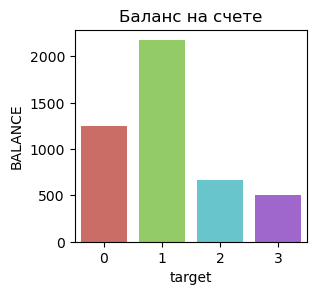

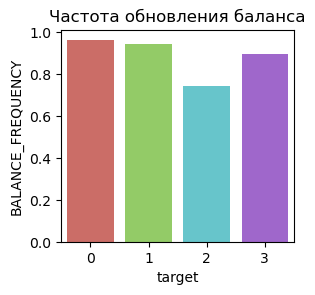

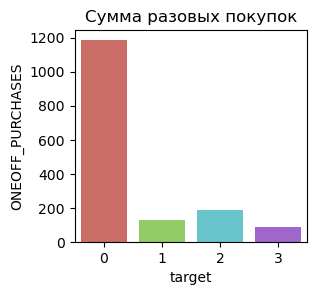

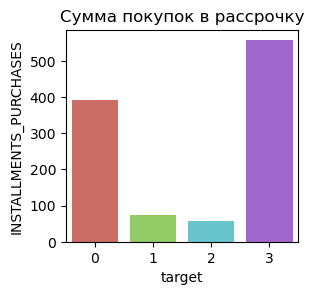

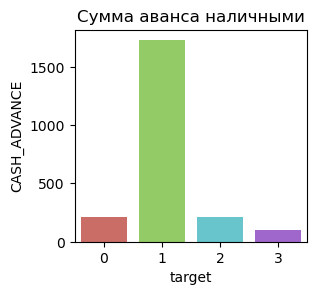

...

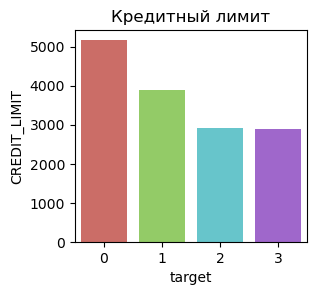

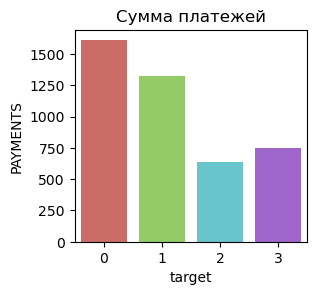

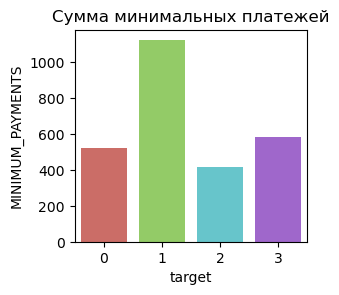

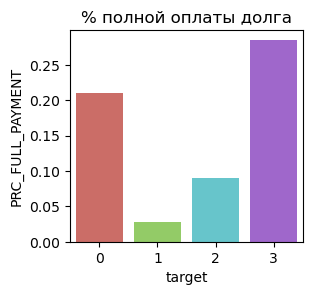

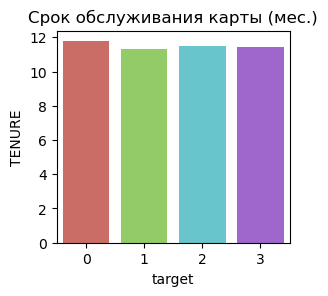

In [419]:
for col in df.drop("target", axis=1).columns:
    drow_barplot(df, col, feature_translation_dict)

In [420]:
def drow_distplot_4(df, col, feature_translation_dict):
    dict_color_4 = {0: "green", 1: "red", 2: "blue", 3: "violet"}
    fig = plt.figure(figsize=(8, 6.5))
    plt.title(feature_translation_dict[col])
    plt.ylabel(col)
    for i in range(4):
        sns.distplot(a=df[df["target"]==i][col], color=dict_color_4[i], kde=False)
    plt.show()

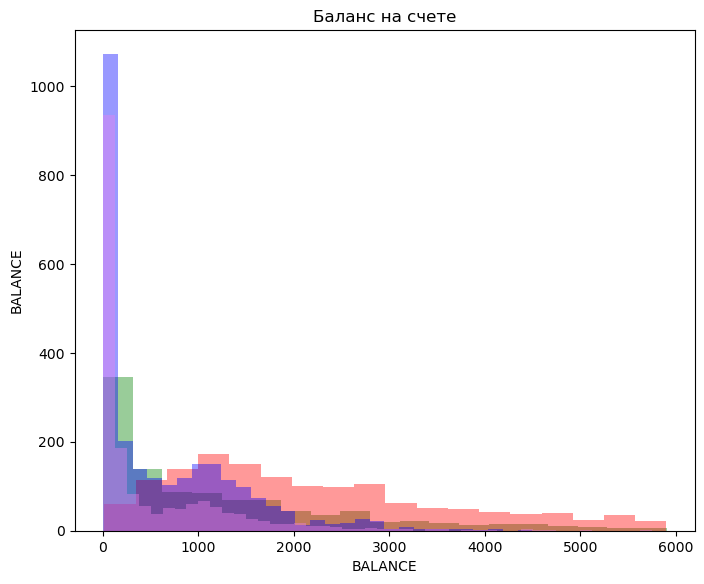

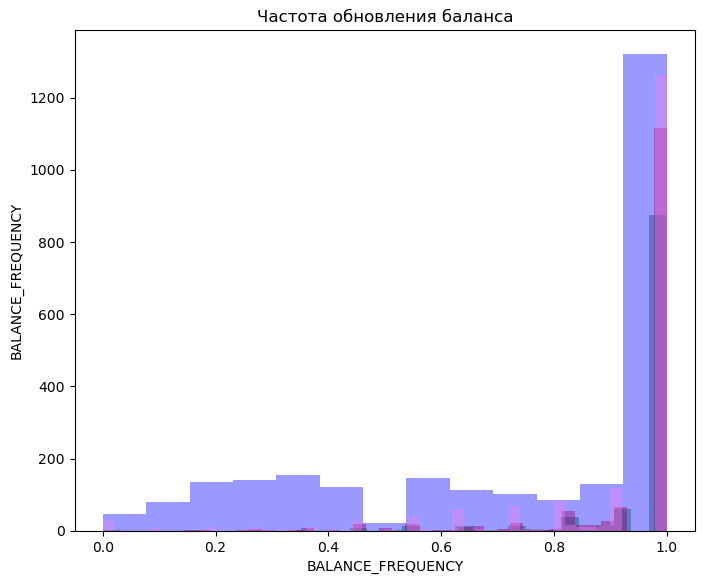

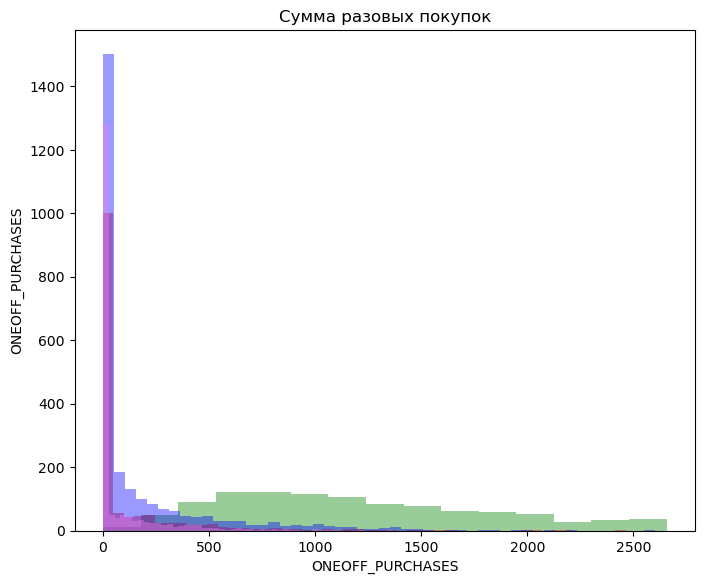

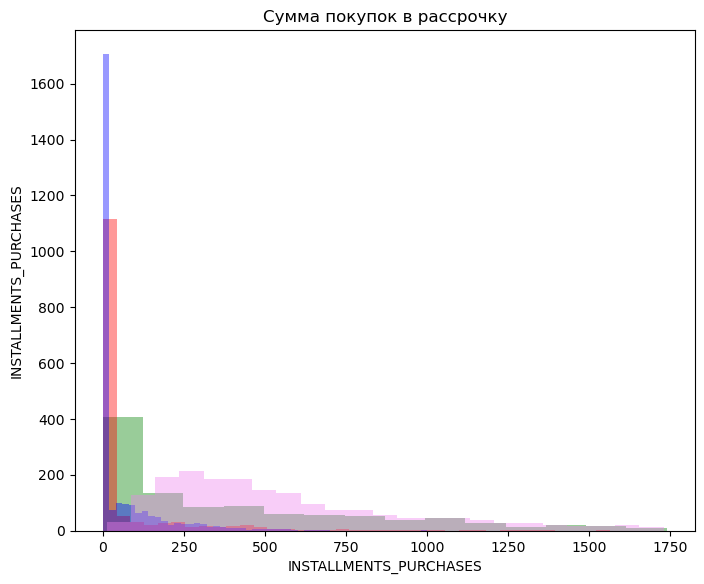

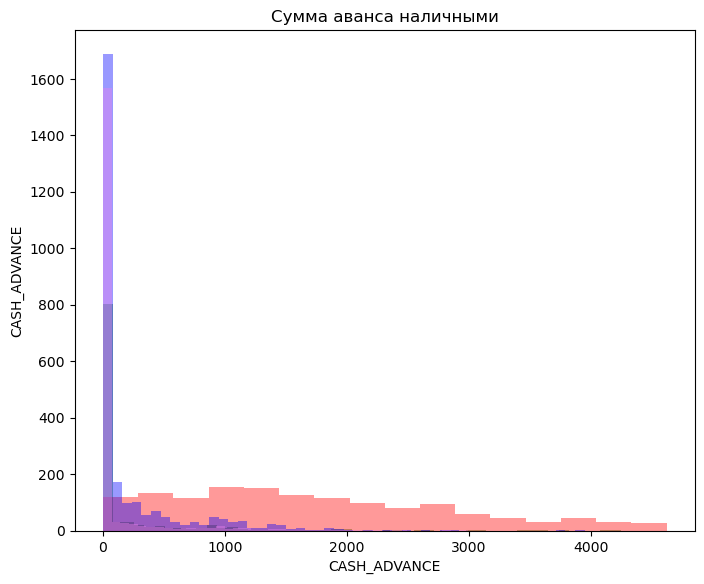

...

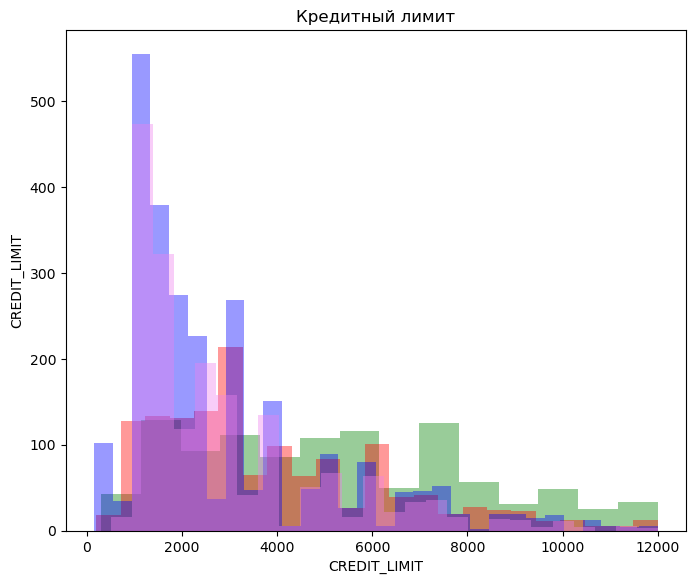

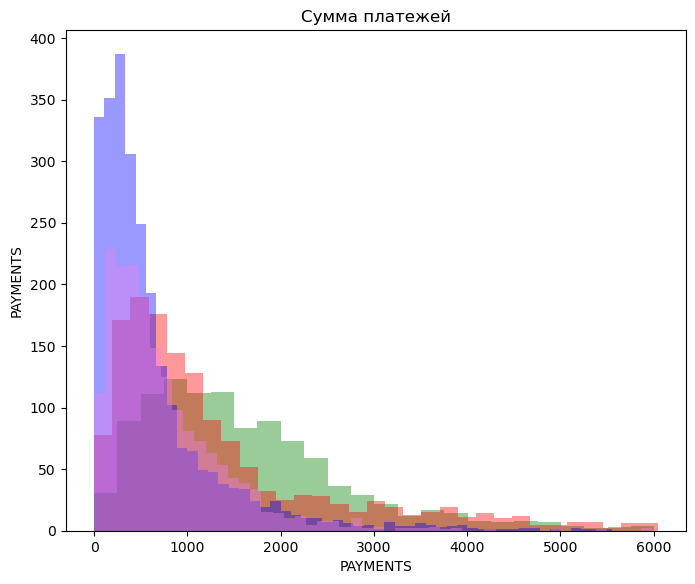

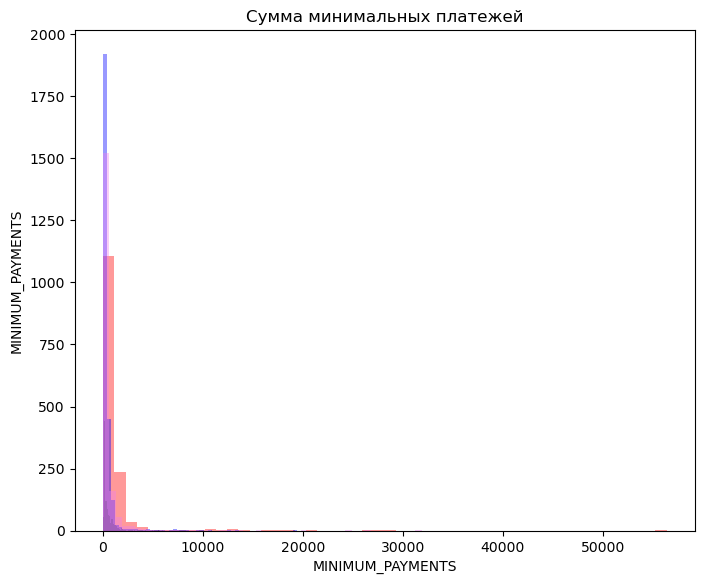

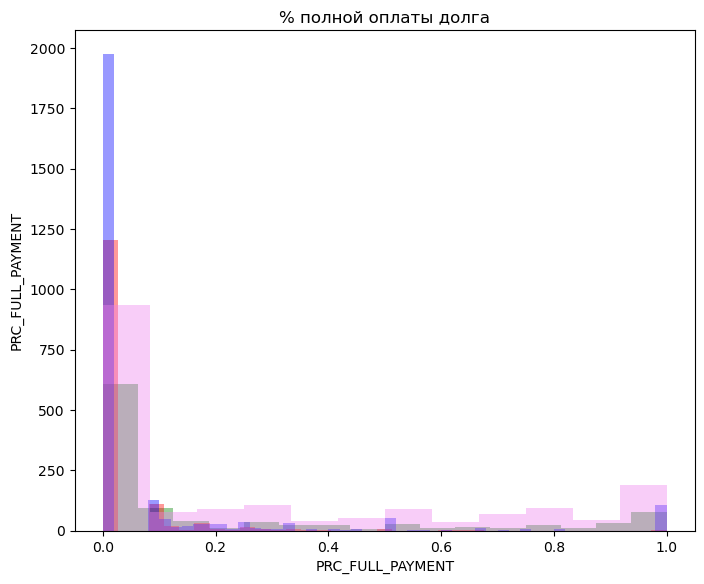

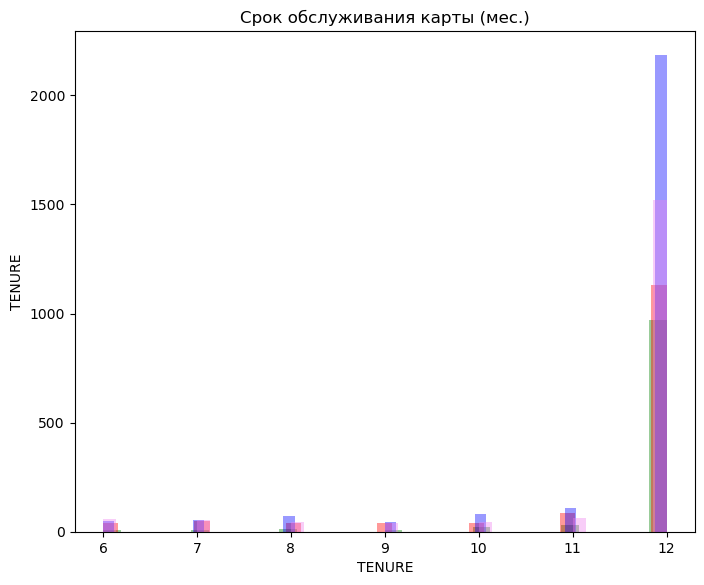

In [421]:
for col in df.drop("target", axis=1).columns:
    drow_distplot_4(df, col, feature_translation_dict)

In [422]:
def boxplot_hue_target(df, col, feature_translation_dict):
    fig = plt.figure(figsize=(2.8, 2.6), dpi=250)
    plt.title(feature_translation_dict[col])
    plt.ylabel(col)
    sns.boxplot(data=df, y=col, hue="target", palette={0: "green", 1: "red", 2: "blue", 3: "violet"})
    plt.show()

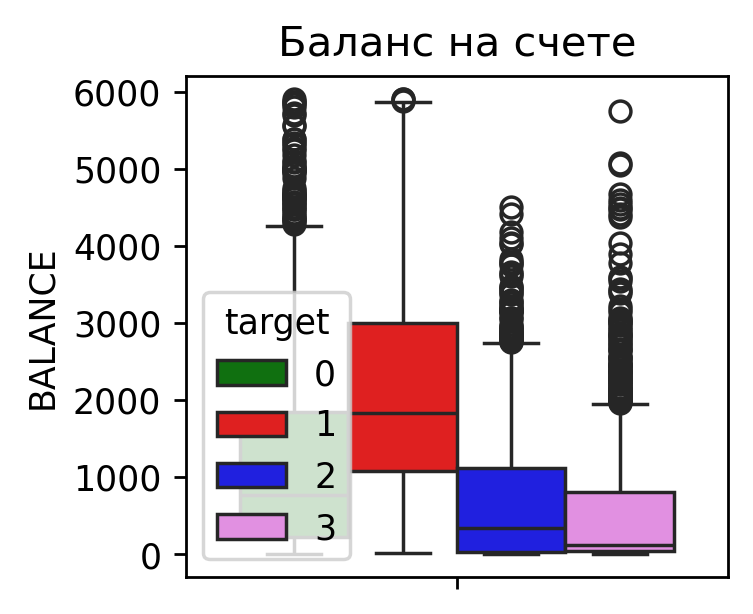

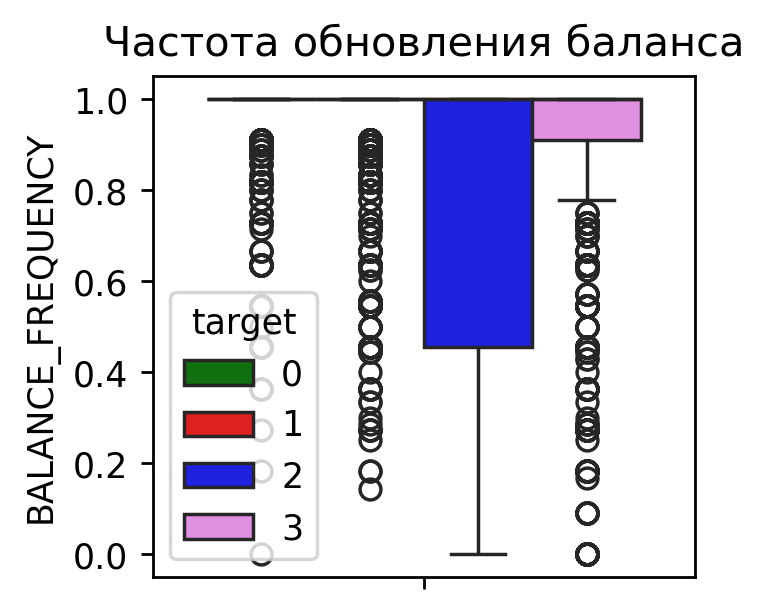

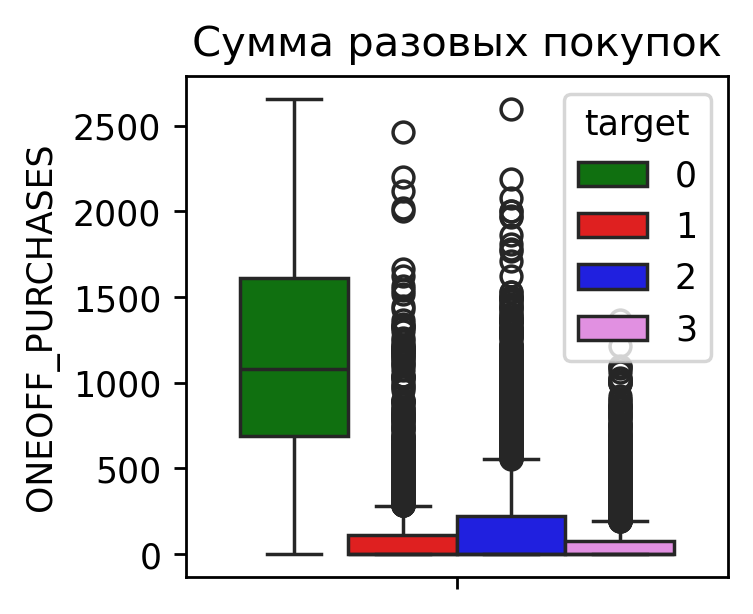

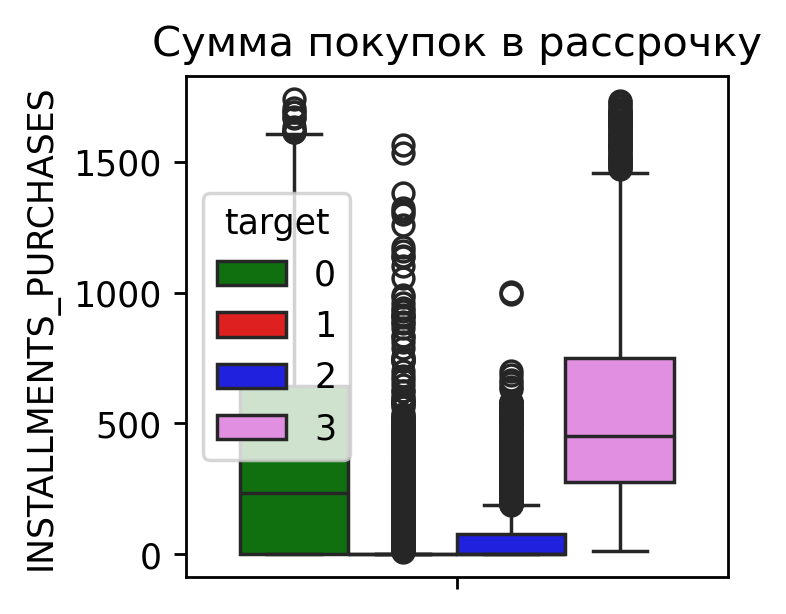

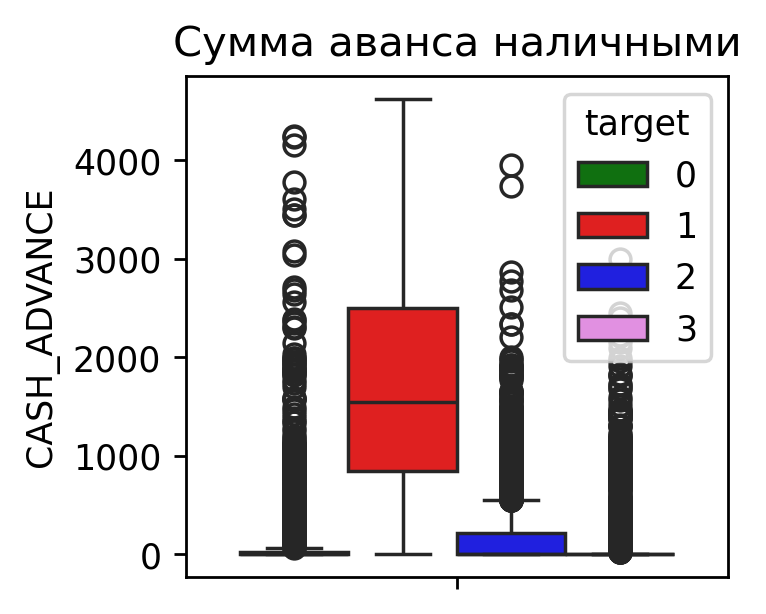

...

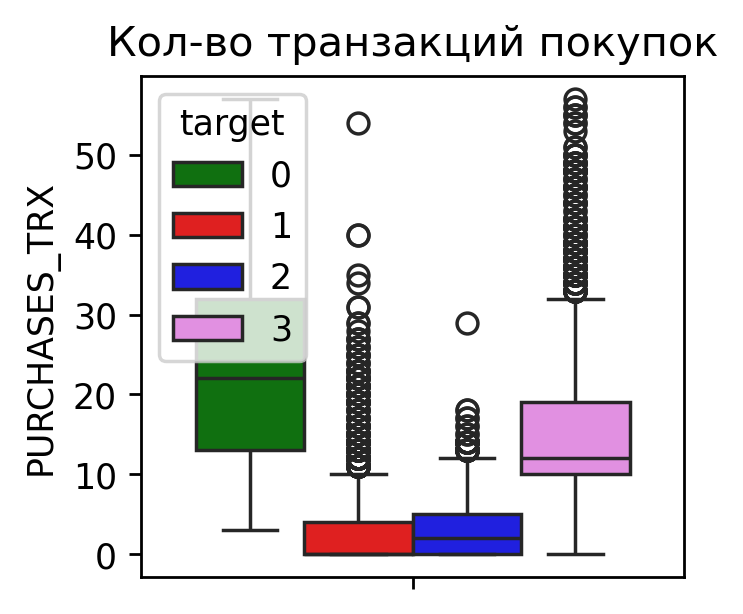

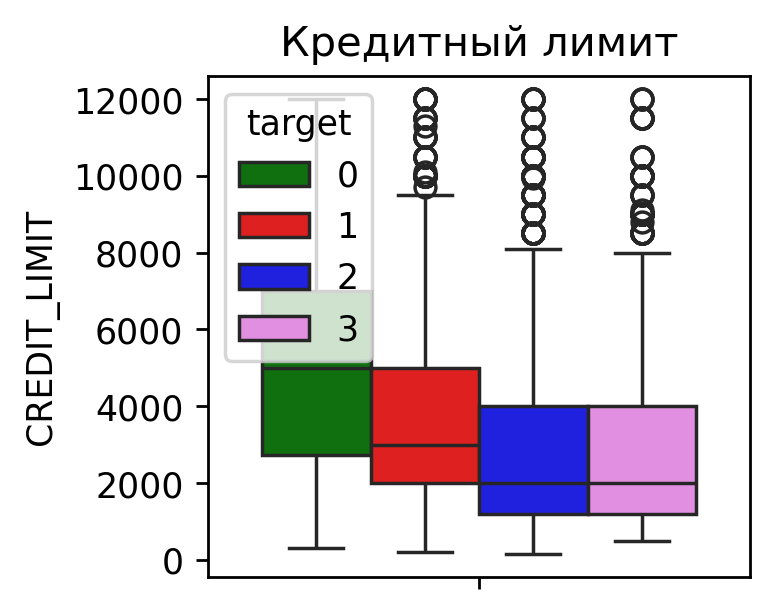

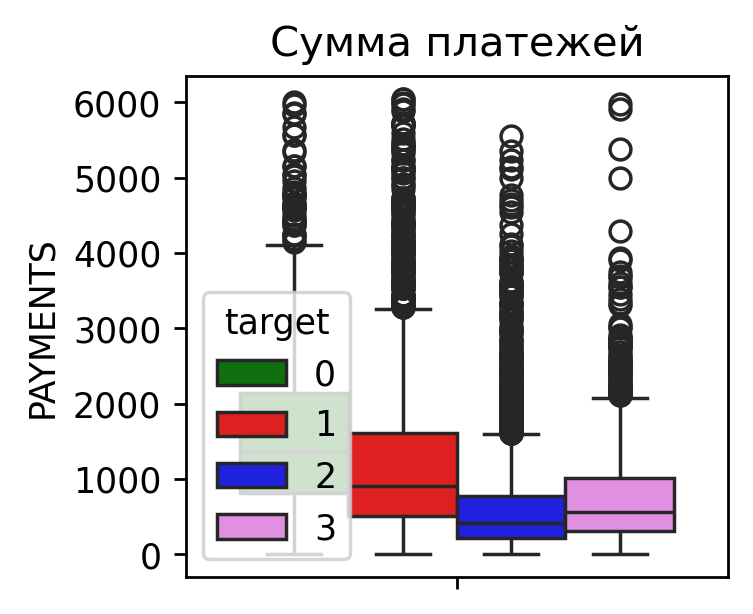

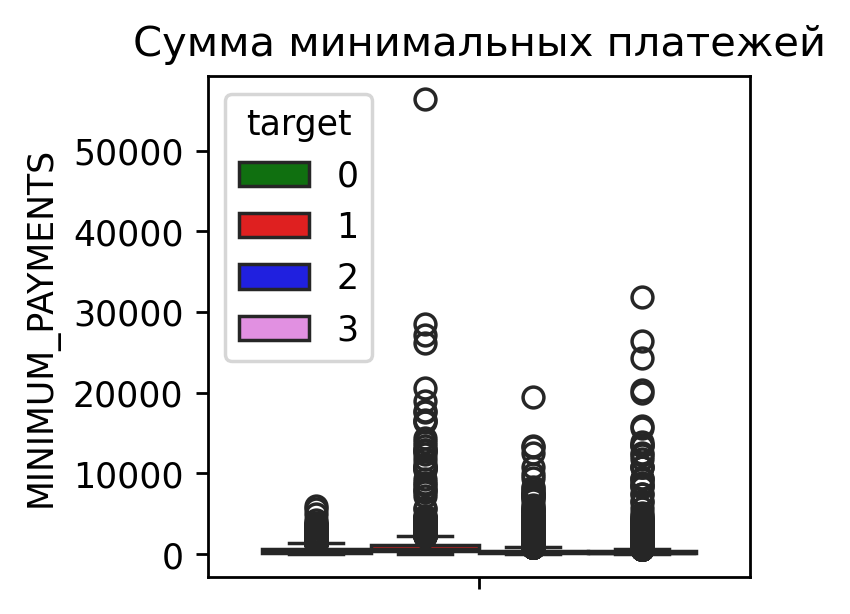

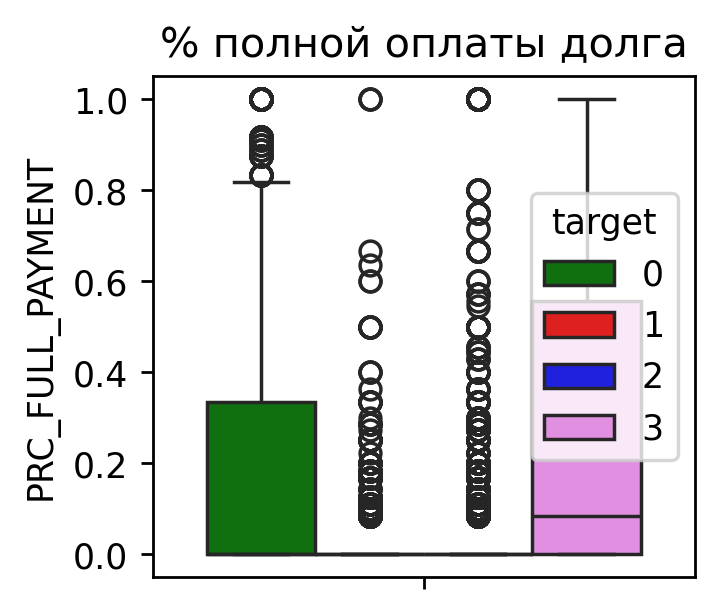

In [423]:
for col in df.drop(["target", "TENURE"], axis=1).columns:
    boxplot_hue_target(df, col, feature_translation_dict)

### Финальный результат
- Тагрет 0 - это скорее всего богатые клиенты, у которыз очень большие разовые покупки, у них самый высокий кредитный лимит, самое высокое количество транзакций и частота разовых покупок
- Таргет 1 - эти люди имеют очень много авансов , почти не тратят денег на различные покупки, самая высокая сумма минимальных платежей, самый низкий процент оплаты долга - это тот тип людей, которые используют карточку только для денег, ещё и имеют высокий долг, такой тип клиентов нам не нужен
- Таррег 2 - любят брать все в рассрочнку но и выплачивают долг самое главное
- Таргет 3 - спящие клиенты, которые особо не пользуются своим балансом

In [424]:
#Используем PCA для двумерного анализа
transformer = PCA(n_components=2)
pca_data_2 = pd.DataFrame(data=transformer.fit_transform(df_scaled))
pca_df_2 = pd.concat([pca_data_2, predict], axis=1)
pca_df_2.rename(columns={"col": "target"}, inplace=True)

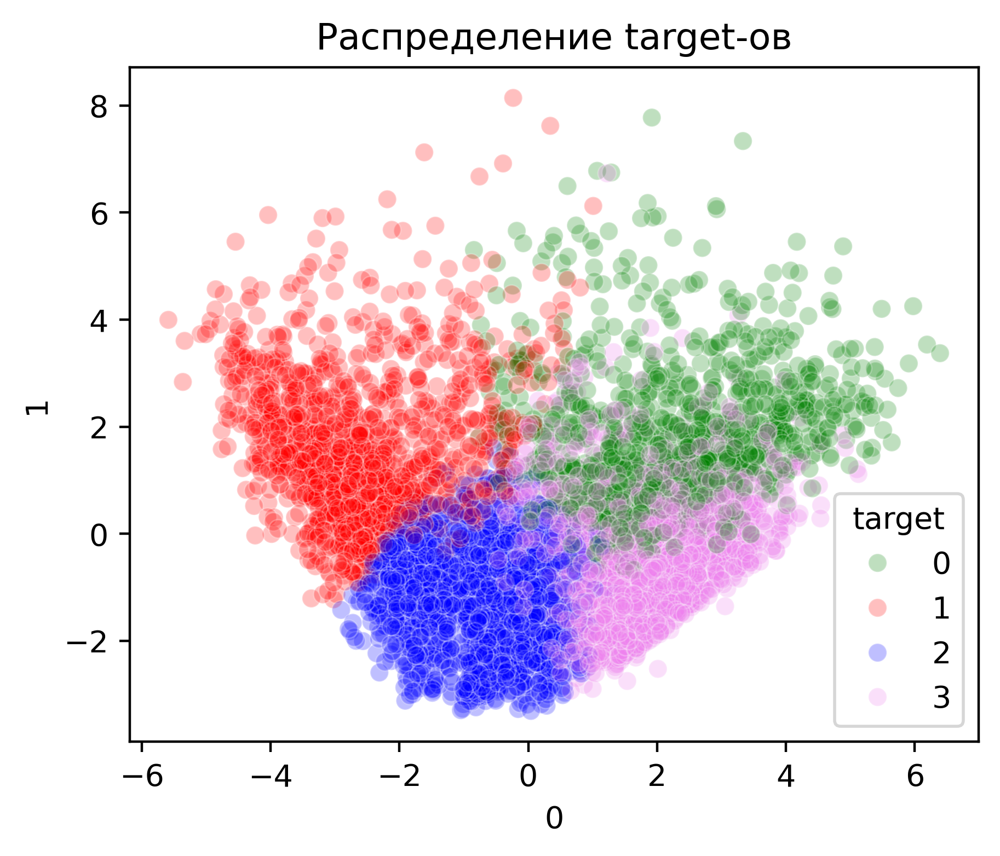

In [425]:
#Блок кода, который показывает распределение целевых переменных в двумерном пространстве
fig = plt.figure(figsize=(5, 4), dpi=400)
plt.title("Распределение target-ов")
sns.scatterplot(data=pca_df_2, x=0, y=1, hue="target", palette={0: "green", 1: "red", 2: "blue", 3: "violet"}, alpha=0.25)
plt.show()

In [426]:
#Используем PCA для трехмерного анализа
transformer = PCA(n_components=3)
pca_data_3 = pd.DataFrame(data=transformer.fit_transform(df_scaled))
pca_df_3 = pd.concat([pca_data_3, predict], axis=1)
pca_df_3.rename(columns={"col": "target"}, inplace=True)

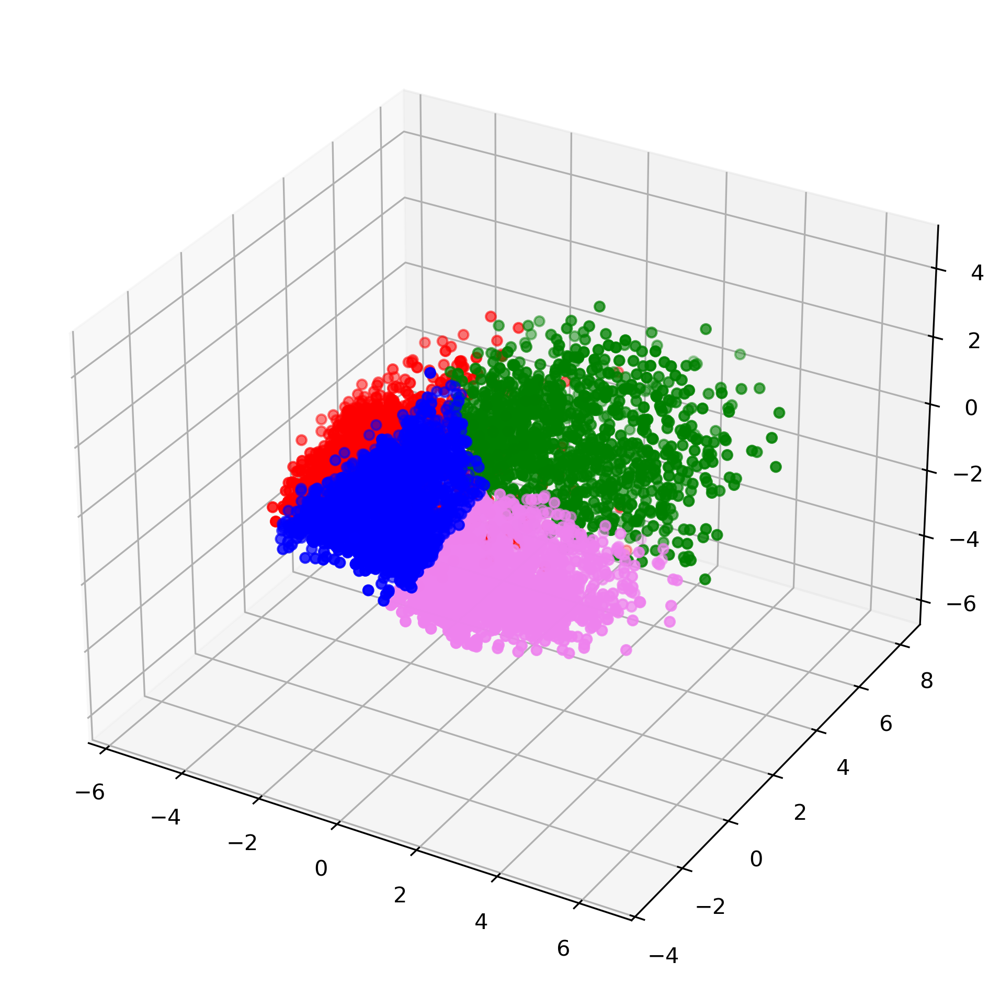

In [427]:
##Блок кода, который показывает распределение целевых переменных в трехмерном пространстве
fig = plt.figure(figsize=(10, 8), dpi=300)
ax = fig.add_subplot(111, projection="3d")
colors = {0: "green", 1: "red", 2: "blue", 3: "violet"}
for cluster_num in pca_df_3["target"].unique():
    cluster_data = pca_df_3[pca_df_3["target"] == cluster_num]
    
    ax.scatter(
        xs=cluster_data[0], 
        ys=cluster_data[1], 
        zs=cluster_data[2], 
        c=colors[cluster_num],     
        label=f'Кластер {cluster_num}' 
    )
plt.show()

In [428]:
#То же самое проделаем для кластеров с 6-ти различными классами
model = KMeans(n_clusters=6, max_iter=500)
model.fit(df_scaled)
predict = pd.DataFrame({"col": model.predict(df_scaled)})
df["target"] = predict

In [429]:
df.groupby("target").mean()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
target,,,,,,,,,,,,,,,,
0,2204.386371,0.933582,134.736685,70.051019,1995.190394,0.180574,0.076412,0.107723,0.326497,6.917355,3.370983,4013.376186,1427.770428,956.550916,0.032255,11.255280
1,66.502325,0.356042,160.901434,103.078384,168.595080,0.246797,0.067111,0.170883,0.026115,0.437859,3.567878,3223.935628,628.049565,126.679037,0.209323,11.291587
2,1599.173843,0.977506,825.632254,957.560859,394.111703,0.921048,0.379490,0.846236,0.078294,1.472272,32.060823,5147.731338,1924.409460,1063.040802,0.139701,11.906977
3,1009.236370,0.948994,1158.549000,144.068700,131.949250,0.756948,0.685971,0.220142,0.035755,0.553750,18.155000,4734.309091,1330.547712,447.647555,0.216207,11.713750
4,403.738467,0.921215,63.740976,495.263119,78.374114,0.865935,0.045849,0.812086,0.019344,0.330357,13.991709,2711.155078,647.330048,439.226736,0.307924,11.325255
5,1225.508102,0.971801,143.457240,42.384908,339.496207,0.147969,0.073228,0.073766,0.092368,1.422451,2.399132,2787.174620,677.034239,803.001908,0.015321,11.669197


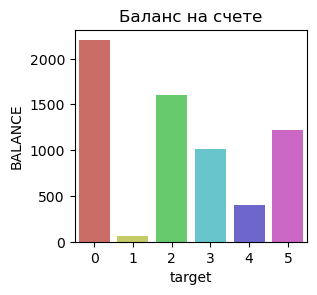

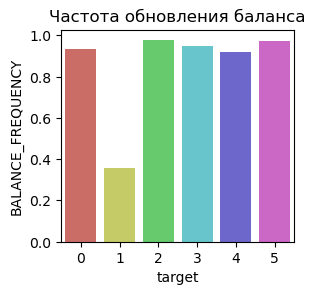

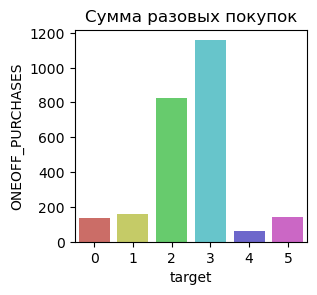

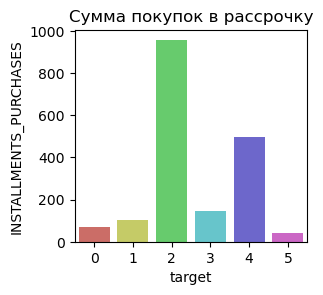

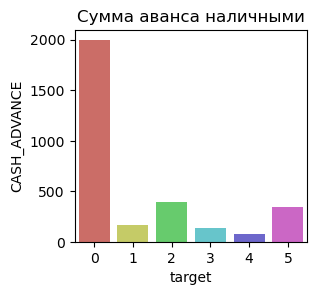

...

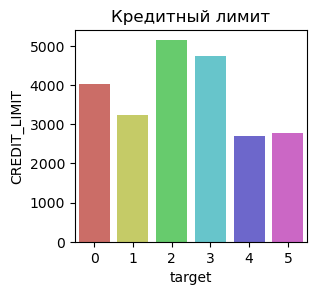

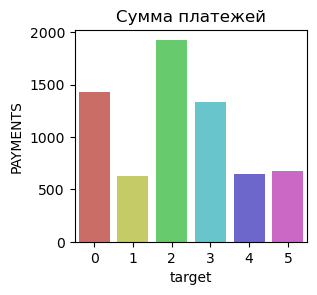

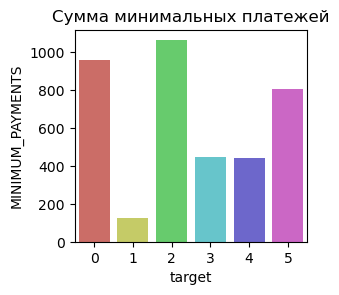

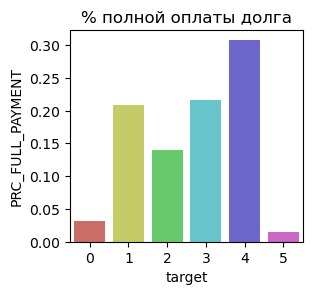

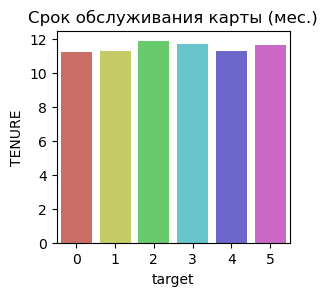

In [430]:
for col in df.drop("target", axis=1).columns:
    drow_barplot(df, col, feature_translation_dict)

In [431]:
def drow_distplot_6(df, col, feature_translation_dict):
    fig = plt.figure(figsize=(8, 6.5))
    plt.title(feature_translation_dict[col])
    plt.ylabel(col)
    for i in range(6):
        sns.distplot(a=df[df["target"]==i][col], kde=False, label=i)
    plt.legend()
    plt.show()

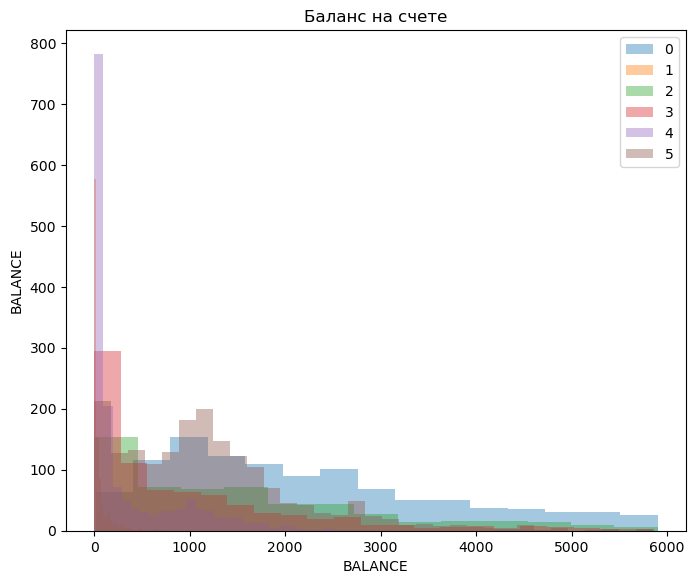

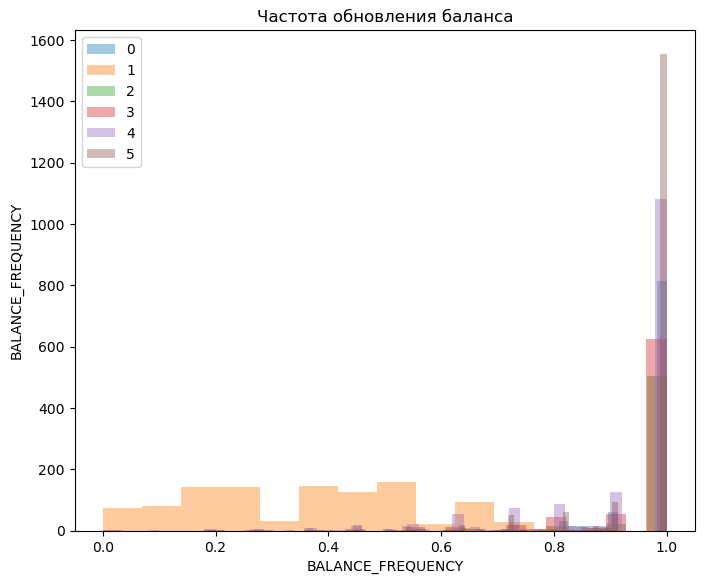

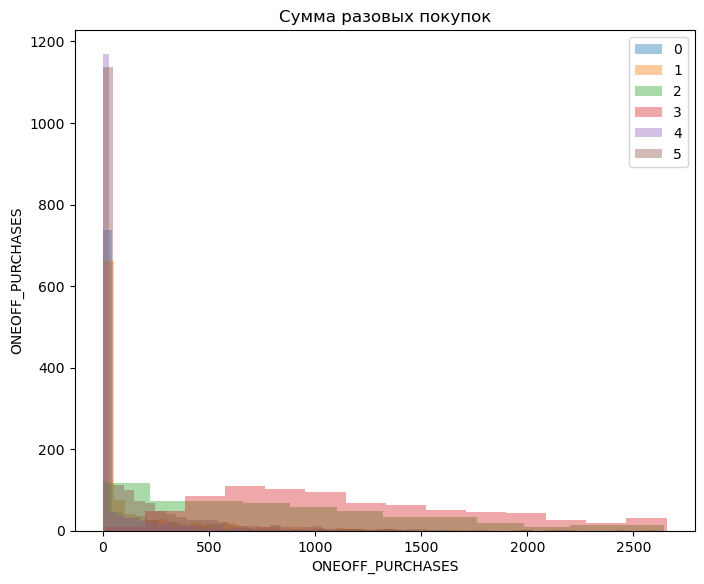

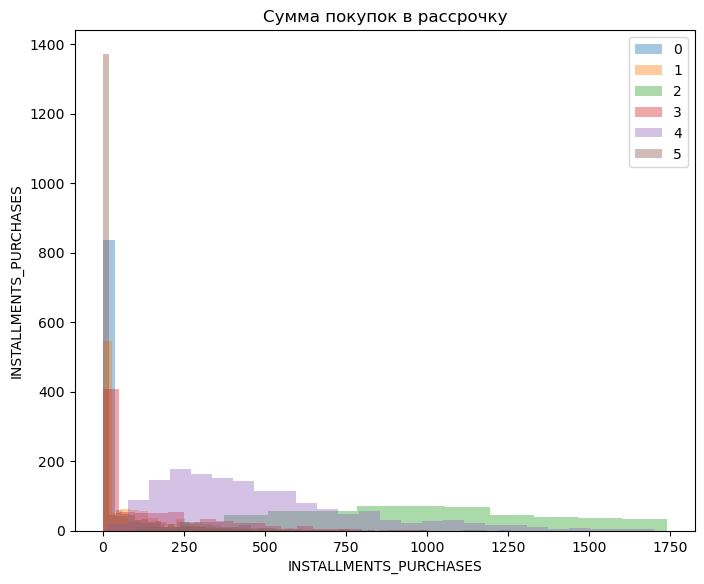

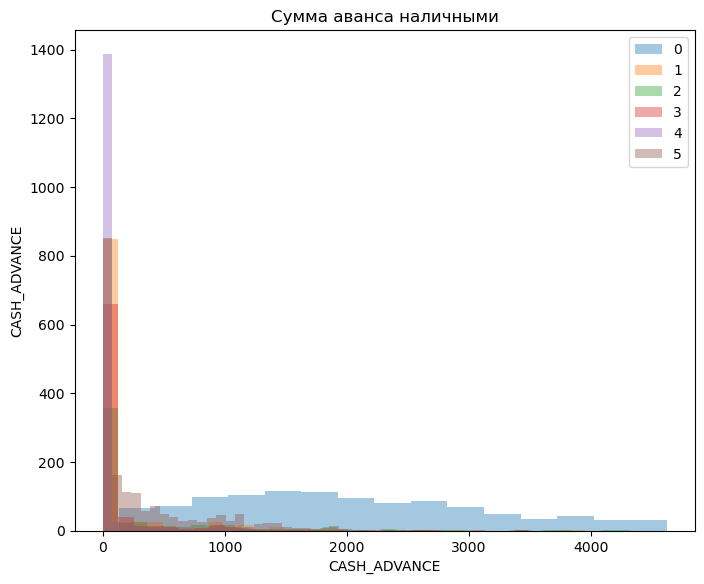

...

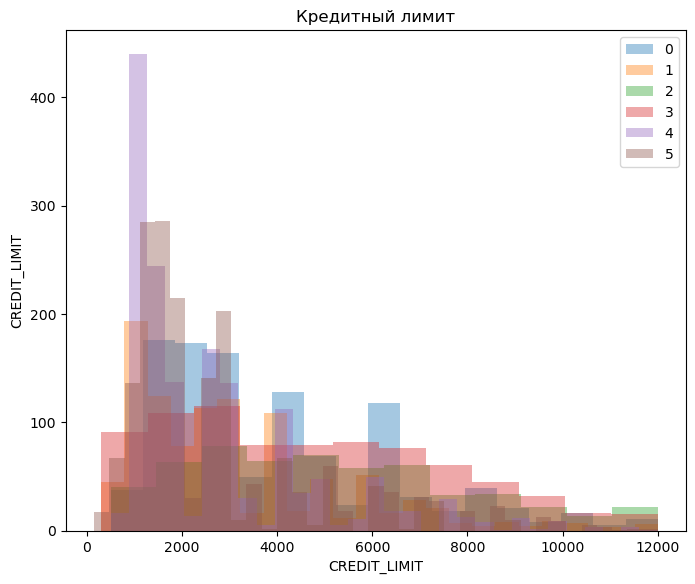

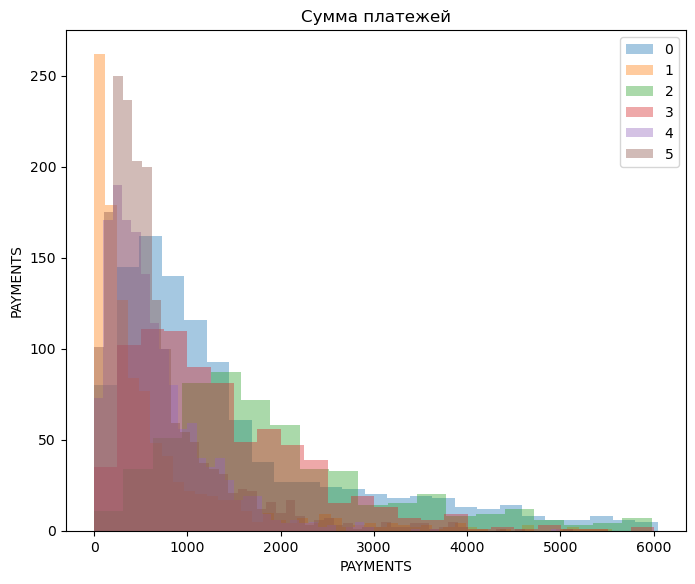

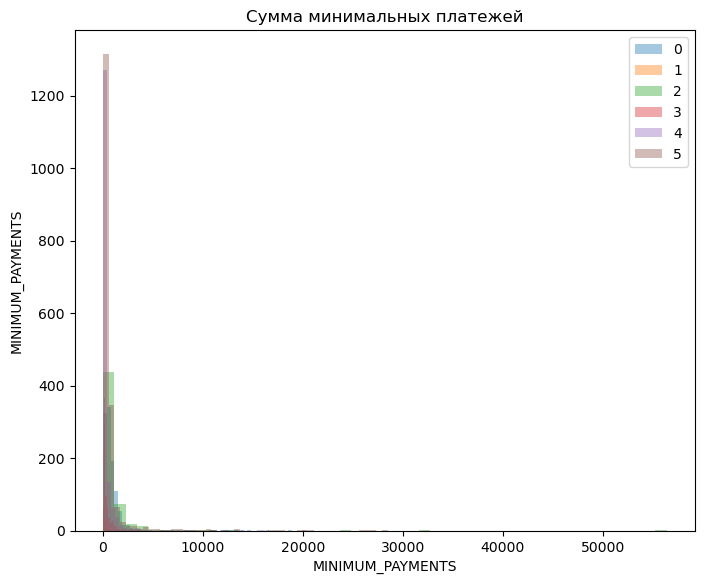

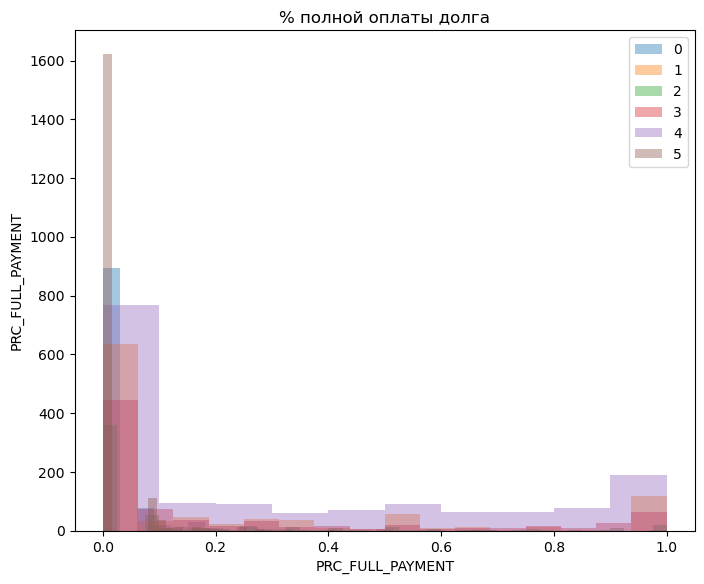

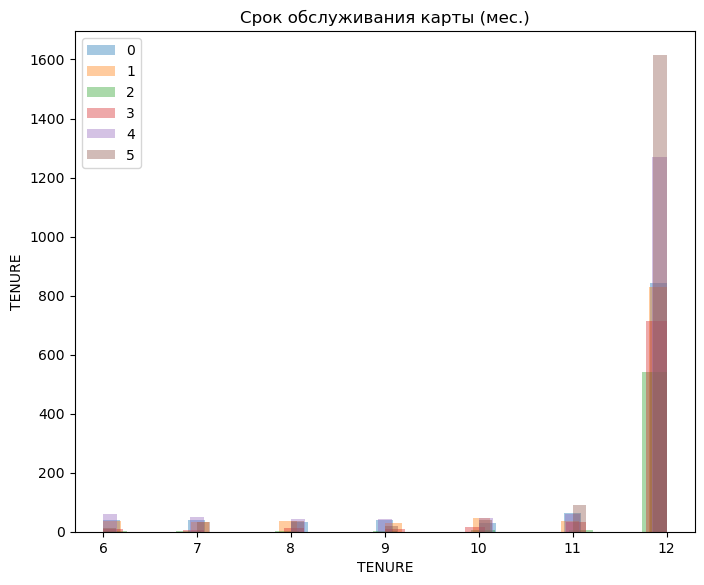

In [432]:
for col in df.drop("target", axis=1).columns:
    drow_distplot_6(df, col, feature_translation_dict)

In [433]:
def boxplot_hue_target(df, col, feature_translation_dict):
    fig = plt.figure(figsize=(2.8, 2.6), dpi=250)
    plt.title(feature_translation_dict[col])
    plt.ylabel(col)
    sns.boxplot(data=df, y=col, hue="target")
    plt.show()

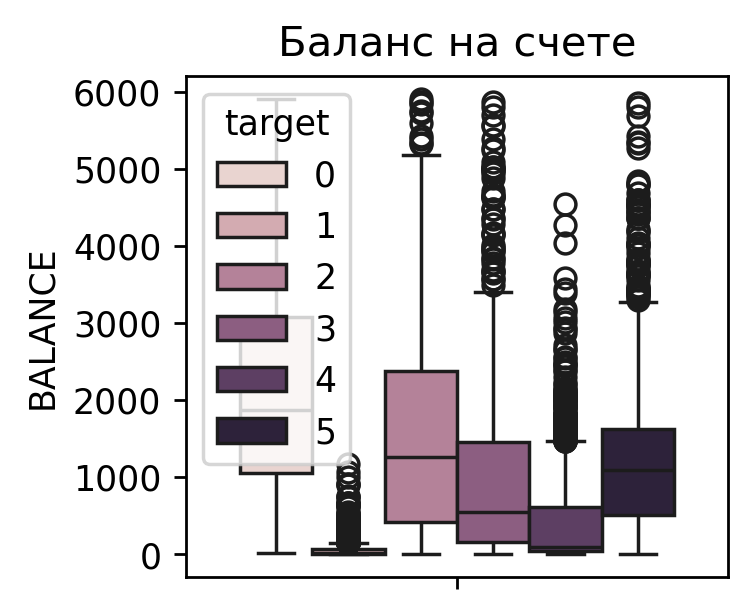

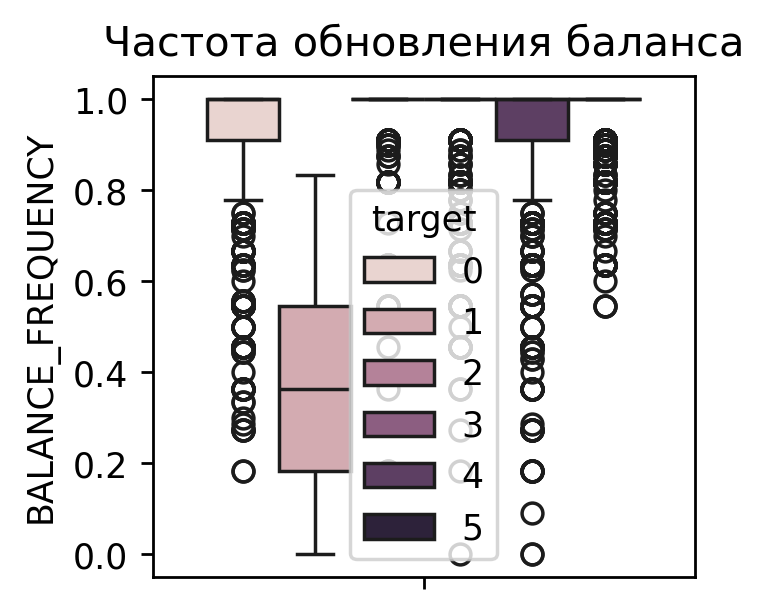

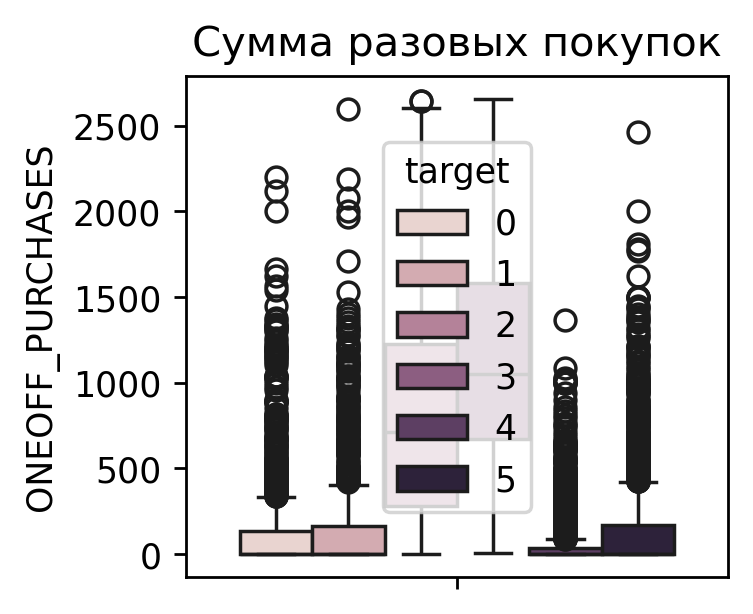

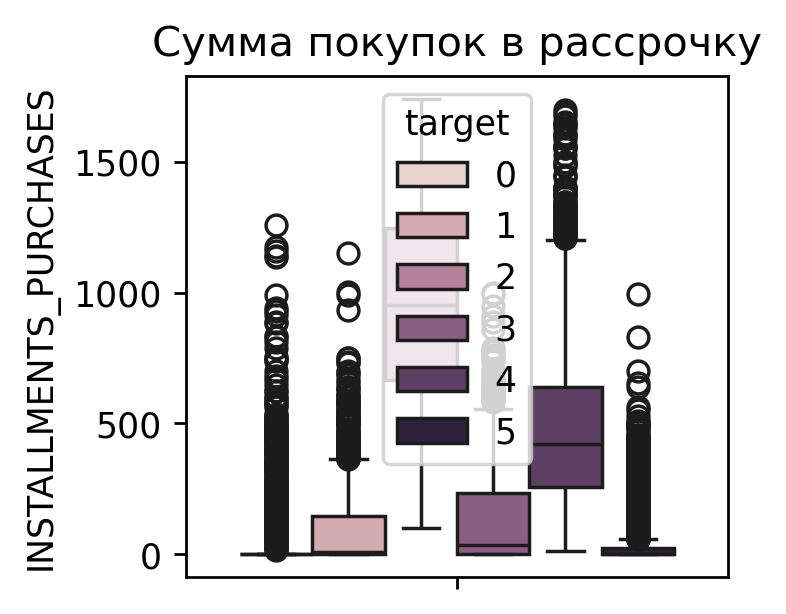

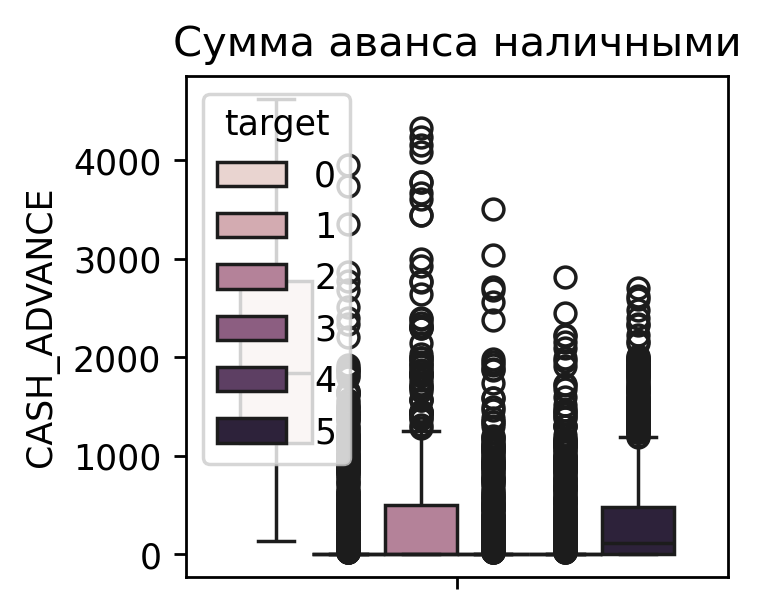

...

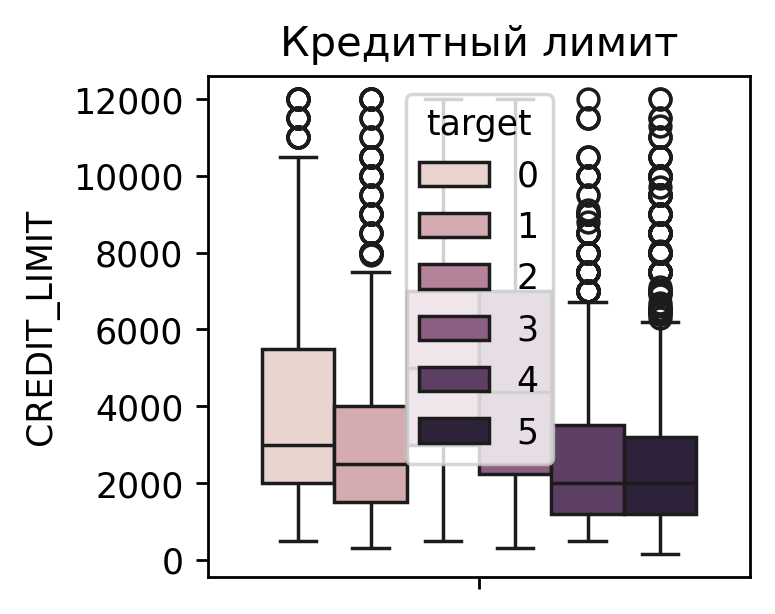

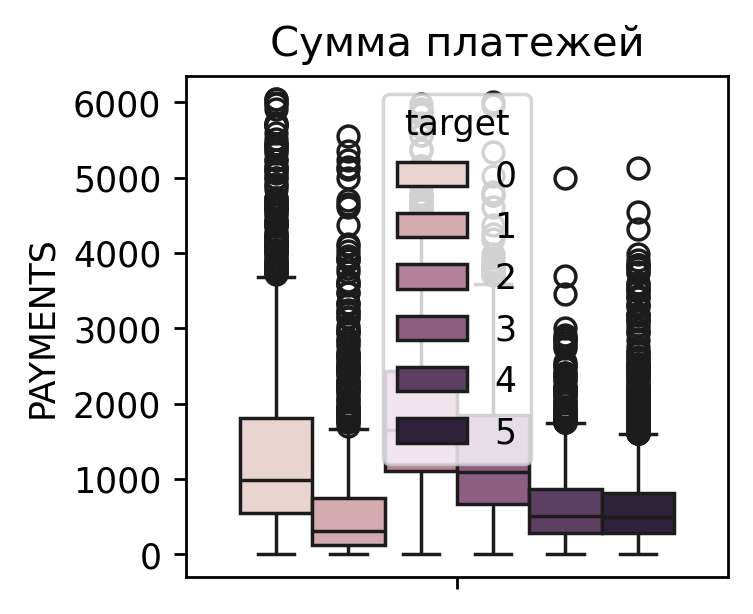

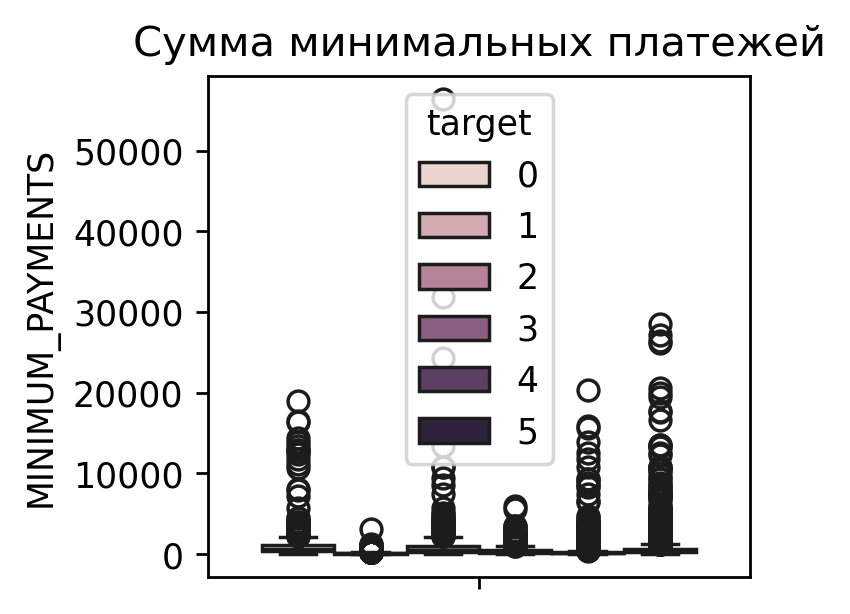

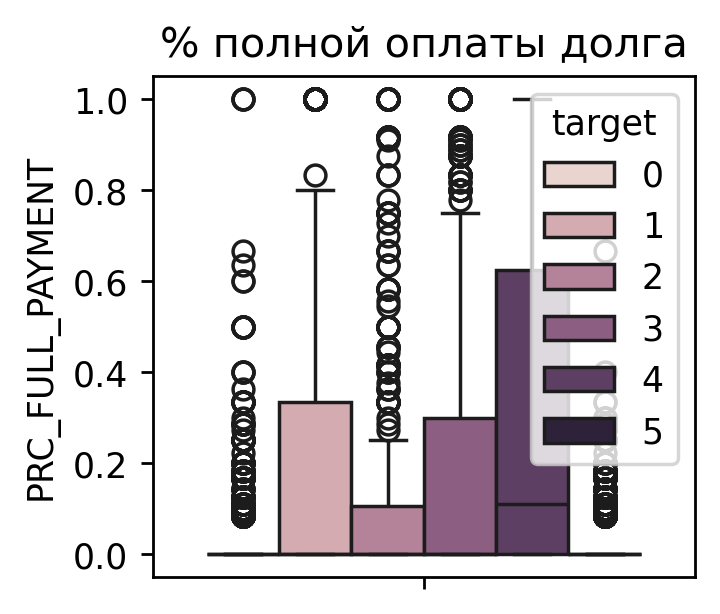

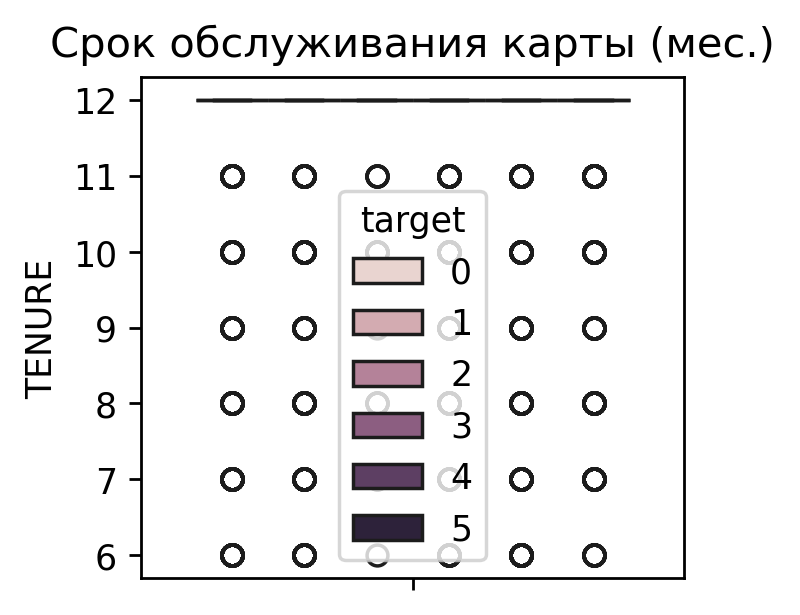

In [434]:
for col in df.drop("target", axis=1).columns:
    boxplot_hue_target(df, col, feature_translation_dict)

### Финальный результат
- Таргет 0 - клиенты, которые часто совершают покупки, такие клиенты нужны банку
- Таргет 1 - клиенты, которые редко пользуются картой,  могут быть подростки, у который не так часто водятся деньги
- Таргет 2 - клиенты, которые держат деньги на карте имеют минимальные задолжности и неплохой лимит по карте, такие клинты тоже нужны
- Таргет 3 - клиенты, которые часто выплачивают долг
- Таргет 4 - клиенты, у которых недавно появилась карта, имеют самый низкий кредитный лимит
- Таргет 5 - спящие клиенты, которые особо не полбзуются картой

In [435]:
#Используем PCA для двумерного анализа
transformer = PCA(n_components=2)
pca_data_2 = pd.DataFrame(data=transformer.fit_transform(df_scaled))
pca_df_2 = pd.concat([pca_data_2, predict], axis=1)
pca_df_2.rename(columns={"col": "target"}, inplace=True)

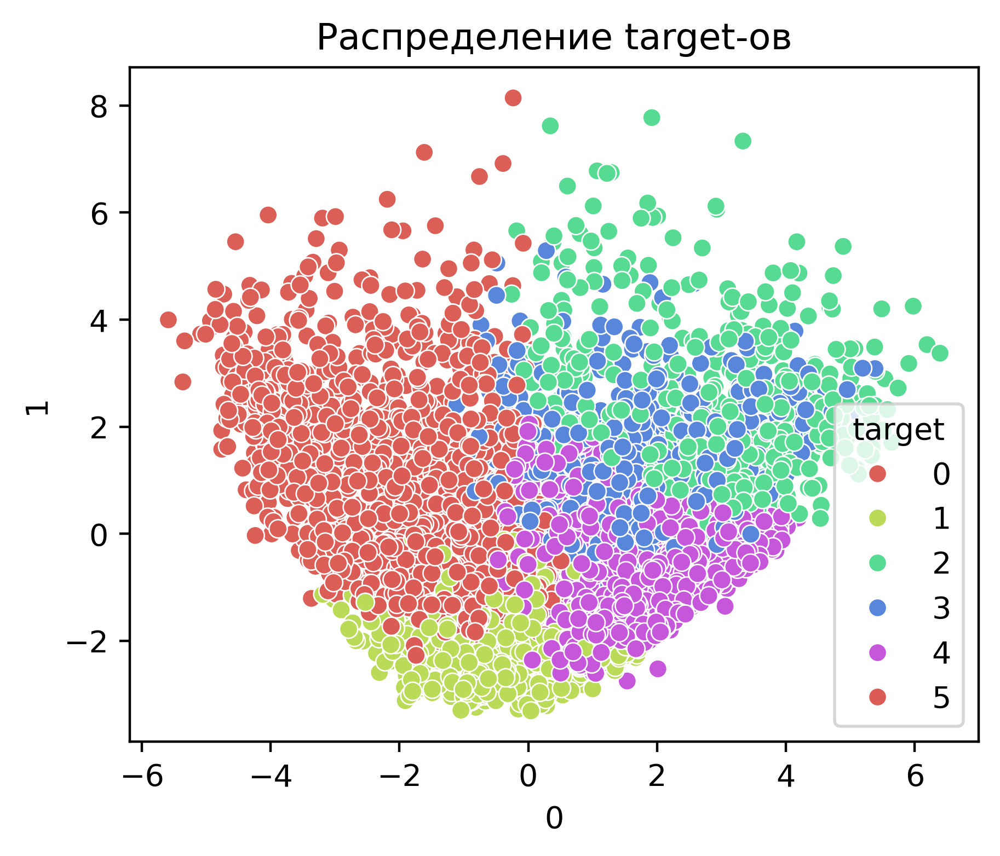

In [436]:
#Блок кода, который показывает распределение целевых переменных в двумерном пространстве
fig = plt.figure(figsize=(5, 4), dpi=400)
plt.title("Распределение target-ов")
sns.scatterplot(data=pca_df_2, x=0, y=1, hue="target", palette="hls")
plt.show()

In [437]:
#Используем PCA для трехмерного анализа
transformer = PCA(n_components=3)
pca_data_3 = pd.DataFrame(data=transformer.fit_transform(df_scaled))
pca_df_3 = pd.concat([pca_data_3, predict], axis=1)
pca_df_3.rename(columns={"col": "target"}, inplace=True)

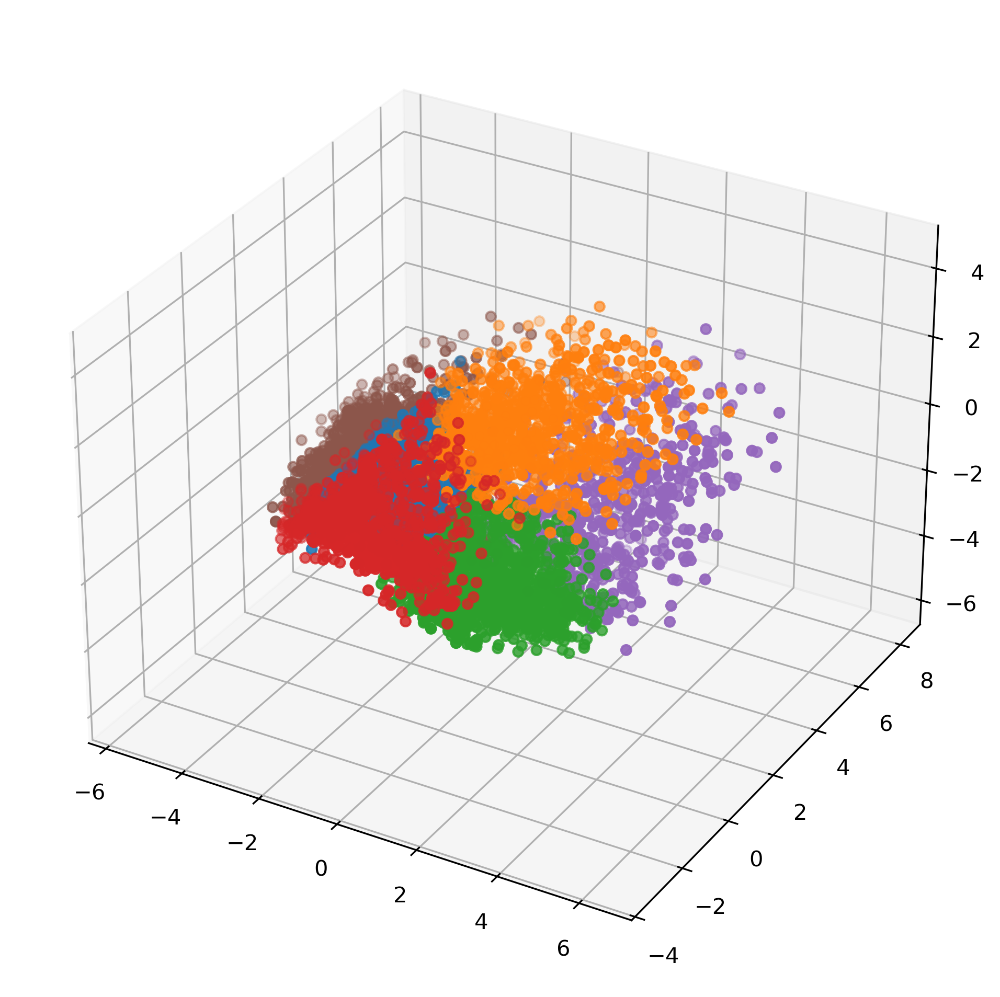

In [438]:
##Блок кода, который показывает распределение целевых переменных в трехмерном пространстве
fig = plt.figure(figsize=(10, 8), dpi=300)
ax = fig.add_subplot(111, projection="3d")
for cluster_num in pca_df_3["target"].unique():
    cluster_data = pca_df_3[pca_df_3["target"] == cluster_num]
    
    ax.scatter(
        xs=cluster_data[0], 
        ys=cluster_data[1], 
        zs=cluster_data[2],     
        label=f'Кластер {cluster_num}' 
    )
plt.show()

In [648]:
#Теперь построим модель DBSCAN
intraclass_distance_dict = {}
intercluster_distance_dict = {}
counter_cluster = {}
silhouette_dict = {}
calinski_harabasz_dict = {}
davies_bouldin_dict = {}
#Глобальный центр для всех объектов 
global_centers = np.mean(df_scaled, axis=0)

for eps in np.array(list(range(1, 30))) * 0.1:
    for sample in range(4, 16):
        model = DBSCAN(eps=eps, min_samples=sample, n_jobs=-1)

        predict = pd.Series(model.fit_predict(df_scaled))
        sum_distance_intraclass, intercluster_distance = 0, 0
        if 2 <= predict[predict!=-1].nunique() <= 6 and len(predict[predict==-1]) / len(predict) <= 0.17:
            for j in predict[predict!=-1].unique():
                #Считаем внутриклассовое и межкластерое расстояние
                indexes_intraclass = predict[predict==j].index
                df_intraclass_j = df_scaled.loc[indexes_intraclass]
                center = np.mean(df_intraclass_j, axis=0)
                sum_distance_intraclass += float(np.sum((df_intraclass_j - center)**2, axis=1).sum())
        
                len_class_j = len(indexes_intraclass)
                center_j = np.mean(df_intraclass_j, axis=0)
                intercluster_distance += len_class_j * float(((global_centers - center_j)**2).sum())
        else:
            continue
        #Добавляем в словарики
        intraclass_distance_dict[f"eps: {round(eps, 1)}, sample: {sample}"] = sum_distance_intraclass
        intercluster_distance_dict[f"eps: {round(eps, 1)}, sample: {sample}"] = intercluster_distance
        counter_cluster[f"eps: {round(eps, 1)}, sample: {sample}"] = predict[predict!=-1].nunique()
        silhouette_dict[f"eps: {round(eps, 1)}, sample: {sample}"] = silhouette_score(df_scaled, predict)
        calinski_harabasz_dict[f"eps: {round(eps, 1)}, sample: {sample}"] = calinski_harabasz_score(df_scaled, predict)
        davies_bouldin_dict[f"eps: {round(eps, 1)}, sample: {sample}"] = davies_bouldin_score(df_scaled, predict)

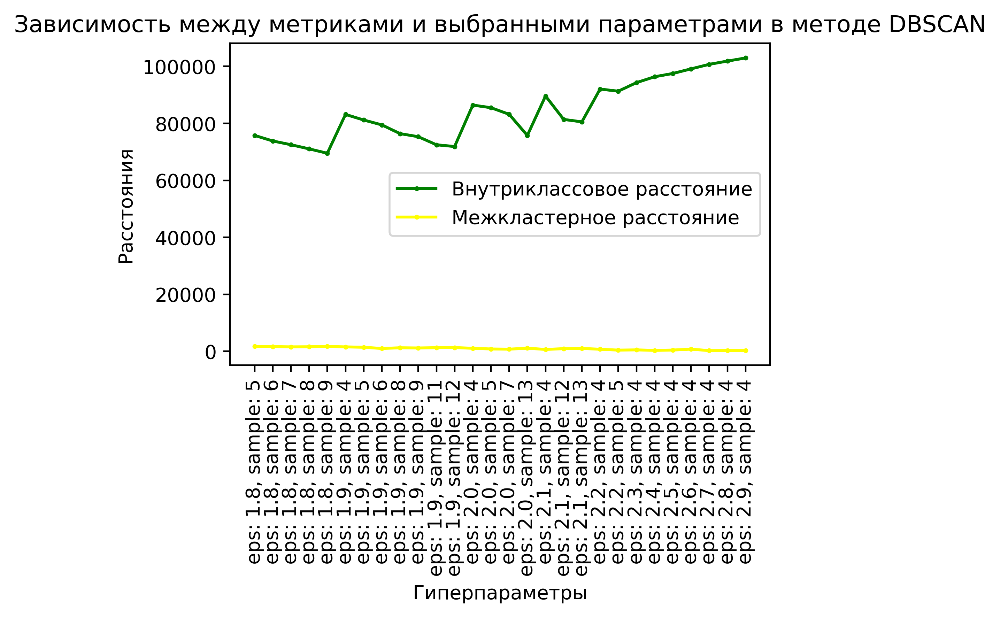

In [649]:
fig = plt.figure(figsize=(5, 3), dpi=400)
plt.title("Зависимость между метриками и выбранными параметрами в методе DBSCAN")
plt.ylabel("Расстояния")
plt.xlabel("Гиперпараметры")
plt.plot(intraclass_distance_dict.keys(), intraclass_distance_dict.values(), color="green", marker=".", markersize=3, label="Внутриклассовое расстояние")
plt.plot(intercluster_distance_dict.keys(), intercluster_distance_dict.values(), color="yellow", marker=".", markersize=3, label="Межкластерное расстояние")
plt.xticks(rotation=90)
plt.legend()
plt.show()

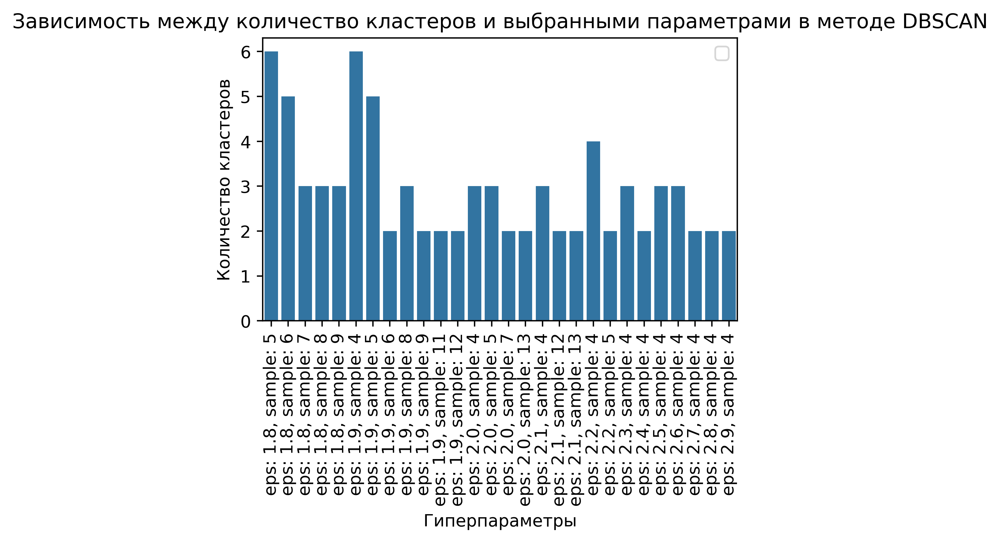

In [650]:
fig = plt.figure(figsize=(5, 3), dpi=400)
plt.title("Зависимость между количество кластеров и выбранными параметрами в методе DBSCAN")
plt.ylabel("Количество кластеров")
plt.xlabel("Гиперпараметры")
sns.barplot(x=counter_cluster.keys(), y=counter_cluster.values())
plt.xticks(rotation=90)
plt.legend()
plt.show()

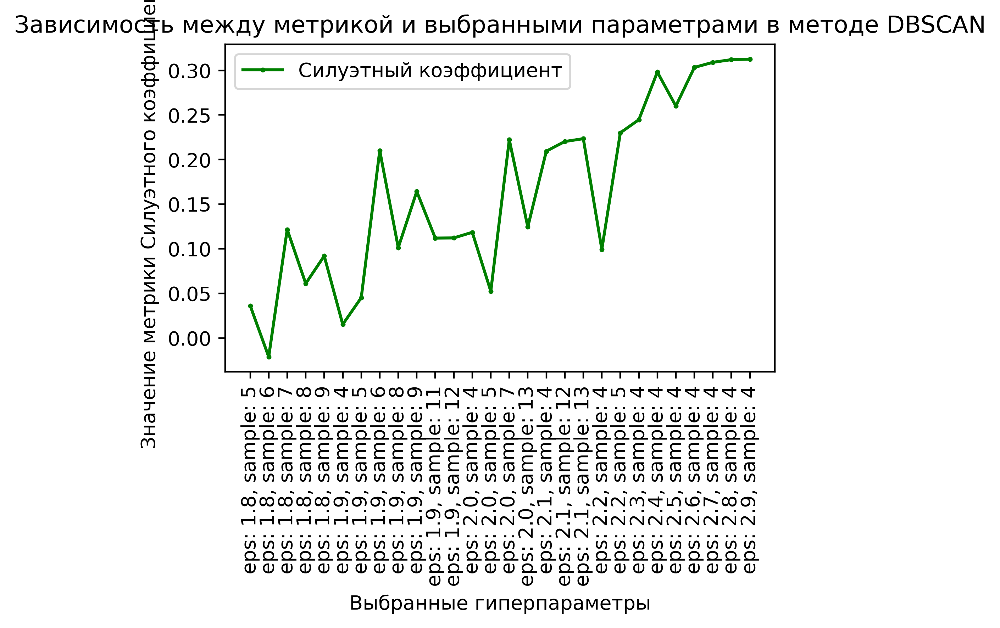

In [651]:
fig = plt.figure(figsize=(5, 3), dpi=400)
plt.title("Зависимость между метрикой и выбранными параметрами в методе DBSCAN")
plt.ylabel("Значение метрики Силуэтного коэффициента")
plt.xlabel("Выбранные гиперпараметры")
plt.plot(silhouette_dict.keys(), silhouette_dict.values(), color="green", marker=".", markersize=3, label="Силуэтный коэффициент")
plt.xticks(rotation=90)
plt.legend()
plt.show()

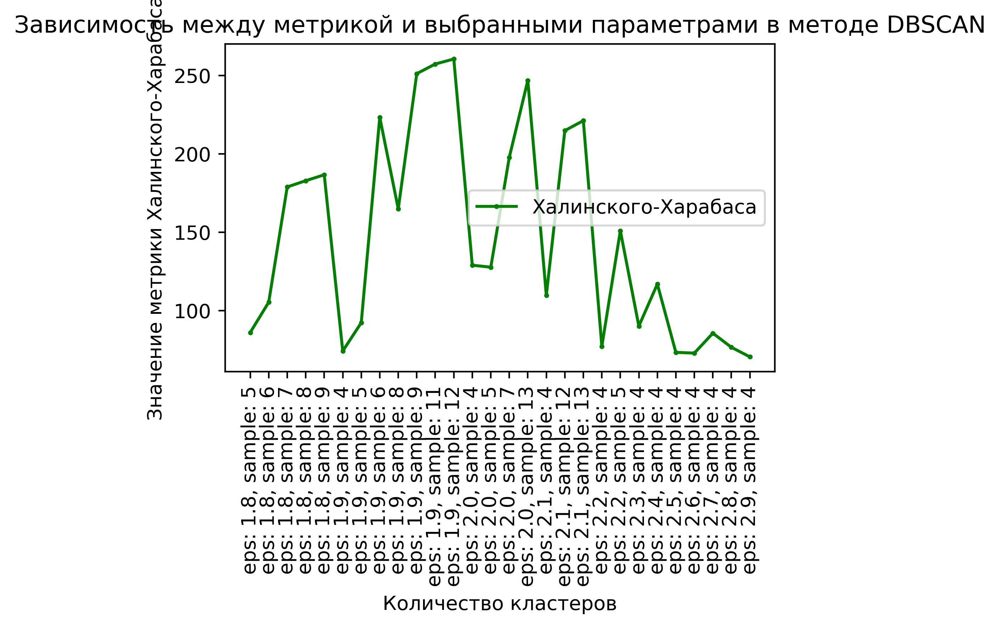

In [652]:
fig = plt.figure(figsize=(5, 3), dpi=400)
plt.title("Зависимость между метрикой и выбранными параметрами в методе DBSCAN")
plt.ylabel("Значение метрики Халинского-Харабаса")
plt.xlabel("Количество кластеров")
plt.plot(calinski_harabasz_dict.keys(), calinski_harabasz_dict.values(), color="green", marker=".", markersize=3, label="Халинского-Харабаса")
plt.xticks(rotation=90)
plt.legend()
plt.show()

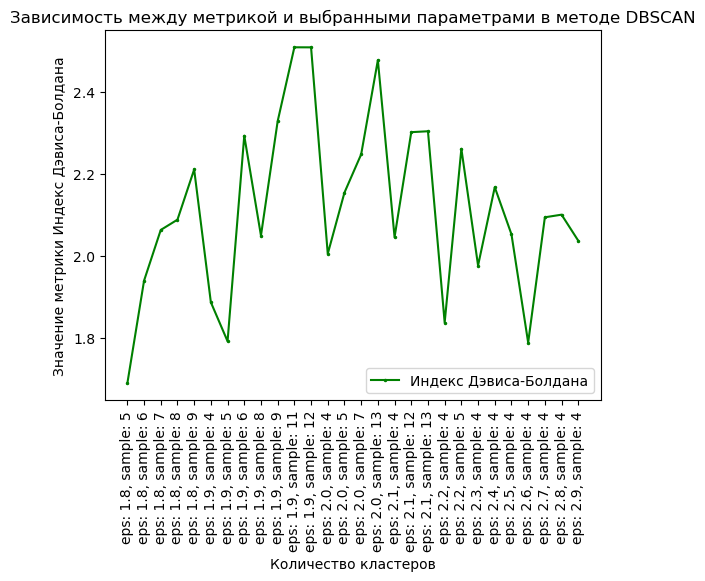

In [653]:
plt.title("Зависимость между метрикой и выбранными параметрами в методе DBSCAN")
plt.ylabel("Значение метрики Индекс Дэвиса-Болдана")
plt.xlabel("Количество кластеров")
plt.plot(davies_bouldin_dict.keys(), davies_bouldin_dict.values(), color="green", marker=".", markersize=3, label="Индекс Дэвиса-Болдана")
plt.xticks(rotation=90)
plt.legend()
plt.show()

In [659]:
#Выберем гиперпараметры, где eps = 2.6, samples = 4
model = DBSCAN(eps=2.7, min_samples=4)
predict = model.fit_predict(df_scaled)
df["target"] = predict 

In [660]:
#Посмотрим сколько выбросов в нашей модели для нашей выборки 
print(f"Количество выбросов: {round(len(df[df["target"]==-1]) / len(df) * 100, 3)}%")
#Все 5.5%, что является очень хорошим результатом

Количество выбросов: 2.056%


In [661]:
#Посмотрим на соотношение классов
print(df[df["target"]!=-1]["target"].value_counts(normalize=True))

target
0    0.999409
1    0.000591
Name: proportion, dtype: float64


In [662]:
df[df["target"]!=-1].groupby("target").mean()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
target,,,,,,,,,,,,,,,,
0,996.765664,0.857510,287.871105,238.549046,468.406307,0.460149,0.158897,0.337900,0.091687,1.717604,9.367604,3406.760885,925.557845,541.985260,0.147459,11.510799
1,3183.592561,0.944445,30.000000,946.830000,4063.327334,0.916667,0.031250,0.788195,0.472222,6.500000,16.250000,4375.000000,1172.340913,1176.876729,0.000000,8.000000


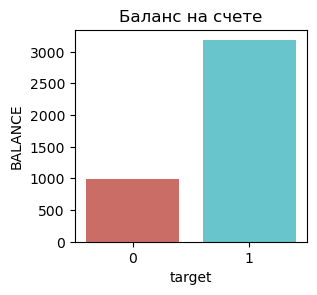

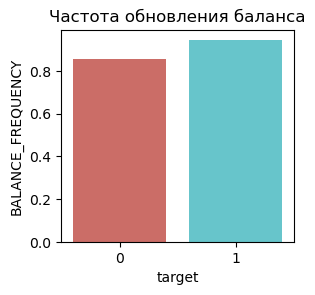

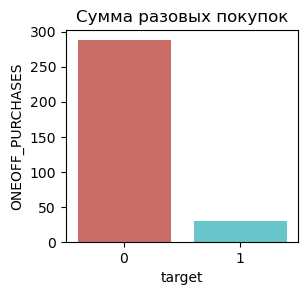

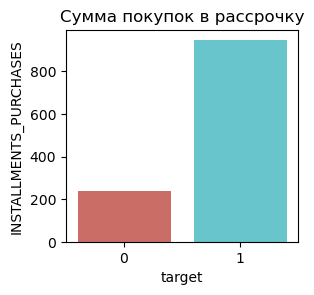

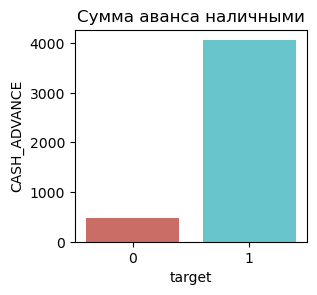

...

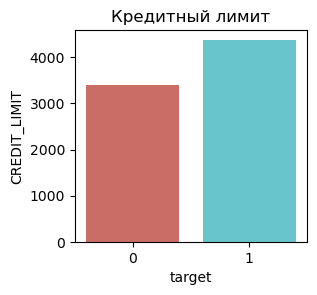

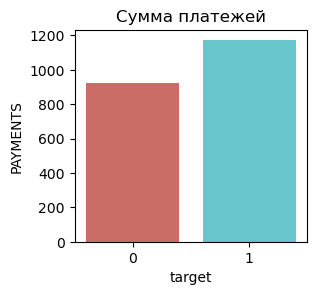

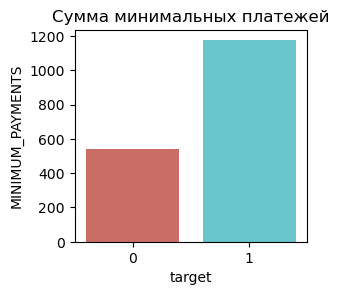

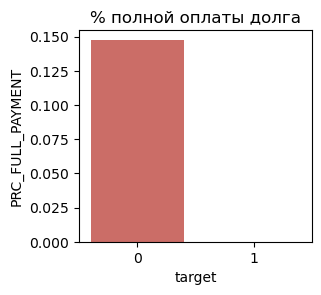

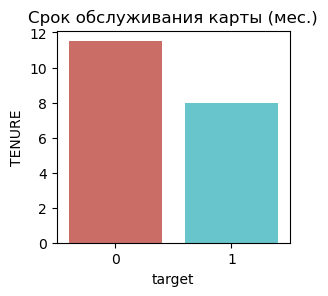

In [678]:
for col in df.drop("target", axis=1).columns:
    drow_barplot(df[df["target"]!=-1], col, feature_translation_dict)

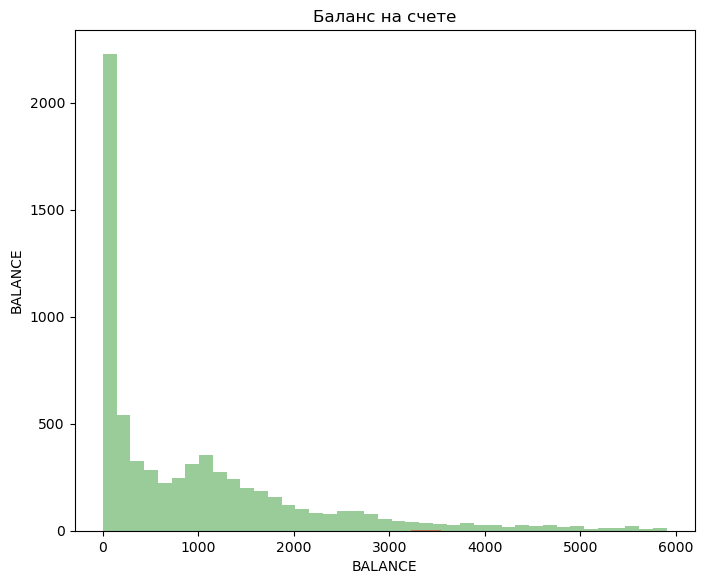

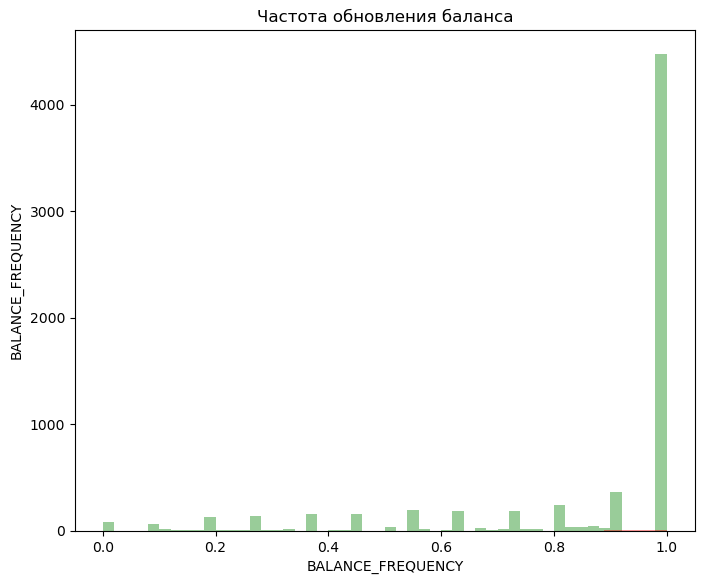

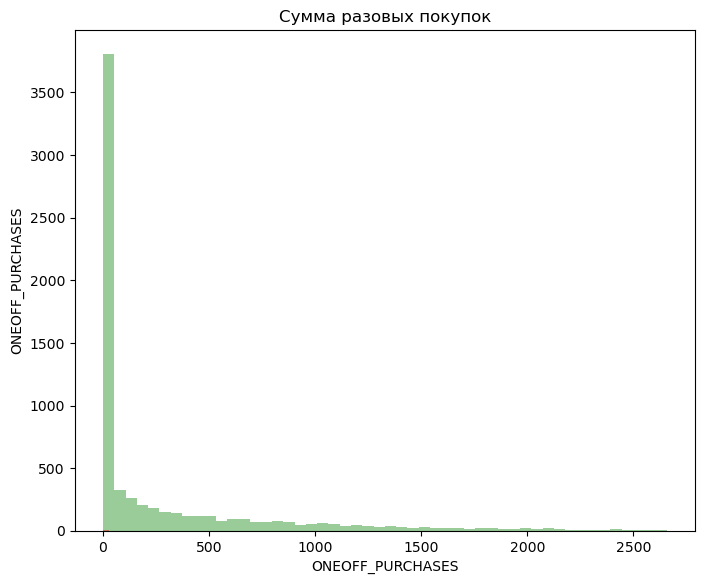

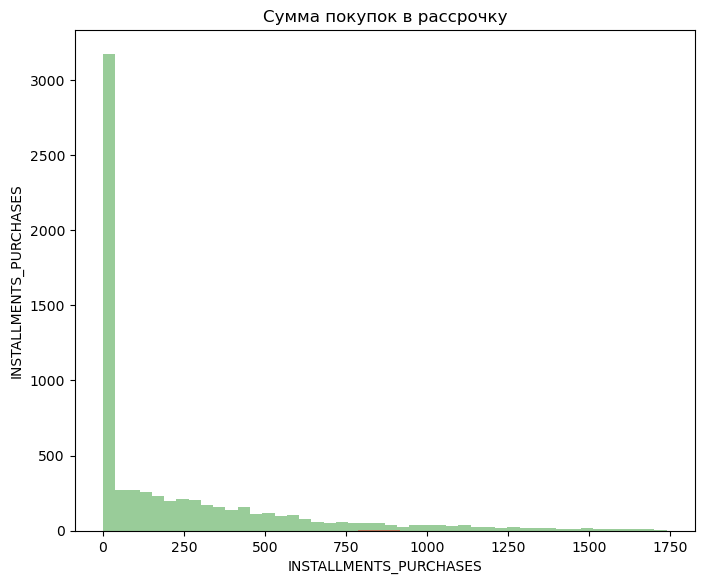

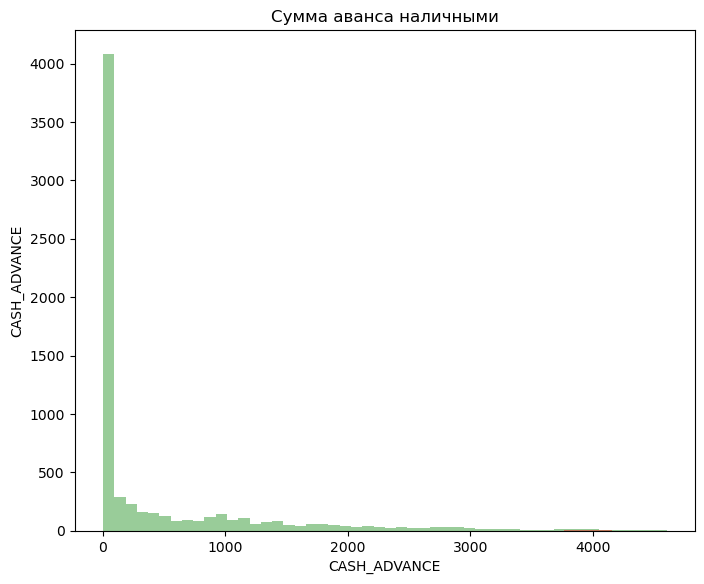

...

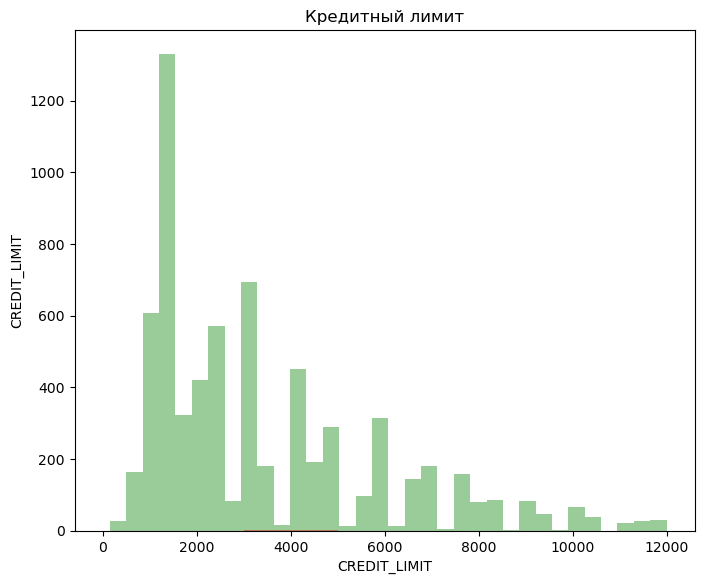

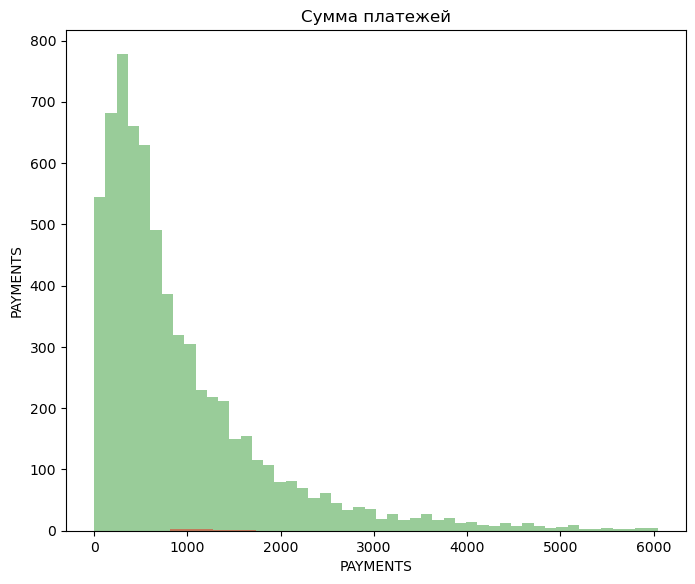

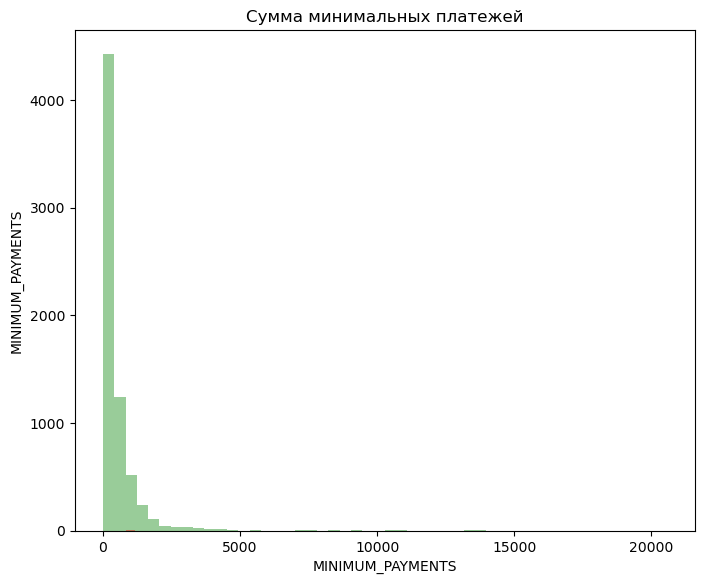

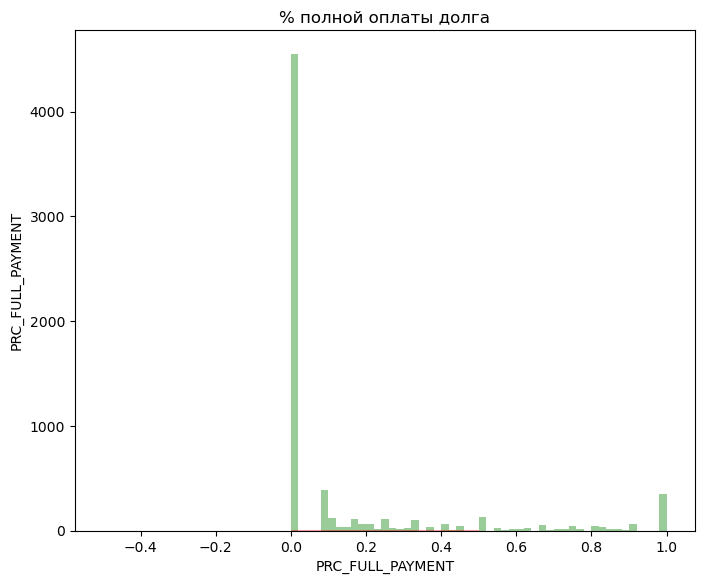

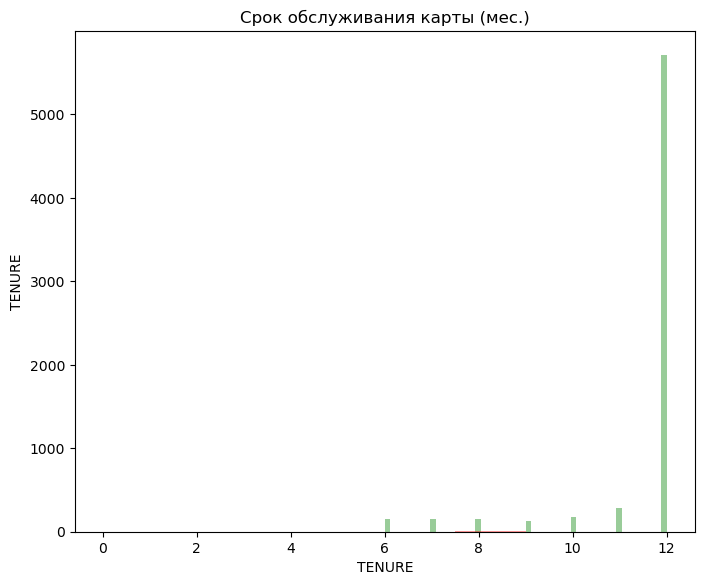

In [679]:
for col in df.drop("target", axis=1).columns:
    drow_distplot_4(df[df["target"]!=-1], col, feature_translation_dict)

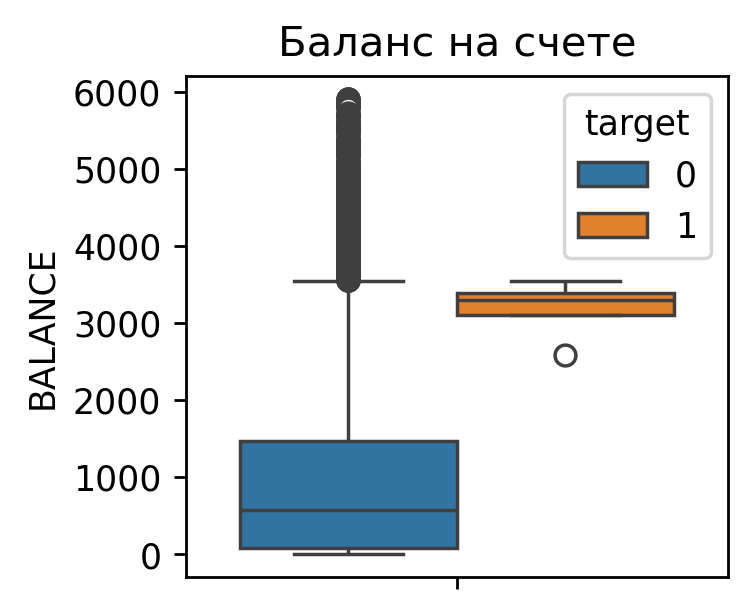

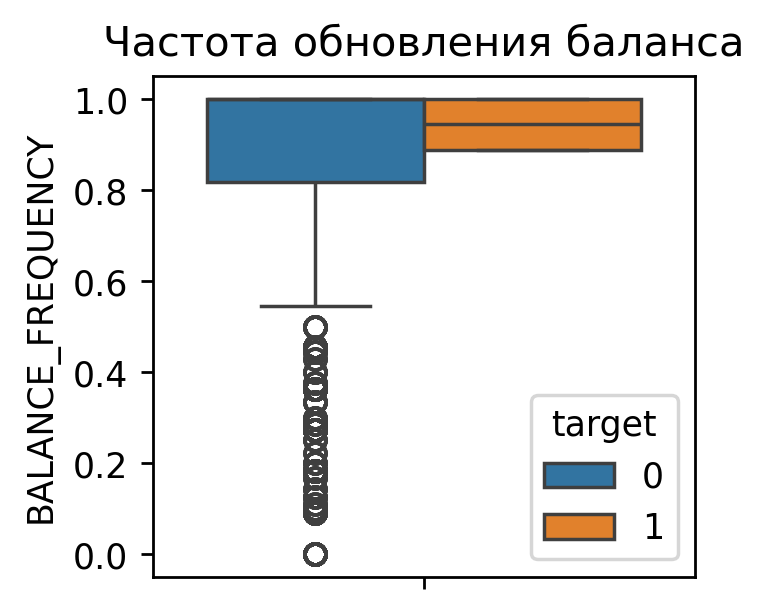

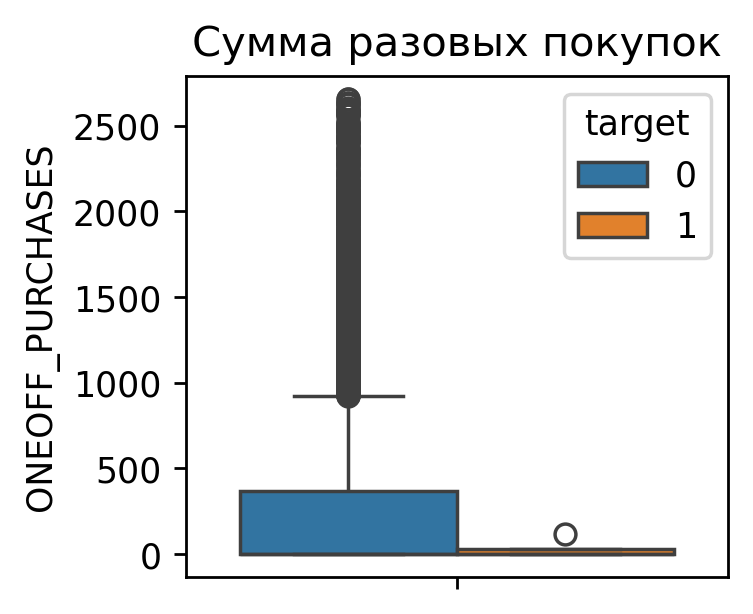

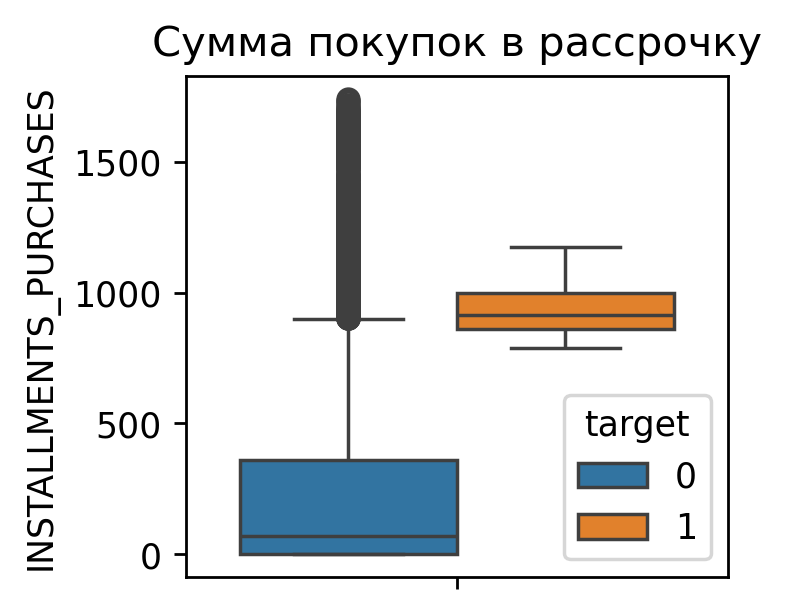

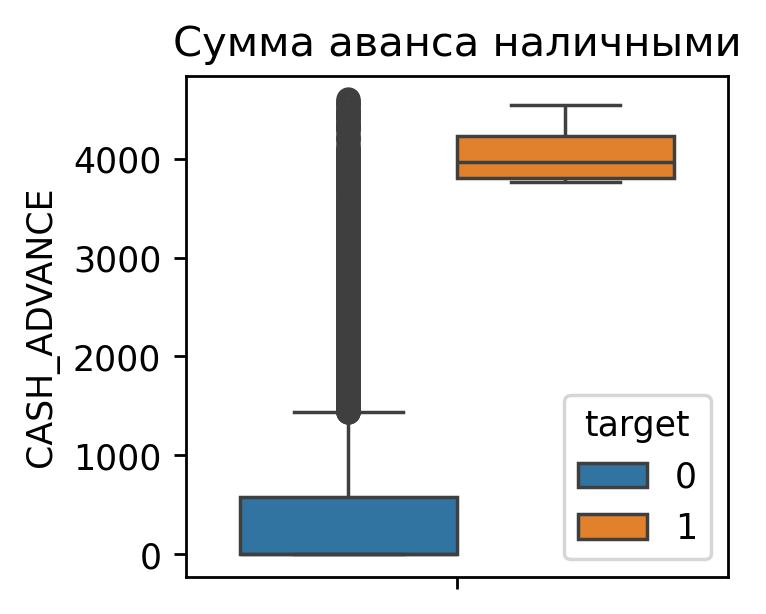

...

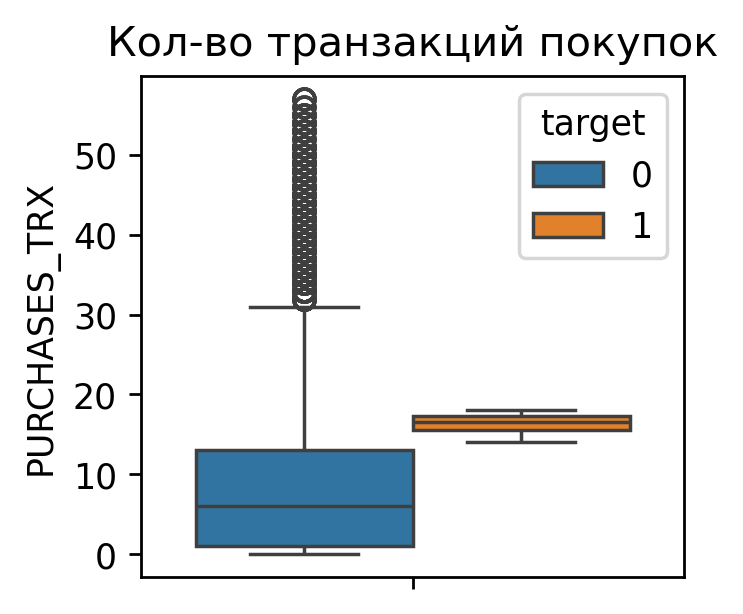

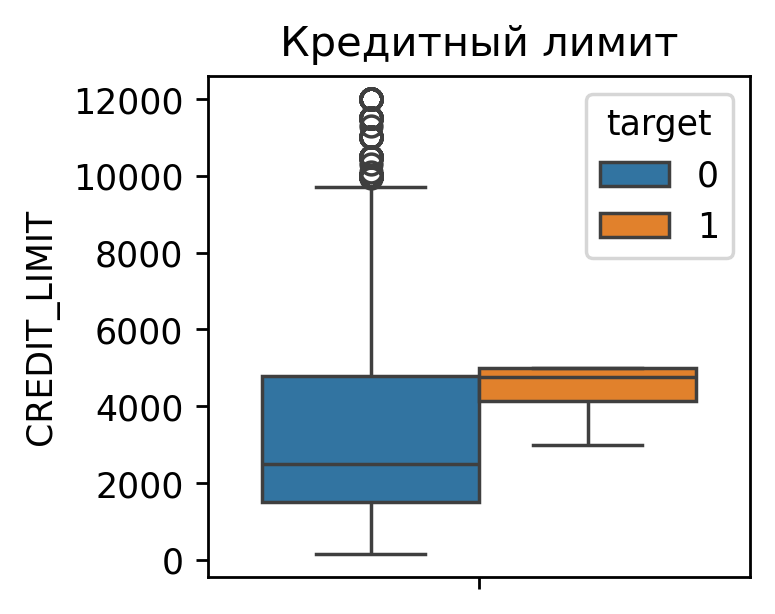

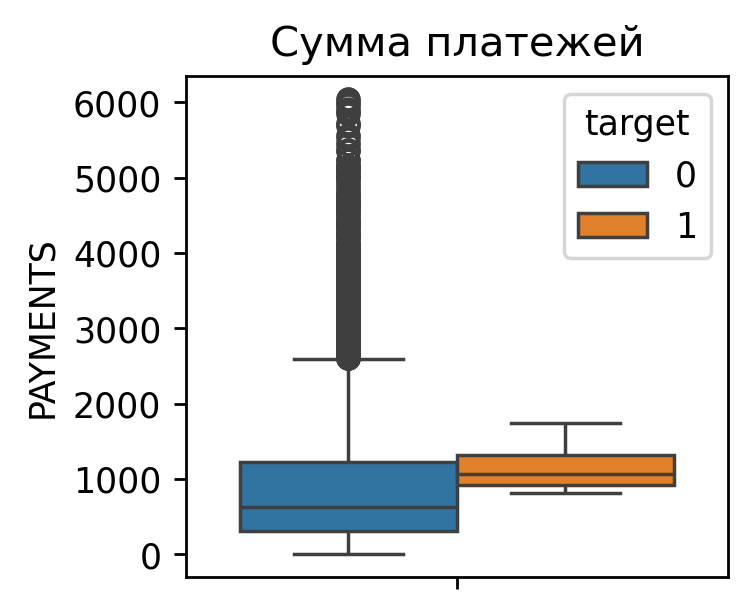

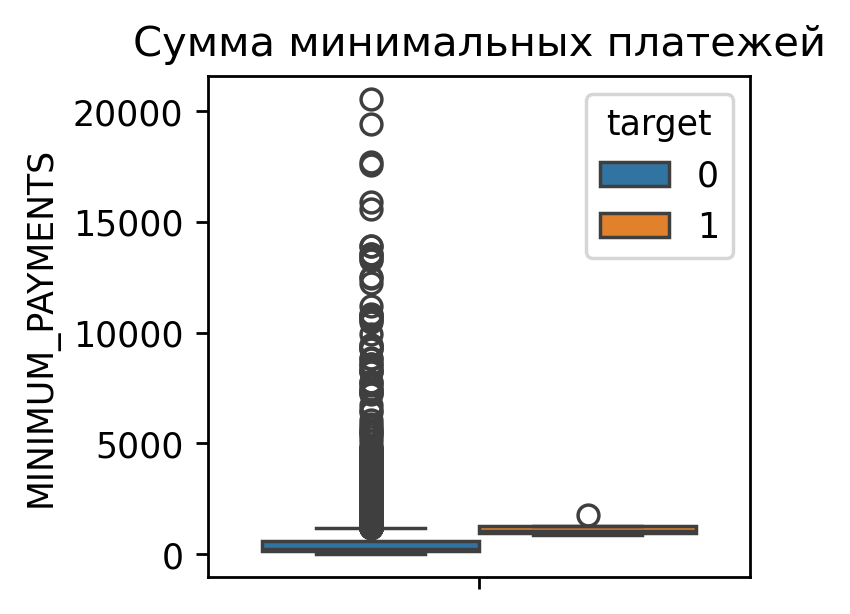

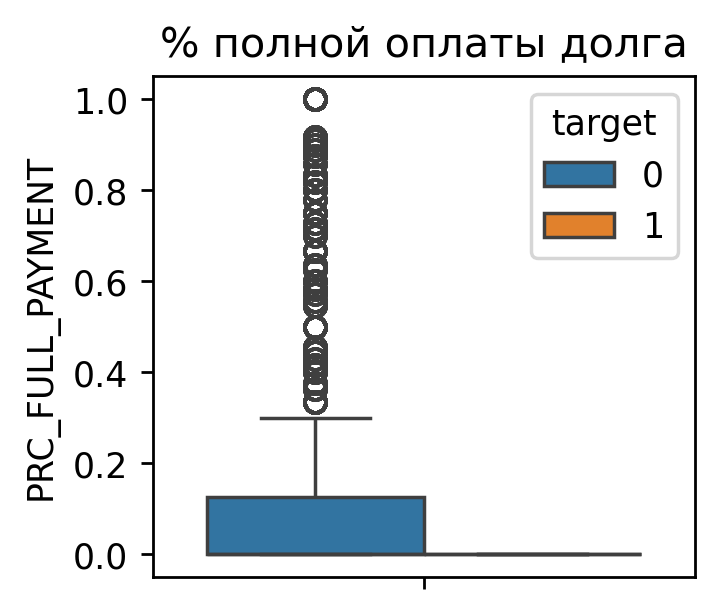

In [680]:
for col in df.drop(["target", "TENURE"], axis=1).columns:
    boxplot_hue_target(df[df["target"]!=-1], col, feature_translation_dict)

### Результат
- DBSCAN разделил классы с очень сильным дисбалансом

In [672]:
#Используем PCA для двумерного анализа
transformer = PCA(n_components=2)
pca_data_2 = pd.DataFrame(data=transformer.fit_transform(df_scaled))
predict = pd.DataFrame({"target": predict})
pca_df_2 = pd.concat([pca_data_2, predict], axis=1)

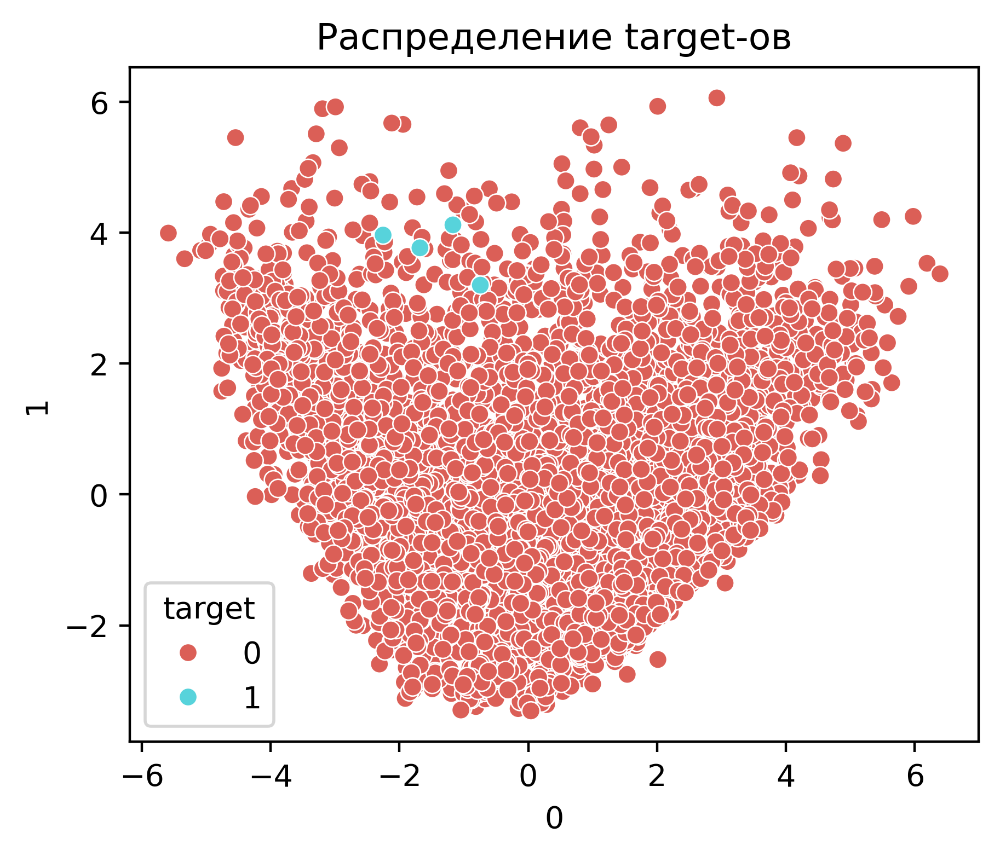

In [677]:
#Блок кода, который показывает распределение целевых переменных в двумерном пространстве
fig = plt.figure(figsize=(5, 4), dpi=400)
plt.title("Распределение target-ов")
sns.scatterplot(data=pca_df_2[pca_df_2["target"]!=-1], x=0, y=1, hue="target", palette="hls")
plt.show()

In [675]:
#Используем PCA для трехмерного анализа
transformer = PCA(n_components=3)
pca_data_3 = pd.DataFrame(data=transformer.fit_transform(df_scaled))
pca_df_3 = pd.concat([pca_data_3, predict], axis=1)
pca_df_3.rename(columns={"col": "target"}, inplace=True)

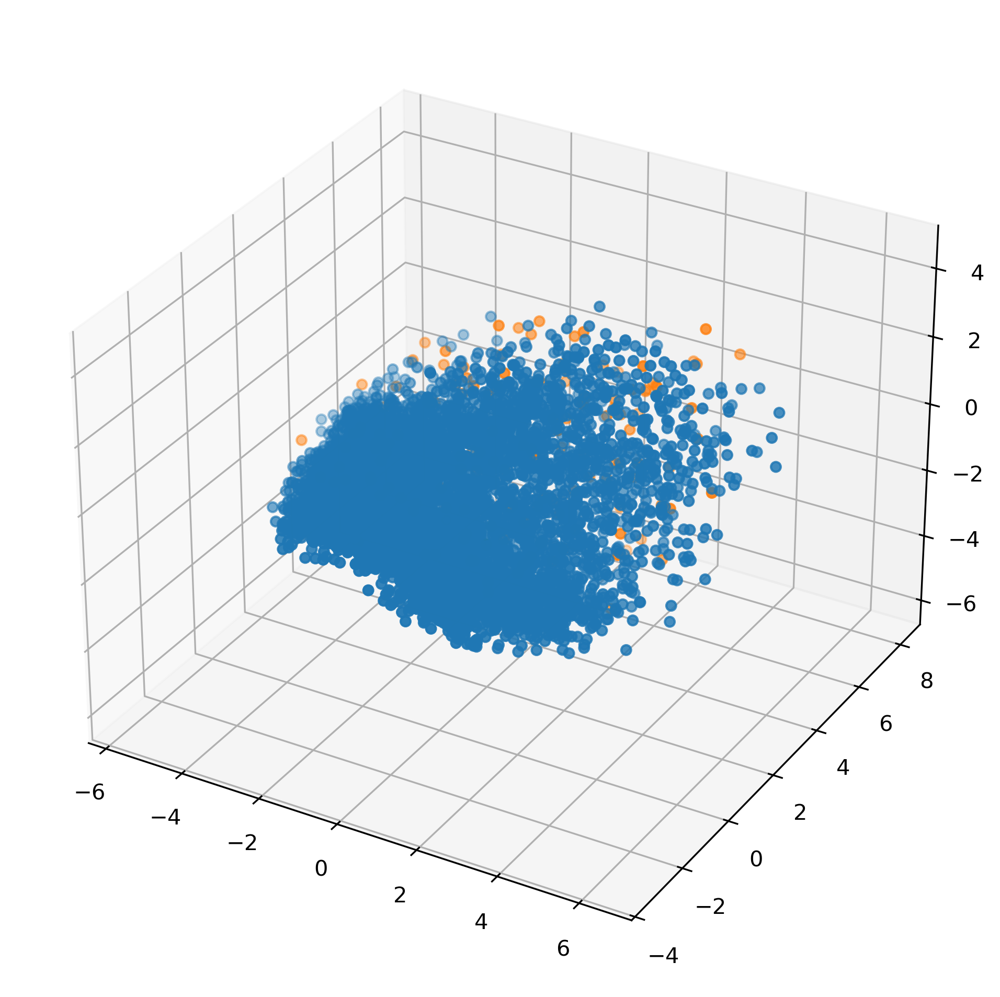

In [676]:
##Блок кода, который показывает распределение целевых переменных в трехмерном пространстве
fig = plt.figure(figsize=(10, 8), dpi=300)
ax = fig.add_subplot(111, projection="3d")
for cluster_num in pca_df_3["target"].unique():
    cluster_data = pca_df_3[pca_df_3["target"] == cluster_num]
    
    ax.scatter(
        xs=cluster_data[0], 
        ys=cluster_data[1], 
        zs=cluster_data[2],     
        label=f'Кластер {cluster_num}' 
    )
plt.show()